### Import the Necessary Packages:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as ss
import math
%matplotlib inline
import os

In [2]:
# Filtering out the warnings

import warnings
warnings.filterwarnings('ignore')

## Pandas Rows and columns configuration:

In [3]:
## set this display max columns and rows as 300,assuming max rows and columns can be 300.
pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)

## Business Problem Statement: 

## Approach:


####  1. Data Cleaning

####  2. Data Blending

####  3. Data Analysis- Univariate

####  4. Data Analysis- BiVariate

####  5. Data Analysis - Multivariate

####  6. Top 10 Correlation Features.

####  7. Insights High-level Summary

###  1. Data Cleaning:
####  1.1. Read CSV Files from Dataset Directory.
####  1.2. Missing Values Identification.
####  1.3. Missing Values Elimination.
####  1.4. Irrelvant columns Elimination.
####  1.5. Data Type Conversion
####   1.6. Conversion of Negative into Positive values.

#### 1.1 Read CSV Files from Dataset directory: 

In [4]:
## read application_dataset.csv 
file_path = os.path.join(os.getcwd(), os.getcwd()+"/Datasets", "application_data.csv")

In [5]:
file_path

'E:\\Upgrad_course\\credit-eda-git/Datasets\\application_data.csv'

In [6]:
application_dataset = pd.read_csv(file_path)

In [7]:
## see the data
application_dataset.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [8]:
application_dataset.shape

(307511, 122)

In [9]:
# Finding the Total records,Column, emtries & data types:
application_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [10]:
## columns in the dataset
print("Columns in the application_dataset : ", application_dataset.columns)

Columns in the application_dataset :  Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)


####  Read the previous Application Dataset: 

In [11]:
## read the previous application file as well.
previous_application_dataset = pd.read_csv(os.path.join(os.getcwd(), os.getcwd()+"/Datasets", "previous_application.csv"))

In [12]:
previous_application_dataset.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
previous_application_dataset.shape

(1670214, 37)

In [14]:
previous_application_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [15]:
## columns in the dataset
print("Columns in the Previous application_dataset : ", previous_application_dataset.columns)

Columns in the Previous application_dataset :  Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')


#### 1.2. Missing Values Identification:

In [16]:
def missing_value_percentage(df,threshold_to_identify):
    """
    In DataFrame,we need to convert various data types into structured one.

            Parameter(s):
            ------------
                df : DataFrame of the previous application dataset/application dataset
                threshold_to_identify : identify the missing values percentage which is greater than threshold.

            Return(s):
            ---------
                missing_value_df : Missing_value_dataframe
                
    """
    missing_value_df = pd.DataFrame(columns=["Column_Name","Missing_value_percentage"])
    for col in df.columns:
        missing_percentage = round((100*df[col].isna().sum())/(df.shape[0]),2)
        ## append each and every row and append calculated missing value field.
        missing_value_df = missing_value_df.append({"Column_Name":col,"Missing_value_percentage":missing_percentage},ignore_index=True)
    
    ## eliminate missing value percentage should be greater than threshold value
    missing_value_df = missing_value_df[missing_value_df["Missing_value_percentage"]>threshold_to_identify].sort_values(by="Missing_value_percentage",ascending=False).reset_index(drop=True)
    
    
    return missing_value_df
    

#### 1.2. Missing Values Identification for application_dataset:

In [17]:
## overall missing value percentage
missing_value_percentage(application_dataset,0.0)

,Column_Name,Missing_value_percentage
0,COMMONAREA_AVG,69.87
1,COMMONAREA_MODE,69.87
2,COMMONAREA_MEDI,69.87
3,NONLIVINGAPARTMENTS_MODE,69.43
4,NONLIVINGAPARTMENTS_AVG,69.43
5,NONLIVINGAPARTMENTS_MEDI,69.43
6,FONDKAPREMONT_MODE,68.39
7,LIVINGAPARTMENTS_MODE,68.35
8,LIVINGAPARTMENTS_MEDI,68.35
9,LIVINGAPARTMENTS_AVG,68.35


#### Observations for Application Dataset: 
#### 1.Total 64 columns has missing values out of 122 columns,we can ignore the columns whenever less than 40% percentage.
#### We have a problem if missing value percentage is greater than 40 percentage.

#### 2. Proportion of missing columns over total columns  = (64/122)*100 = 52%.
#### 3. Suggestion : Whenever missing value percentage is less than 5%, we can eliminate the records..!!

In [18]:
## greater than 40 percent missing values
missing_value_percentage(application_dataset,40.0)

,Column_Name,Missing_value_percentage
0,COMMONAREA_AVG,69.87
1,COMMONAREA_MEDI,69.87
2,COMMONAREA_MODE,69.87
3,NONLIVINGAPARTMENTS_MEDI,69.43
4,NONLIVINGAPARTMENTS_MODE,69.43
5,NONLIVINGAPARTMENTS_AVG,69.43
6,FONDKAPREMONT_MODE,68.39
7,LIVINGAPARTMENTS_MEDI,68.35
8,LIVINGAPARTMENTS_AVG,68.35
9,LIVINGAPARTMENTS_MODE,68.35


#### Observations for Application Dataset: 
#### 1.Total 49 columns has missing values out of 122 columns,we can eliminate them ,we cant do analysis witht the highest percentage values and we cant replace it.
#### 2. Final Proportion of missing columns over total columns  = (49/122)*100 = 40%.
#### 3. we eliminated 40% of the columns from the dataset and performing analysis for remaining 60% of the columns.


#### 1.3. Missing Values Elimination:

In [19]:
def missing_values_elimination(df,threshold_to_eliminate):
    """
    In DataFrame,we need to convert various data types into structured one.

            Parameter(s):
            ------------
                df : DataFrame of the previous application dataset/application dataset
                threshold_to_eliminate : Eliminate the missing values columns(missing_value_percentage>threshold) eliminate it

            Return(s):
            ---------
                final_df :  Elimination of few columns based on the threshold.
                
    """
    
    
    columns_to_drop = df.columns[df.isnull().sum() >= (threshold_to_eliminate*len(df))]
    
    print("{} columns are greater than threshold out of {} columns".format(len(columns_to_drop),len(df.columns)))    
    
    final_df = df.drop(columns_to_drop, axis = 1)
        
    print("New Columns Length:",len(final_df.columns))    

    return final_df

#### 1.3. Missing Values Elimination in Application Dataset:

In [20]:
Final_Application_dataset = missing_values_elimination(application_dataset,0.40)

49 columns are greater than threshold out of 122 columns
New Columns Length: 73


In [21]:
Final_Application_dataset.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


#### 1.2. Missing values Identification in Previous Application Dataset:

In [22]:
missing_value_percentage(previous_application_dataset,0.0)


,Column_Name,Missing_value_percentage
0,RATE_INTEREST_PRIMARY,99.64
1,RATE_INTEREST_PRIVILEGED,99.64
2,AMT_DOWN_PAYMENT,53.64
3,RATE_DOWN_PAYMENT,53.64
4,NAME_TYPE_SUITE,49.12
5,DAYS_FIRST_DRAWING,40.30
6,DAYS_FIRST_DUE,40.30
7,DAYS_LAST_DUE_1ST_VERSION,40.30
8,DAYS_LAST_DUE,40.30
9,DAYS_TERMINATION,40.30


### Observations for Previous Application Dataset: 

#### 1. As per the threshold,we can eliminate if particular column has missing value percentage greater than 40,but in previous application dataset, we have important columns will be lost for business problem statement.so increasing the threshold to 50%.
#### Important columns = ["Days_First_drawing", "days_termination","days_last_due","days_last_due_first_version","name_type_suite"]

#### 2.Total 14 columns has missing values out of 37 columns,we can ignore the columns whenever less than 50% percentage.
#### We have a problem if missing value percentage is greater than 50 percentage.

#### 3. Proportion of missing values columns over total columns  = (14/37)*100 = 37.8 %.
#### 4. Suggestion : Whenever missing value percentage is less than 5%, we can eliminate the records..!!

In [23]:
len(previous_application_dataset.columns)

37

In [24]:
missing_value_percentage(previous_application_dataset,50.0)


,Column_Name,Missing_value_percentage
0,RATE_INTEREST_PRIMARY,99.64
1,RATE_INTEREST_PRIVILEGED,99.64
2,AMT_DOWN_PAYMENT,53.64
3,RATE_DOWN_PAYMENT,53.64


#### Observations for Previous Application Dataset:

#### 1. Final Proportion of missing columns over total columns  = (4/37)*100 = 10 %.
#### 2. we eliminated 10% of the columns from the dataset and performing analysis for remaining 90% of the columns.

#### 1.3. Elimination of Missing values in previous_application_dataset: 

In [25]:
Final_Previous_Application_dataset = missing_values_elimination(previous_application_dataset,0.50)

4 columns are greater than threshold out of 37 columns
New Columns Length: 33


In [26]:
Final_Previous_Application_dataset.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


#### 1.4. Irrelevant columns Identification and Elimination:
#### Purpose : We have a lots of columns in the dataset,eliminate the unnecessary columns in both datasets.

In [27]:
unnecessary_columns_application_dataset = ['FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL',
                      'REGION_RATING_CLIENT_W_CITY', 'FLAG_EMAIL',
                      'FLAG_DOCUMENT_2','REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION',
                      'LIVE_REGION_NOT_WORK_REGION','FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4','FLAG_DOCUMENT_5',
                      'FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10',
                      'FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
                      'FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18',
                      'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
                       'EXT_SOURCE_2', 'EXT_SOURCE_3']

### Reasons for Irrelevant columns : 

####  External sources:
#### 1.These columns are irreleveant because it has the information collected from the external data,since we dont know the exact source from this data collected we cannot get any meaningful insights from them.
#### Flag Documents:
#### 2.Flag documents are the various types of documents provided by customer , since we dont know what types of documents provided by the customer, we can eliminate them completely.
#### Apartment Variables:
#### 3.These are the normalized information from the external source.These might not be helpful in analysis with target variable. 
   
#### Note: I am not eliminating these columns from the original dataset..!!


In [28]:
Final_Application_dataset = Final_Application_dataset.drop(columns=unnecessary_columns_application_dataset,axis=1)


#### Irrelevant columns in previous application dataset:

In [29]:
Final_Previous_Application_dataset.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE',
       'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO',
       'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'SELLERPLACE_AREA',
       'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT', 'NAME_YIELD_GROUP',
       'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
       'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

### 1.5. Data Types Conversion:

In [30]:
def data_types_conversion(df,string_columns,integer_columns,categorical_columns):
    """
    In DataFrame,we need to convert various data types into structured one.

            Parameter(s):
            ------------
                df : DataFrame 
                string_columns : string columns,these columns will be converted to string.
                integer_columns : integer_columns,these columns will be converted to integer
                categorical_columns : categorical columns,these columns will be converted to category.

            Return(s):
            ---------
                final_df :  Final Proper Dataframes should be mapped
                
    """
    df[string_columns] = df[string_columns].astype(str)
    

    df[integer_columns] =  df[integer_columns].astype(int,errors="ignore")
    
    df[categorical_columns] = df[categorical_columns].astype("category")
    
    
    return df

#### Data Types Conversion for application dataset:

In [31]:
## data types
Final_Application_dataset = data_types_conversion(Final_Application_dataset,
                                                  string_columns=["SK_ID_CURR","LIVE_CITY_NOT_WORK_CITY","REG_CITY_NOT_WORK_CITY","REG_CITY_NOT_LIVE_CITY","FLAG_MOBIL"],
                                                  
                                                  integer_columns=["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH","AMT_REQ_CREDIT_BUREAU_HOUR","AMT_REQ_CREDIT_BUREAU_DAY","AMT_REQ_CREDIT_BUREAU_WEEK","AMT_REQ_CREDIT_BUREAU_MON","AMT_REQ_CREDIT_BUREAU_QRT","AMT_REQ_CREDIT_BUREAU_YEAR","OBS_30_CNT_SOCIAL_CIRCLE","DEF_30_CNT_SOCIAL_CIRCLE","OBS_60_CNT_SOCIAL_CIRCLE","DEF_60_CNT_SOCIAL_CIRCLE"],
                                                 
                            categorical_columns = ["TARGET","NAME_CONTRACT_TYPE","CODE_GENDER","FLAG_OWN_CAR","FLAG_OWN_REALTY"])

In [32]:
## check whether data types is properly mapped or not 
Final_Application_dataset.dtypes

SK_ID_CURR                      object
TARGET                        category
NAME_CONTRACT_TYPE            category
CODE_GENDER                   category
FLAG_OWN_CAR                  category
FLAG_OWN_REALTY               category
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
DAYS_BIRTH                       int32
DAYS_EMPLOYED                    int32
DAYS_REGISTRATION              float64
DAYS_ID_PUBLISH                  int32
FLAG_MOBIL                      object
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
WEEKDAY_APPR_PROCESS_STAR

#### Data Types Conversion in Previous Application Dataset:

In [33]:
Final_Previous_Application_dataset = data_types_conversion(Final_Previous_Application_dataset,string_columns=["SK_ID_CURR","SK_ID_PREV"],integer_columns=["DAYS_FIRST_DRAWING","DAYS_FIRST_DUE", "DAYS_LAST_DUE_1ST_VERSION","DAYS_LAST_DUE","DAYS_TERMINATION"],
                                                          
                                                          
                                                          categorical_columns=["NAME_CONTRACT_TYPE","CODE_REJECT_REASON"])

In [34]:
Final_Previous_Application_dataset.dtypes

SK_ID_PREV                       object
SK_ID_CURR                       object
NAME_CONTRACT_TYPE             category
AMT_ANNUITY                     float64
AMT_APPLICATION                 float64
AMT_CREDIT                      float64
AMT_GOODS_PRICE                 float64
WEEKDAY_APPR_PROCESS_START       object
HOUR_APPR_PROCESS_START           int64
FLAG_LAST_APPL_PER_CONTRACT      object
NFLAG_LAST_APPL_IN_DAY            int64
NAME_CASH_LOAN_PURPOSE           object
NAME_CONTRACT_STATUS             object
DAYS_DECISION                     int64
NAME_PAYMENT_TYPE                object
CODE_REJECT_REASON             category
NAME_TYPE_SUITE                  object
NAME_CLIENT_TYPE                 object
NAME_GOODS_CATEGORY              object
NAME_PORTFOLIO                   object
NAME_PRODUCT_TYPE                object
CHANNEL_TYPE                     object
SELLERPLACE_AREA                  int64
NAME_SELLER_INDUSTRY             object
CNT_PAYMENT                     float64


In [35]:
Final_Previous_Application_dataset.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


#### Observations:
#### 1. Since no.of.days first drawing,last due cant be float, but we have missing values so conversion of float will not occur any major impact on analysis.

#### 1.6. Negative Values to Positive values conversion:

#### Purpose:
#### 1.Since Days birth,Days Employed cant be negative,so need to convert them into positive in application Dataset.


In [36]:
Final_Application_dataset[["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH"]] = Final_Application_dataset[["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH"]].apply(lambda x: abs(x),axis=1)


#### 1.6. Negaitve values to positive values conversion in Previous_application_dataset:

In [37]:
Final_Previous_Application_dataset[['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE','DAYS_LAST_DUE_1ST_VERSION','DAYS_TERMINATION','DAYS_DECISION','SELLERPLACE_AREA']] = Final_Previous_Application_dataset[['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE','DAYS_LAST_DUE_1ST_VERSION','DAYS_TERMINATION','DAYS_DECISION','SELLERPLACE_AREA']].abs()

#### 2. Data Blending:
#### 2.1 Identify the common columns in both datasets.
#### 2.2 Blend the both datasets with application dataset.

### 2.1 Identify the common columns in both datasets:

In [38]:
columns = pd.merge(pd.DataFrame(Final_Application_dataset.columns),pd.DataFrame(Final_Previous_Application_dataset.columns),how="inner")

In [39]:
columns

,0
0,SK_ID_CURR
1,NAME_CONTRACT_TYPE
2,AMT_CREDIT
3,AMT_ANNUITY
4,AMT_GOODS_PRICE
5,NAME_TYPE_SUITE
6,WEEKDAY_APPR_PROCESS_START
7,HOUR_APPR_PROCESS_START


In [40]:
merged_df = pd.merge(Final_Application_dataset,Final_Previous_Application_dataset , how = 'left' , on = 'SK_ID_CURR' , suffixes = ('_current' , '_previous'))
merged_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_current,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_current,AMT_ANNUITY_current,AMT_GOODS_PRICE_current,NAME_TYPE_SUITE_current,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START_current,HOUR_APPR_PROCESS_START_current,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,NAME_CONTRACT_TYPE_previous,AMT_ANNUITY_previous,AMT_APPLICATION,AMT_CREDIT_previous,AMT_GOODS_PRICE_previous,WEEKDAY_APPR_PROCESS_START_previous,HOUR_APPR_PROCESS_START_previous,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_previous,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461.0,637.0,3648.0,2120.0,1,Laborers,1.0,2,WEDNESDAY,10,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9.0,Y,1.0,XAP,Approved,606.0,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500.0,Auto technology,24.0,low_normal,POS other with interest,365243.0,565.0,125.0,25.0,17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765.0,1188.0,1186.0,291.0,1,Core staff,2.0,1,MONDAY,11,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12.0,Y,1.0,XNA,Approved,746.0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,1.0,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,716.0,386.0,536.0,527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765.0,1188.0,1186.0,291.0,1,Core staff,2.0,1,MONDAY,11,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17.0,Y,1.0,XAP,Approved,828.0,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400.0,Furniture,6.0,middle,POS industry with interest,365243.0,797.0,647.0,647.0,639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765.0,1188.0,1186.0,291.0,1,Core staff,2.0,1,MONDAY,11,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15.0,Y,1.0,XAP,Approved,2341.0,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200.0,Consumer electronics,12.0,middle,POS household with interest,365243.0,2310.0,1980.0,1980.0,1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046.0,225.0,4260.0,2531.0,1,Laborers,1.0,2,MONDAY,9,0,0,0,Government,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5.0,Y,1.0,XAP,Approved,815.0,Cash through the b

In [41]:
merged_df.shape

(1430155, 74)

### 2. Data Analysis- Univariate: 
#### 2.1 Univariate Analysis for Categorical Columns
#### 2.2 Univariate Analysis for Numerical columns and Bins/segmentation.

#### Univariate Data Analysis in Application Dataset:

In [42]:
def numerical_categorical_columns(df,operations):
    """
    In DataFrame,we need to convert various data types into structured one.

            Parameter(s):
            ------------
                df : DataFrame it contains the info of the application dataset/previous application dataset.
                operations: This will be key indicator to select the numerical or boolean and categorical columns from the given dataset.
            Return(s):
            ---------
                final_df :  Final Proper Dataframes should be mapped
                
    """
    
    if operations==["bool","object","category"]:
        
        categorical_columns = df.select_dtypes(include=["bool","object","category"]).columns
        
        return categorical_columns
    else:
        
        numerical_columns = df.select_dtypes(include=["number"]).columns
        
        return numerical_columns


In [43]:
categorical_columns = numerical_categorical_columns(Final_Application_dataset,["bool","object","category"])

In [44]:
categorical_columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE'],
      dtype='object')

In [45]:
print("Total {} columns are categorical out of {}".format(len(categorical_columns),len(Final_Application_dataset.columns)))

Total 18 columns are categorical out of 42


## Validate the Categorical columns data:

In [46]:
Final_Application_dataset[numerical_categorical_columns(Final_Application_dataset,["bool","object","category"])].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_MOBIL,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE
0,100002,1,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,1,Laborers,WEDNESDAY,0,0,0,Business Entity Type 3
1,100003,0,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,1,Core staff,MONDAY,0,0,0,School
2,100004,0,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,1,Laborers,MONDAY,0,0,0,Government
3,100006,0,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,1,Laborers,WEDNESDAY,0,0,0,Business Entity Type 3
4,100007,0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,1,Core staff,THURSDAY,0,1,1,Religion


In [47]:
df_0=Final_Application_dataset[Final_Application_dataset.TARGET==0]    
df_1=Final_Application_dataset[Final_Application_dataset.TARGET==1]

#### 2.1 Univariate Analysis for Categorical Columns:

#### Target Variable Percentage and Imbalance Percentage:

In [48]:
def univariate_barchart(df,column_name,title,threshold):  
    """
    This function will be useful for plotting the univariate bar chart distribution for every column.
    Parameter(s):
        ------------
            df : DataFrame it contains the info of the application dataset/previous application dataset.
            column_name: Name of the column,plotting will be done.
            title :  Title for the graph.
            threshold : eliminate bar chart percentages if it is less than the threshold.
            Return(s):
            ---------
                print the barplot graph with the percentages.           
    """
    plt.style.use('ggplot')
    
    df = df.groupby(column_name).agg({column_name:"count"})
    df["total_sum"] = df[column_name].sum()
    df["percentage"] = (df[column_name]/df["total_sum"])*100
    df = df.rename(columns={column_name:"individual_count"}).reset_index()
    df = df[df["percentage"]>threshold].reset_index(drop=True)
    
    sns.set_style("whitegrid")
    bar,(ax1) = plt.subplots(1,1,figsize=(10,6))
    sns.barplot(x=column_name, y='percentage', data=df, ci=None, palette="muted",orient='v',ax=ax1,dodge=False)
    ax1.set_title(title, fontsize=15)
    ax1.set_xlabel ("Distribution of "+ column_name + "Variable")
    ax1.set_ylabel ("Percentage Of "+ column_name + "Variable")
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, ha="right",fontsize = 12)

    # calculate the percentages and annotate the sns barplot
    for rect in ax1.patches:
        ax1.text (rect.get_x() + rect.get_width() / 2,rect.get_height(),"%.1f%%"% rect.get_height(), weight='bold' )

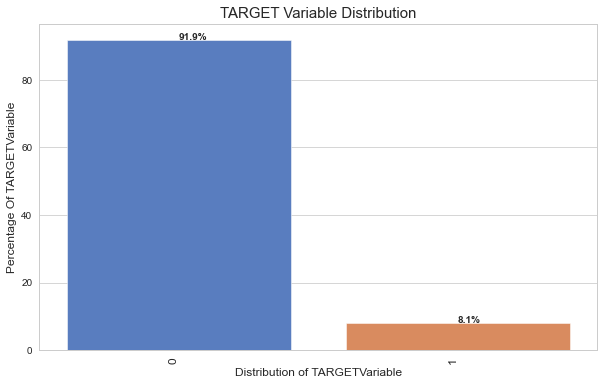

In [49]:
univariate_barchart(Final_Application_dataset,"TARGET","TARGET Variable Distribution",0.0)

#### Insights:

 1. Target Variable is highly imbalanced, Taget_0 = 91.9% & Target_1 = 8.1%
 2. Hence the Non- Defaulters contribution is very high & Defaulters contribution is comparatively less in the application dataset. 
 3. By segmenting data into Defaulters &Non Defaulters, we can visualize the reasons/factors for each segment. 


### Dataset Split with respective to Target Variable:

In [50]:
df_0=Final_Application_dataset[Final_Application_dataset.TARGET==0]   
df_1=Final_Application_dataset[Final_Application_dataset.TARGET==1]   

In [51]:
def univanal(var,df_0,df_1):
    """
    This function will be useful for plotting the univariate bar chart distribution for every column.
    Parameter(s):
        ------------
            var : variable_to_plot the bar charts.
            df_0 : Non-Defaulters Dataset
            df_1 : Defaulters Dataset.
            Return(s):
            ---------
                print the barplot graph with the percentages.           
    """
    
    plt.style.use('ggplot')
    sns.despine
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,6))
    
    sns.countplot(x=var, data=df_0,ax=ax1)
    ax1.set_ylabel('Total Counts')
    ax1.set_title(f'Distribution of {var} for Non-Defaulters',fontsize=15)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision between defaulter and non-defaulter
    for p in ax1.patches:
        ax1.annotate('{:.1f}%'.format((p.get_height()/len(df_0))*100), (p.get_x()+0.1, p.get_height()+50))
        
    sns.countplot(x=var, data=df_1,ax=ax2)
    ax2.set_ylabel('Total Counts')
    ax2.set_title(f'Distribution of {var} for Defaulters',fontsize=15)    
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
    
    # Adding the normalized percentage for easier comparision between defaulter and non-defaulter
    for p in ax2.patches:
        ax2.annotate('{:.1f}%'.format((p.get_height()/len(df_1))*100), (p.get_x()+0.1, p.get_height()+50))
    
    plt.show()

### Univariate Analysis for Code Gender:

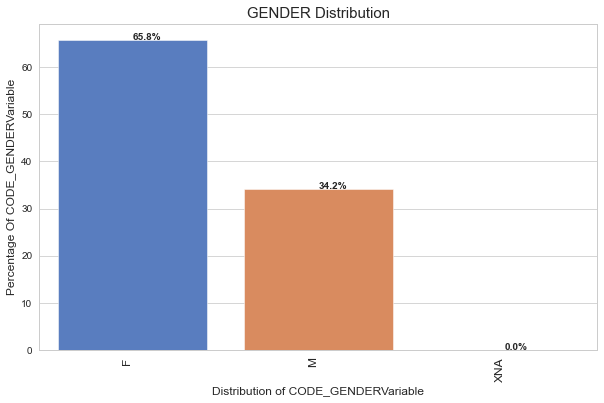

In [52]:
univariate_barchart(Final_Application_dataset,"CODE_GENDER","GENDER Distribution",0.0)

#### Overall Gender Distribution with respective to target variable:

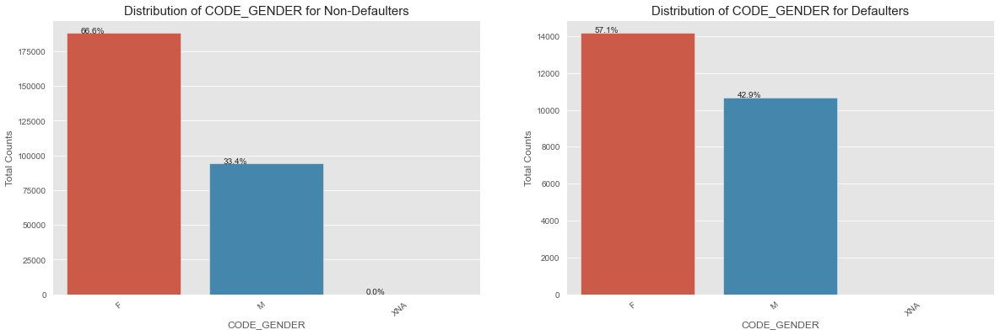

In [53]:
univanal("CODE_GENDER",df_0,df_1)

#### Insights:

 1.	Overall Gender Distribution in application dataset is , Female contributes 65.8%  over  Males who contribute only 34.2%
 2.	For Non-Defaulters, Females appear have a majority of 66.6% over Males with 33.4%.
 3.	For Defaulters, Females appear to be with a majority of 57.1% over Male with 42.9%.
 4.	Hence Female Gender appears to be the highest defaulters.


#### NAME_CONTRACT_TYPE:

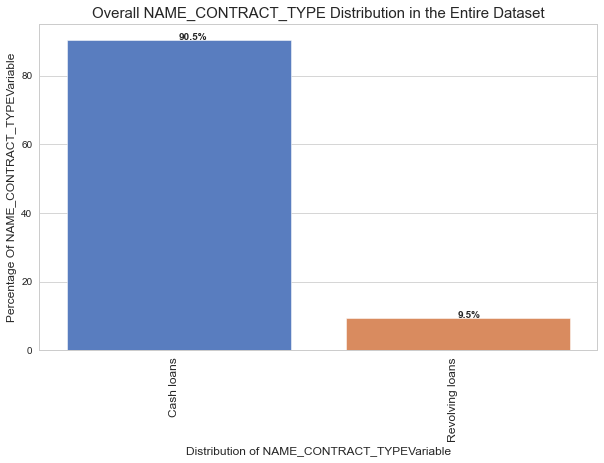

In [54]:
univariate_barchart(Final_Application_dataset,"NAME_CONTRACT_TYPE","Overall NAME_CONTRACT_TYPE Distribution in the Entire Dataset",0.0)

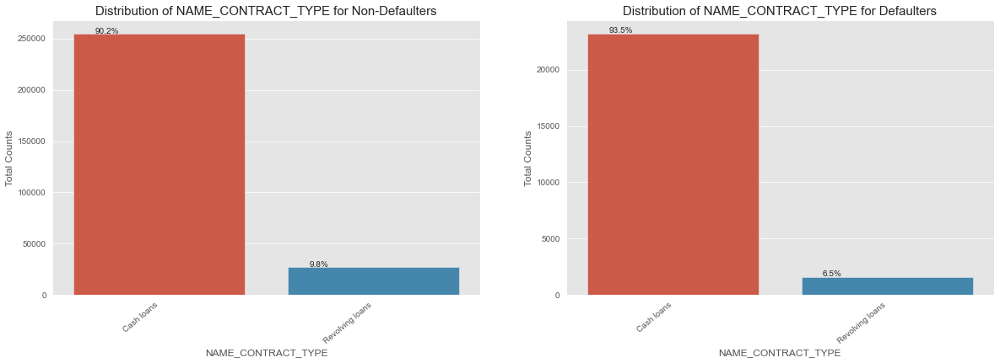

In [55]:
univanal("NAME_CONTRACT_TYPE",df_0,df_1)

#### Insights: 

1. Overall Distribution in the entire dataset for NAME_CONTRACT_TYPE - Cash Loans is 90.5%, & Revolving Loans is 9.5 %.
2. For Defaulters, Cash Loans is 90.2% & Revolving Loans is 9.8 %.
3. For Non-Defaulters, Cash Loans is 93.5% && Revolving Loans is 6.5%.
4. Hence Cash Loans appear to be the highest defaulters Contract Type.



### FLAG_OWN_CAR:

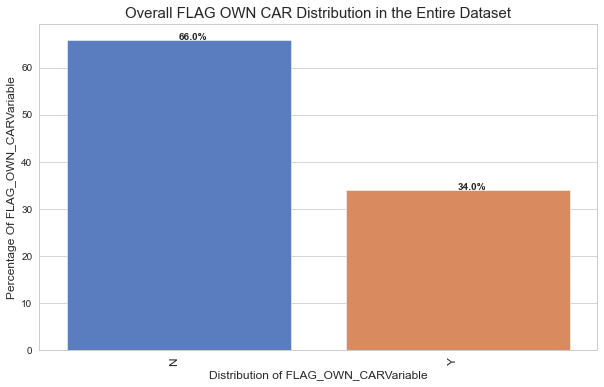

In [56]:
univariate_barchart(Final_Application_dataset,"FLAG_OWN_CAR","Overall FLAG OWN CAR Distribution in the Entire Dataset",0.0)

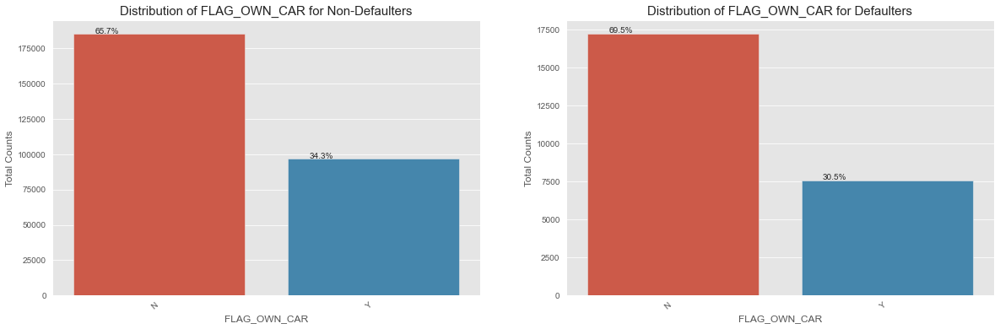

In [57]:
univanal("FLAG_OWN_CAR",df_0,df_1)

### Insights:

 1.	Overall Distribution in application dataset for FLAG_OWN_CAR - ‘No’ is 66.0% & ‘Yes’ is 34.0%.
 2.	For Non-Defaulters, ‘No’ is 65.7% & ‘Yes’ is 34.3%.
 3.	For Defaulters, ‘No’ is 69.5% & ‘Yes’ is 30.5%.
 4.	Hence the most Defaulters seems to have no Car.


### Flag Own Reality:

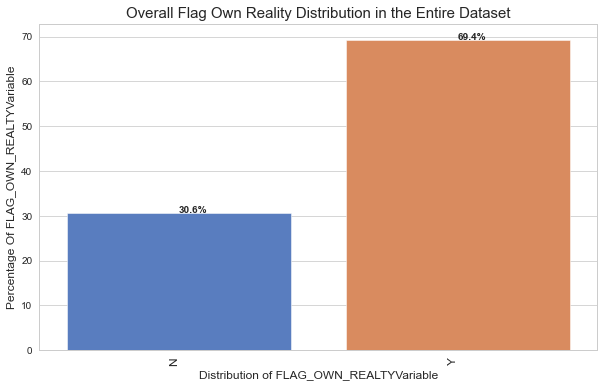

In [58]:
univariate_barchart(Final_Application_dataset,"FLAG_OWN_REALTY","Overall Flag Own Reality Distribution in the Entire Dataset",0.0)

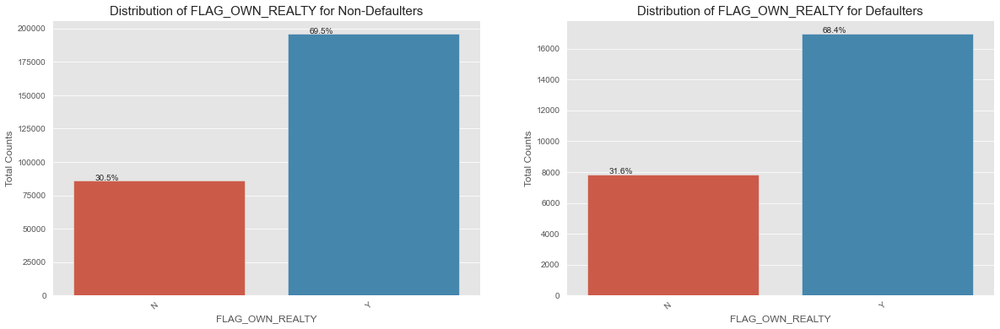

In [59]:
univanal("FLAG_OWN_REALTY",df_0,df_1)

#### Insights: 

 1.	In the application Dataset, majority of the clients who own Reality as an assetis 69.4% & who do not own a car is 30.6%.
 2.	For Non-Defaulters, who own Reality is 69.5% to that of who do not own a Reality is 30.5%.
 3.	For Defaulters, who own Reality is 68.4% over to those who do not own a Reality is 31.6%.
 4.	Hence Majority of the Defaulters own a Reality.


### NAME_TYPE_SUITE: 

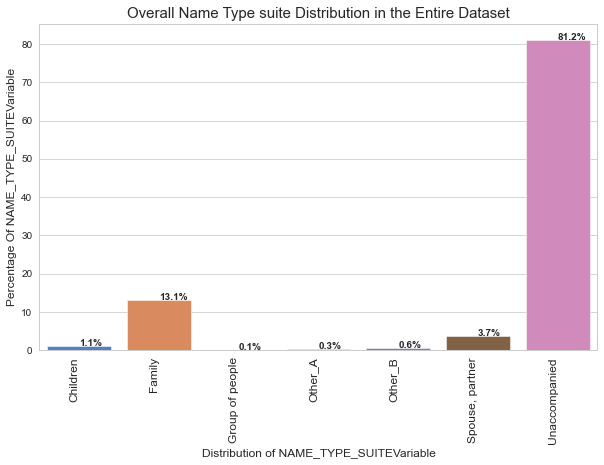

In [60]:
univariate_barchart(Final_Application_dataset,"NAME_TYPE_SUITE","Overall Name Type suite Distribution in the Entire Dataset",0.0)

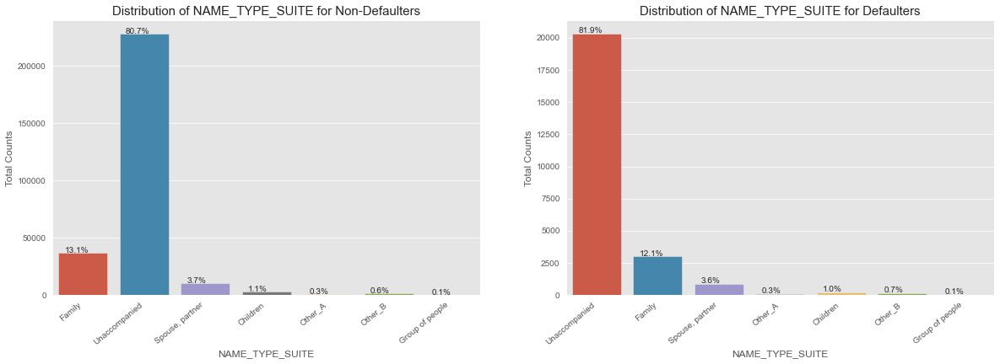

In [61]:
univanal("NAME_TYPE_SUITE",df_0,df_1)

### Insights:

 1. Unaccompanied appears to be the highest with 81.2 % of clients & Group of People appears to be the least with 0.1% type of Suite in the application dataset.
 2. Majority of the Non Defaulters are Unaccompanied with 80.7% and least is Group of People with 0.1%.
 3.Hence, Majority of the Defaulters are also Unaccompanied with 81.9% and the least is Group of People  with 0.1%.

## NAME Income Type:

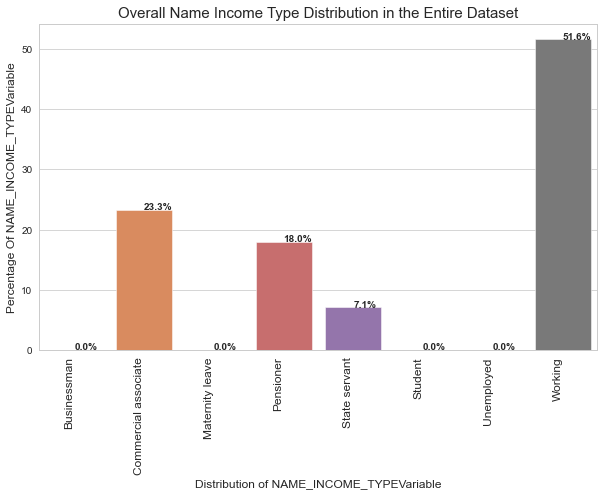

In [62]:
univariate_barchart(Final_Application_dataset,"NAME_INCOME_TYPE","Overall Name Income Type Distribution in the Entire Dataset",0.0)

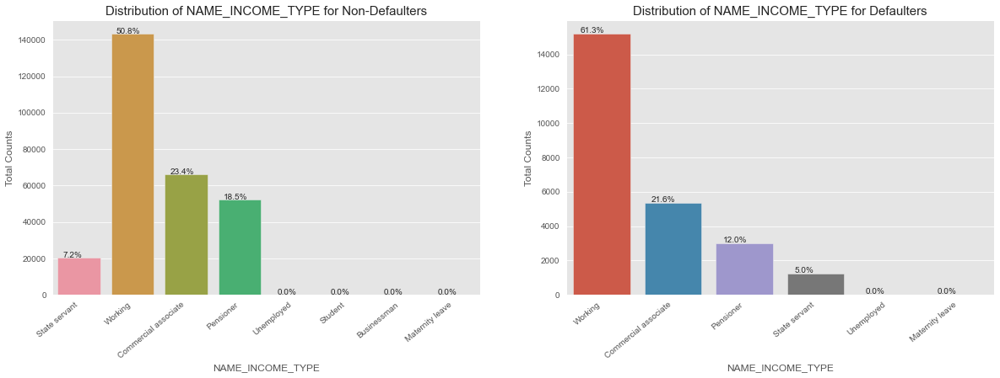

In [63]:
univanal("NAME_INCOME_TYPE",df_0,df_1)

### Insights: 

 1. Working Income Type appear to be the majority in application dataset with 51.6% & State Servant appears to be least with 7.1%.
 2. Working Income type appears to be majority with50.8% & State servant is least with 7.2% among Non-Defaulters.
 3. Working Income Type appears to be majority with 61.3% & State Servants appear to be 5.0% among Defaulters.


### NAME Education Type:

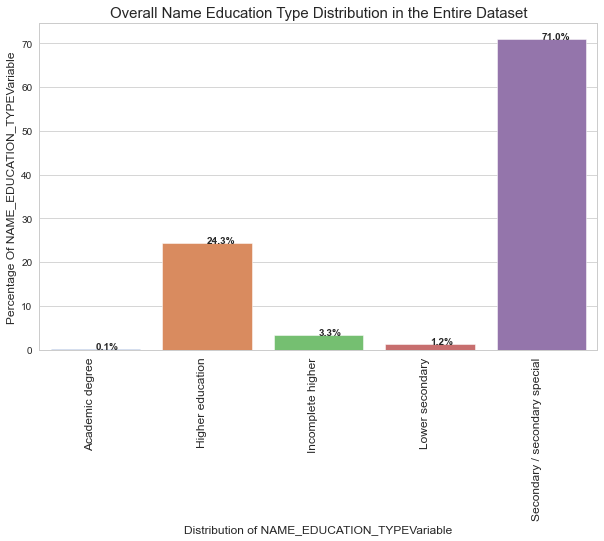

In [64]:
univariate_barchart(Final_Application_dataset,"NAME_EDUCATION_TYPE","Overall Name Education Type Distribution in the Entire Dataset",0.0)

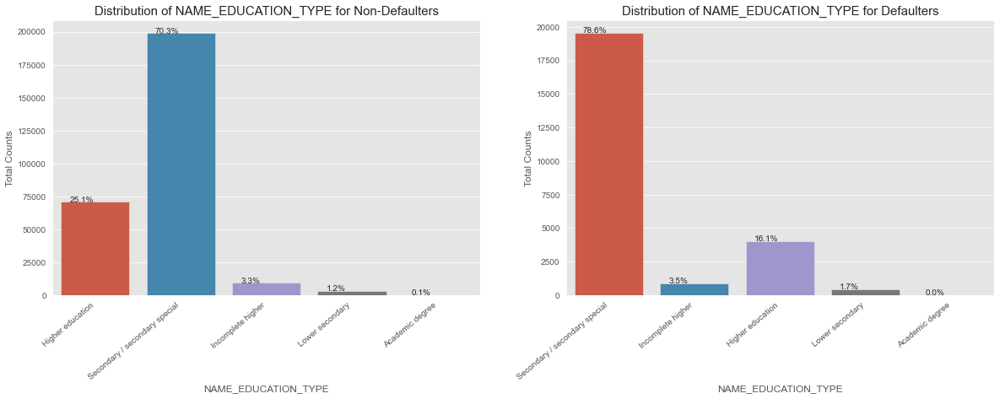

In [65]:
univanal("NAME_EDUCATION_TYPE",df_0,df_1)

#### Insights:

 1. Secondary/Secondary Special appears to be majority of the education of the clients with 71.0%   & Academic degree appears to
 be the least with 0.1% of the entire clients in the application dataset.

 2. In Non- Defaulters, Secondary/Secondary Special appears to be majority among the education types  with 70.3% &  Academic 
degree appears to be the least with 0.1%.

 3. In Defaulters, Secondary/Secondary Special appears to be majority among the education types  with 78.6% &  Lower Secondary appears to be the least with 0.1%.


### NAME_FAMILY_STATUS:

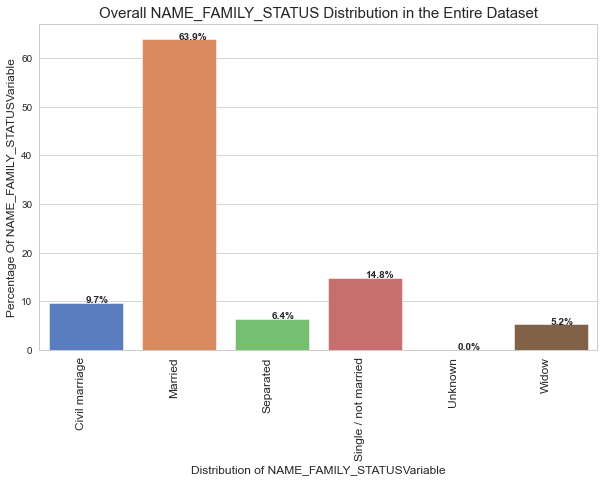

In [66]:
univariate_barchart(Final_Application_dataset,"NAME_FAMILY_STATUS","Overall NAME_FAMILY_STATUS Distribution in the Entire Dataset",0.0)

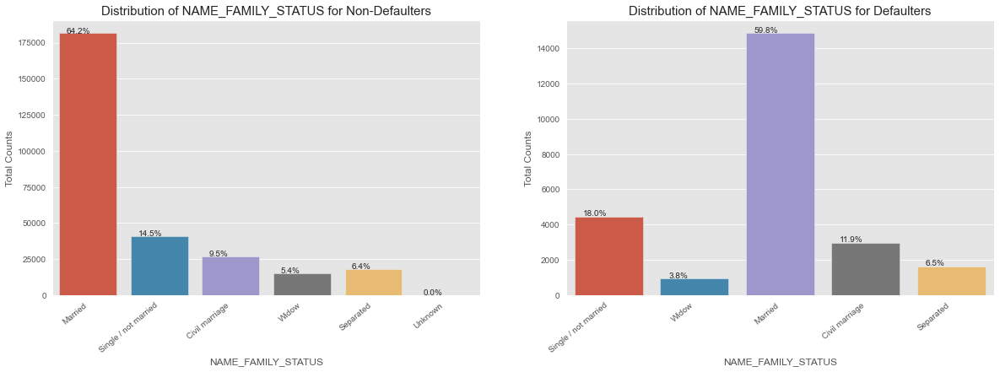

In [67]:
univanal("NAME_FAMILY_STATUS",df_0,df_1)

### Insights: 

 1.	Married clients appear to be the majority with 63.9% & least appears to be Widow with 5.2% among the Family _Status types in the application dataset.
 2.	Among Non-Defaulters, Married Clients are the majority with 64.2% and the least type is Widow with 5.4%.
 3.	Majority of the Defaulters are Married with 59.8% & minority of the defaulters is Widow with 3.8%.


### NAME_HOUSING_TYPE:

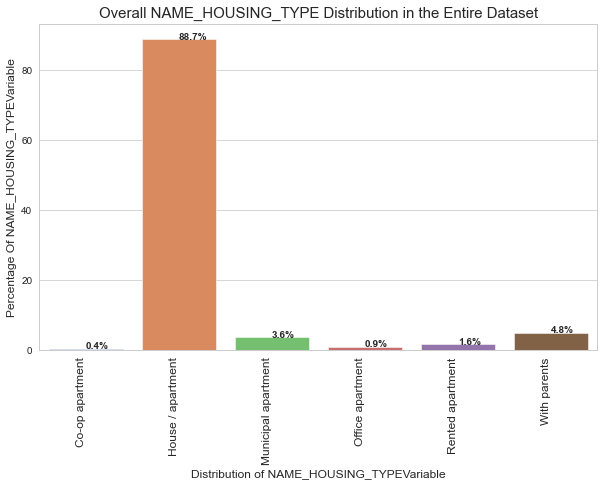

In [68]:
univariate_barchart(Final_Application_dataset,"NAME_HOUSING_TYPE","Overall NAME_HOUSING_TYPE Distribution in the Entire Dataset",0.0)

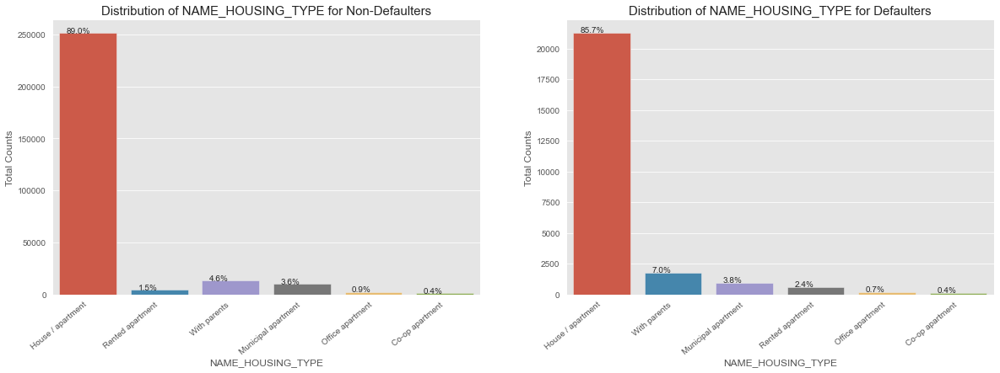

In [69]:
univanal("NAME_HOUSING_TYPE",df_0,df_1)

#### Insights:

1. House/Apartment appears to be majorly owned by 88.7% and least clients own Co-op Apartments with 0.4% by the clients in the application dataset.
2. Majority of the Non-Defaulters own House/Apartment with 89.0% and least own Co-op Apartments with 0.4%.
3. Majority of the Defaulters own House/Apartment with 85.7% and least own Co-op Apartments with 0.4%.


#### Occupation Type: 

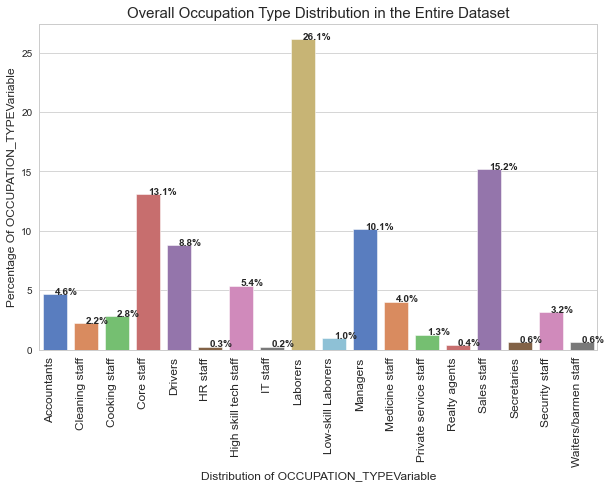

In [70]:
univariate_barchart(Final_Application_dataset,"OCCUPATION_TYPE","Overall Occupation Type Distribution in the Entire Dataset",0.0)

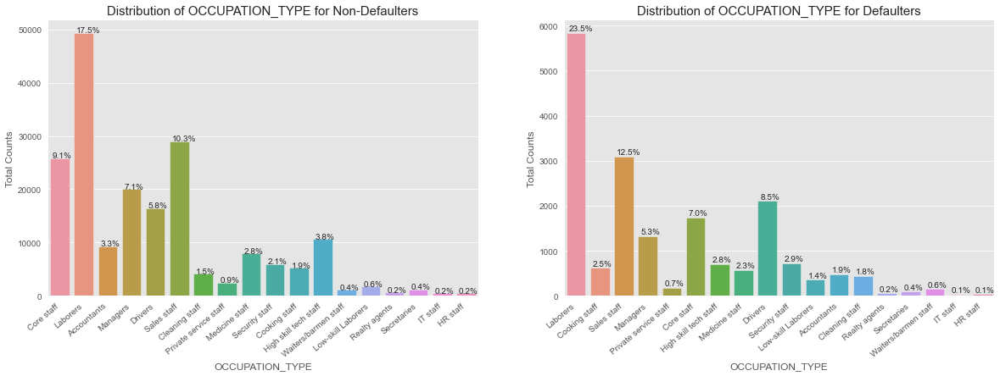

In [71]:
univanal("OCCUPATION_TYPE",df_0,df_1)

### Insights:

1. Majority of the clients are Laborers which constitute to 26.1% and the least is IT Staff with 0.2% among all the clients in application dataset.
2. Majority of the Non- Defaulters is Laborers with 17.5% and minority is Reality agents, IT Staff & HR Staff who share 0.2% each.
3. Majority of the Defaulters is 23.5% & least is IT Staff & HR Staff is 0.1%.


### WEEKDAY_APPR_PROCESS_START:

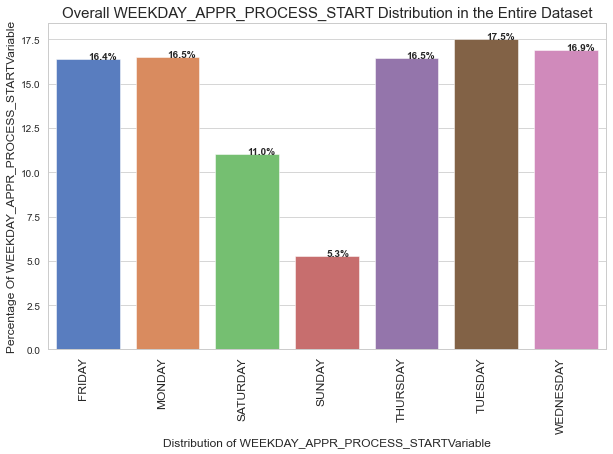

In [72]:
univariate_barchart(Final_Application_dataset,"WEEKDAY_APPR_PROCESS_START","Overall WEEKDAY_APPR_PROCESS_START Distribution in the Entire Dataset",0.0)

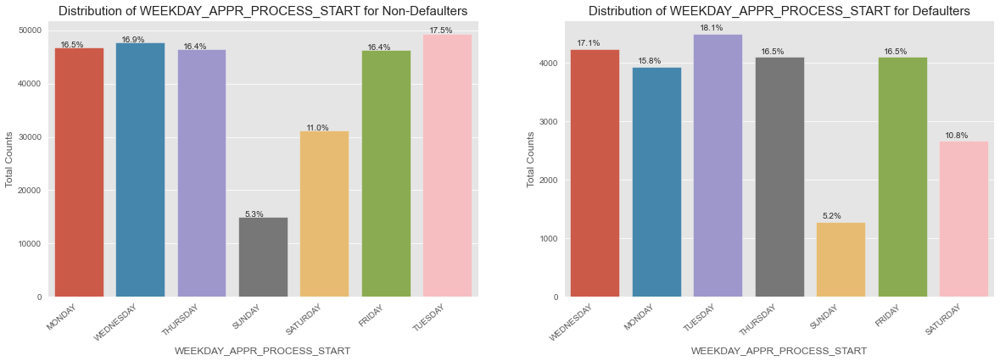

In [73]:
univanal("WEEKDAY_APPR_PROCESS_START",df_0,df_1)

### Insights: 

1. Majority of the Credit approval start day is Tuesday with 17.5% & least was observed on  Sunday with 5.3%.
2. Most of the Non- Defaulters Credit approval start day observed to be Tuesday with 17.5% & least was observed on Sunday with 5.3%.
3. Most of the Defaulters Credit approval start day is observed to be Tuesday with 18.1% & least on Sunday with 5.2%.


### ORGANIZATION_TYPE:

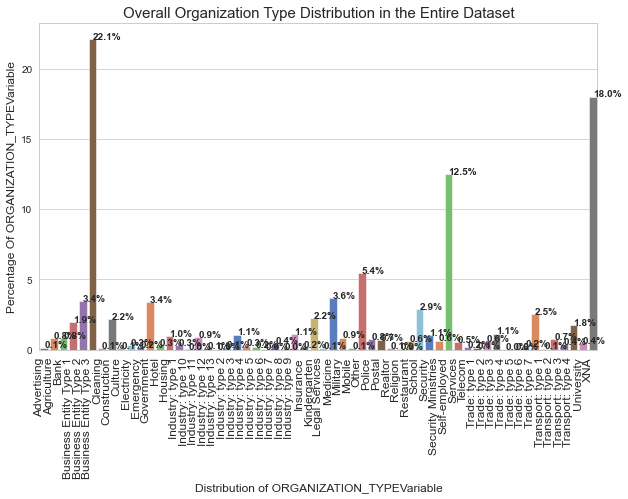

In [74]:
univariate_barchart(Final_Application_dataset,"ORGANIZATION_TYPE","Overall Organization Type Distribution in the Entire Dataset",0.0)

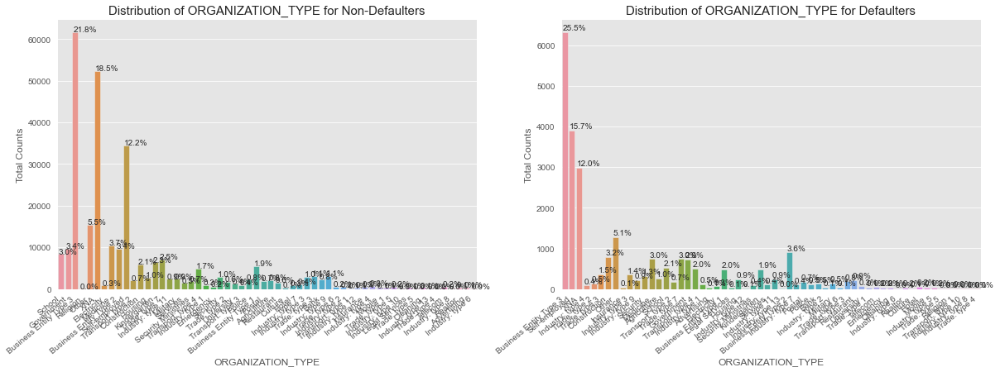

In [75]:
univanal("ORGANIZATION_TYPE",df_0,df_1)

### Insights:

1. Overall majority of the applicants is Business Enity Type 3 & constitute 22.1%.
2. Majority of the Non-Defaulters is also Business Enity Type 3 & constitute 21.8%
3. Mojority of the Defaulters is also Business ENtity Type 3 & constitures 25.55%.

#### Univariate Analysis for Numerical columns:
## Numerical columns Analysis:
#### 1. Boxplot
#### 2. Histogram
#### 1.1 Boxplot with respective to Target variable.
#### 1.2 Histogram with respective to Target variable.¶


In [76]:
numerical_columns = numerical_categorical_columns(Final_Application_dataset,["number"])

In [77]:
print("Total {} columns are categorical out of {}".format(len(numerical_columns),len(Final_Application_dataset.columns)))

Total 24 columns are categorical out of 42


In [78]:
numerical_columns

Index(['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [79]:
def continuousvanal(var,no_of_bins,alpha_level,log_scale_status,kde_status):
    """
    This function will be useful for plotting the univariate distribution plot and boxplot distribution for column.
    Parameter(s):
        ------------
            var : variable_to_plot the distribution plot and boxplot.
            no_of_bins : No.of.bins in the distribution plot
            alpha_level : level of alpha for the graph
            log_scale_status :  enable log_normalization or not..!!(True/False)
            kde_status : kernel density estimation(True/False)
            Return(s):
            ---------
                print the distribution plot and boxplot with respective to Target variable.   
    """
    
    Final_Application_dataset[var] = Final_Application_dataset[var].astype(int,errors="ignore")
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))
    
    ax[0][0] = sns.distplot(x=Final_Application_dataset[var],ax=ax[0][0])
    ax[0][0].set_title("Overall Dataset Distribution: "+var)

    ax[0][1] = sns.distplot(x=df_0[var],ax=ax[0][1])
    ax[0][1].set_title(f'Distribution of {var} for Defaulters')
    
    
    ax[0][2] = sns.distplot(x=df_1[var],ax=ax[0][2])
    ax[0][2].set_title(f'Distribution of {var} for Non-Defaulters')
    
    
    ## outliers in datasets
    ax[1][0] = sns.boxplot(y=Final_Application_dataset[var],ax=ax[1][0],palette="Blues")
    ax[1][0].set_title("Overall Dataset Distribution"+var)

    ax[1][1] = sns.boxplot(y=df_0[var],ax=ax[1][1],palette="Blues")
    ax[1][1].set_title(f'Distribution of {var} for Defaulters')

    
    ax[1][2] = sns.boxplot(y=df_1[var],ax=ax[1][2],palette="Blues")
    ax[1][2].set_title(f'Distribution of {var} for Non-Defaulters')
    

    fig.tight_layout(pad=3.0)



#### Amount Income Total - Univariate Analysis:

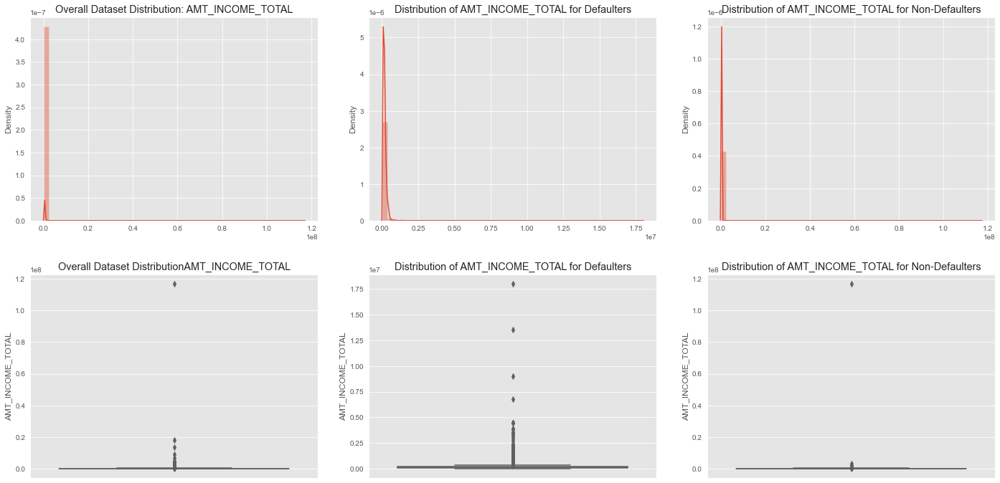

In [80]:
## bins =10, alpha =0.7,log_normalization=True,kde=false
continuousvanal("AMT_INCOME_TOTAL",10,0.7,True,False)

### Outliers Detection in Amount Income Total:

In [81]:
sns.set(style="darkgrid")

def boxplot(df,column_name,title):
    """
    This function will be useful for plotting the boxplot to check the outliers.
    Parameter(s):
        ------------
            df : dataframe it contains the application dataset info.
            column_name :  name of the column to plot the boxplot
            title : Title fot graph
            Return(s):
            ---------
                print the boxplot and statistical summary.  
    """
    
    print(" Statistical Summary :\n",df[column_name].describe())
    plt.figure(figsize = (25,5))
    sns.boxplot(x=df[column_name])
    plt.title(title, fontsize = 20 )
    plt.show()

    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_whisker = (Q1 - 1.5 * IQR)
    upper_whisker = (Q3 + 1.5 * IQR)
    employed_max = df[column_name].max()

    print("Data points appear above the UPPER_WHISKER {} can be statistically considered as the Outliers.".format(upper_whisker))

 Statistical Summary :
 count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64


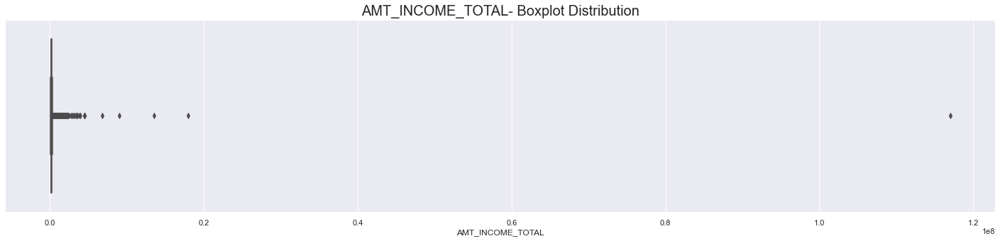

Data points appear above the UPPER_WHISKER 337500.0 can be statistically considered as the Outliers.


In [82]:
boxplot(Final_Application_dataset,"AMT_INCOME_TOTAL","AMT_INCOME_TOTAL- Boxplot Distribution")

#### Insights:

1. Datapoints areClustered at the Upper Whisker and cannot be considered as Outliers as there might be high Income for many Business / Organsations.


#### Suggestion:

These values have to be analysed in depth before capping or imputing with the 99 percentile as they might deviate from giving the correct analysis..

## Binning Amount-Income Total:

In [83]:
bins = [0, 500000, 1000000, 1500000, 2000000, 2500000, 5000000]
cut_off_range = ['0-5L', '5-10L', '10L-15L', '15L-20L', '20L-25L','25L & above']


Final_Application_dataset["AMT_INCOME_BINS"] = pd.cut(Final_Application_dataset["AMT_INCOME_TOTAL"], bins , labels = cut_off_range)
        
## create binning in df0 and df1 as well
df_0["AMT_INCOME_BINS"] = pd.cut(df_0["AMT_INCOME_TOTAL"], bins , labels = cut_off_range)
df_1["AMT_INCOME_BINS"] = pd.cut(df_1["AMT_INCOME_TOTAL"], bins , labels = cut_off_range)




## Binning Barplot:

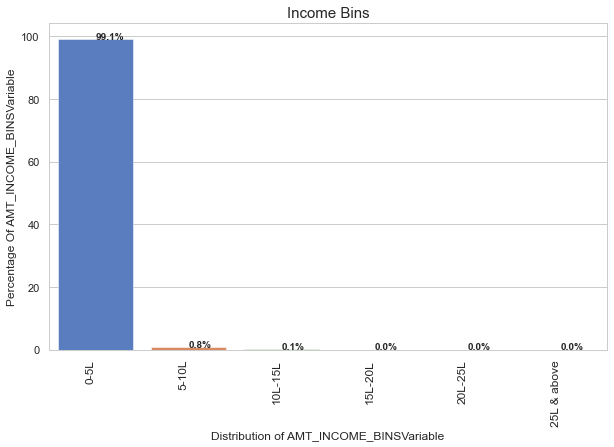

In [84]:
univariate_barchart(Final_Application_dataset,"AMT_INCOME_BINS","Income Bins",0.0)

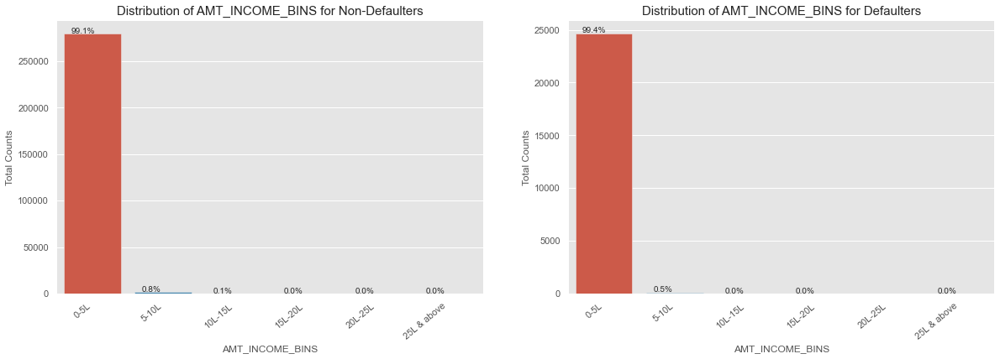

In [85]:
univanal("AMT_INCOME_BINS",df_0,df_1)

### Insights:

1. Majority of the Credit applicants appear to be in 0-5Lakhs Income Group with 99.1% & 10-15 Lakhs appear to be least with 0.1% of the overall applicants in application dataset.
2. Majority of the Non-Default Clients appear to be in 0-5Lakhs Income Group with 99.1% & 10-15 Lakhs appear to be least with  0.1%.
3. Majority of the Default Clients appear to be in 0-5Lakhs Income Group with 99.4% & 5-10 Lakhs appear to be least with 0.5%.


### Amount credit:

##### Histogram and boxplot with respective to target variable:

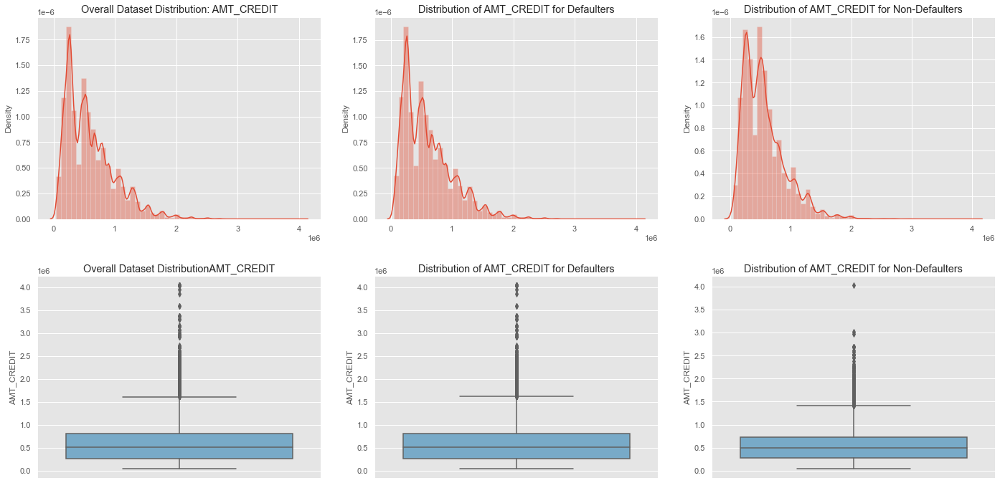

In [86]:
## bins =10, alpha =0.7,log_normalization=False,kde=false

continuousvanal("AMT_CREDIT",10,0.7,False,False)

#### Amount Credit boxplot Distribution:

 Statistical Summary :
 count    3.075110e+05
mean     5.990260e+05
std      4.024908e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64


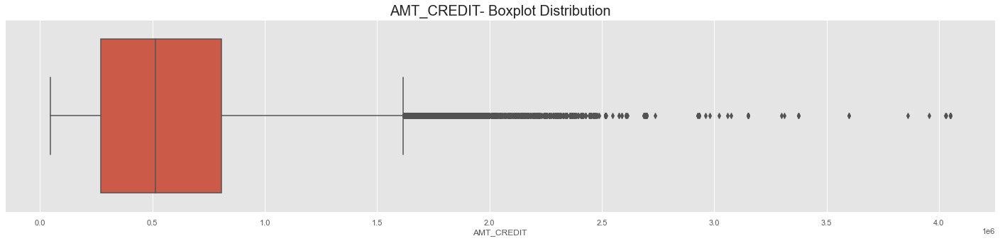

Data points appear above the UPPER_WHISKER 1616625.0 can be statistically considered as the Outliers.


In [87]:
boxplot(Final_Application_dataset,"AMT_CREDIT","AMT_CREDIT- Boxplot Distribution")

#### Insights:

1. Many Datapoints are clustered above the Upper Whisker & cannot be considered as Outliers as they might be correct in real times.

### Amount Credit-Binning: 

In [88]:
bins = [0, 500000, 1000000, 1500000, 2000000, 2500000, 5000000]
cut_off_range = ['0-5L', '5-10L', '10L-15L', '15L-20L', '20L-25L','25L & above']

Final_Application_dataset["AMT_CREDIT_BINS"] = pd.cut(Final_Application_dataset["AMT_CREDIT"], bins , labels = cut_off_range)
        
## create binning in df0 and df1 as well
df_0["AMT_CREDIT_BINS"] = pd.cut(df_0["AMT_CREDIT"], bins , labels = cut_off_range)
df_1["AMT_CREDIT_BINS"] = pd.cut(df_1["AMT_CREDIT"], bins , labels = cut_off_range)

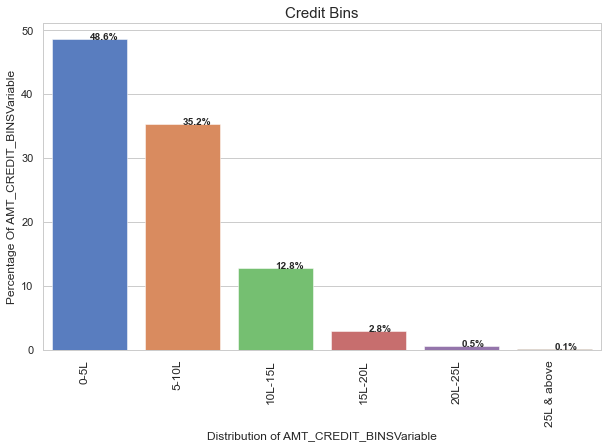

In [89]:
univariate_barchart(Final_Application_dataset,"AMT_CREDIT_BINS","Credit Bins",0.0)

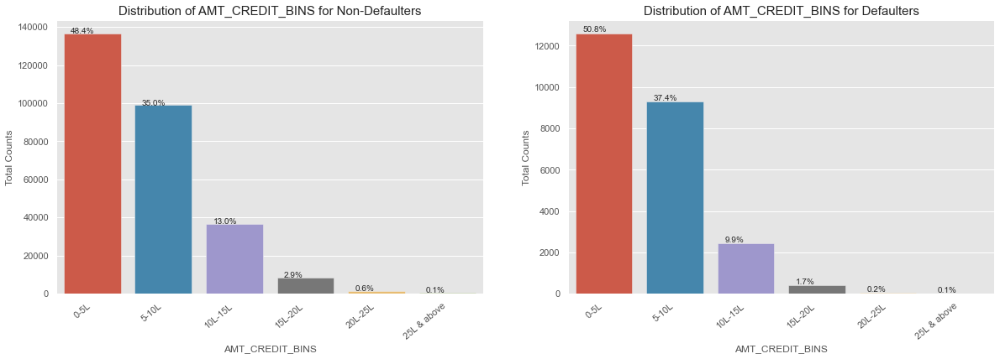

In [90]:
univanal("AMT_CREDIT_BINS",df_0,df_1)

### Insights:

1. Majority of the Credit applicants Amount appears to be in 0-5 Lakhs which constitutes to 48.6% and least Credit amount appears to be in 25Lakhs & above with 0.1% of the total applicants.
2. Majority of the Non-Defaulters Credit amount is in 0-5 Lakhs range with 48.4% & least Credit Amount is 25Lakhs & above with 0.1%.
3. Majority of the Defaulters Credit amount is in 0-5 Lakhs range with 50.8% & least Credit Amount is 25Lakhs & above with 0.1%.


### Amount Annuity: 

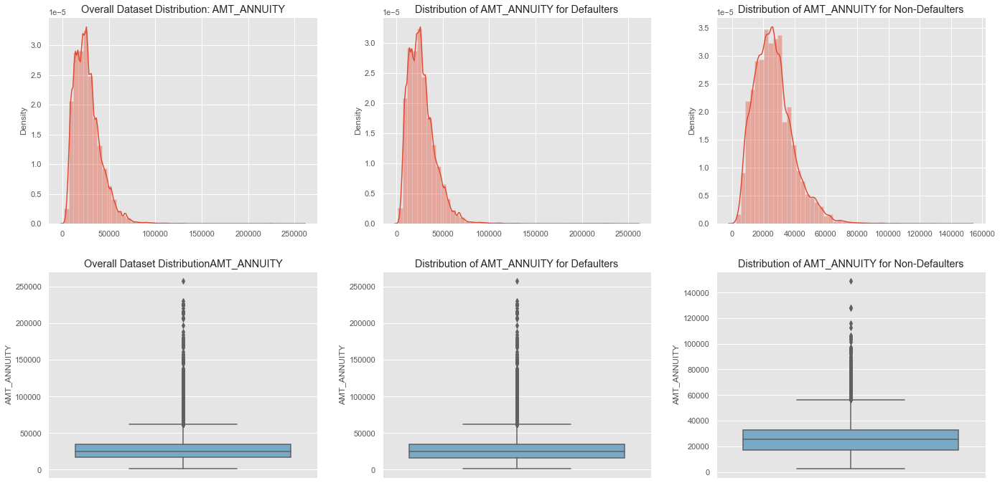

In [91]:
## bins =10, alpha =0.7,log_normalization=False,kde=false

continuousvanal("AMT_ANNUITY",10,0.7,False,False)

 Statistical Summary :
 count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64


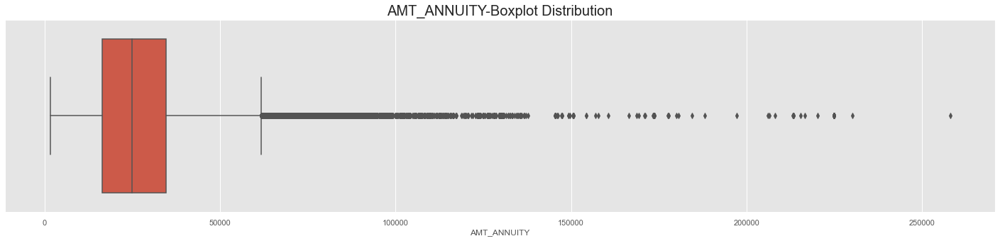

Data points appear above the UPPER_WHISKER 61704.0 can be statistically considered as the Outliers.


In [92]:
boxplot(Final_Application_dataset,"AMT_ANNUITY","AMT_ANNUITY-Boxplot Distribution")

### Insights: 

 1. Many Data points are clustered above the Upper Whisker and many appear to be far away.
 2. These Annuity data points  are based on the Credit Amount, tenure & Interest Rate and cannot be considered as Outliers


### AMT_GOODS_PRICE:

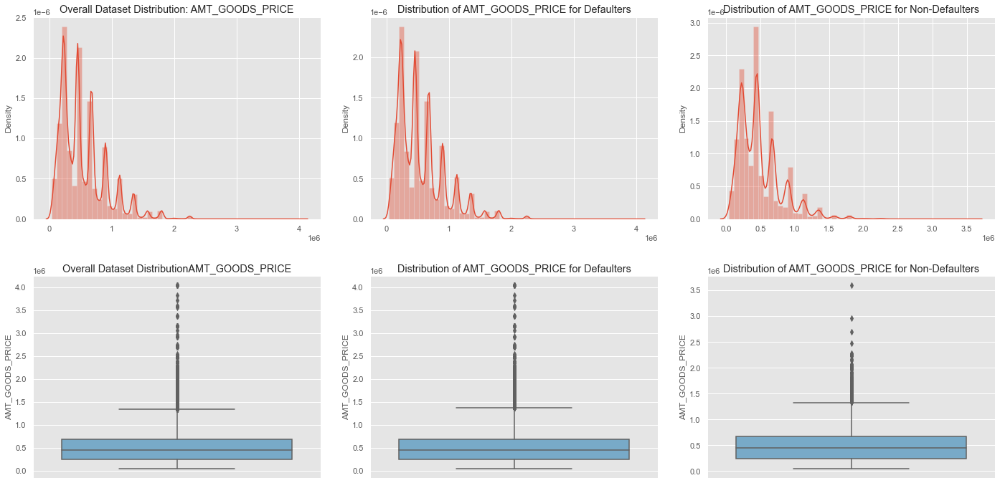

In [93]:
## bins =10, alpha =0.7,log_normalization=True,kde=false

continuousvanal("AMT_GOODS_PRICE",10,0.9,True,False)

#### Outliers Detection:

 Statistical Summary :
 count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64


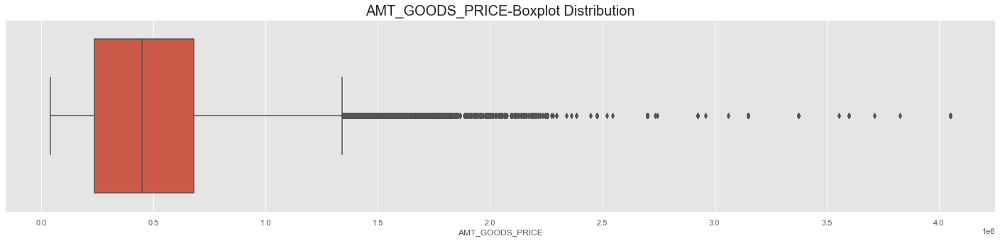

Data points appear above the UPPER_WHISKER 1341000.0 can be statistically considered as the Outliers.


In [94]:
boxplot(Final_Application_dataset,"AMT_GOODS_PRICE","AMT_GOODS_PRICE-Boxplot Distribution")

#### Insights:

#### 1.Many Data Points are clustered above UpperWhisker and far away from the upper Whisker
#### 2.These points cannot be considered as Outliers as we do not enough source related to the Goods Categories & its Price to prove that these data points are outliers.


### AMT_Goods_Price-Binning:

In [95]:
bins = [0, 50000, 100000, 150000, 200000, 250000, 500000]
cut_off_range = ['0-50Thousand', '50-1L', '1L-1.5L', '1.5L-2.0L', '2.0L-2.5L','2.5L & above']

Final_Application_dataset["AMT_GOODS_BINS"] = pd.cut(Final_Application_dataset["AMT_GOODS_PRICE"], bins , labels = cut_off_range)
        
## create binning in df0 and df1 as well
df_0["AMT_GOODS_BINS"] = pd.cut(df_0["AMT_GOODS_PRICE"], bins , labels = cut_off_range)
df_1["AMT_GOODS_BINS"] = pd.cut(df_1["AMT_GOODS_PRICE"], bins , labels = cut_off_range)

In [96]:
Final_Application_dataset["AMT_GOODS_PRICE"].min()

40500.0

In [97]:
Final_Application_dataset["AMT_GOODS_PRICE"].max()

4050000.0

#### Barplot for Binning Goods price:

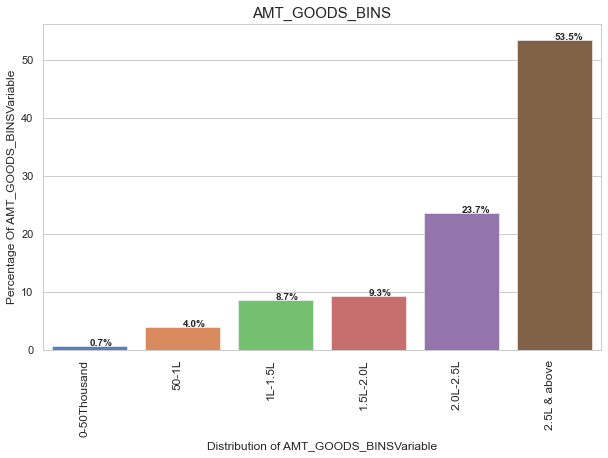

In [98]:
univariate_barchart(Final_Application_dataset,"AMT_GOODS_BINS","AMT_GOODS_BINS",0.0)

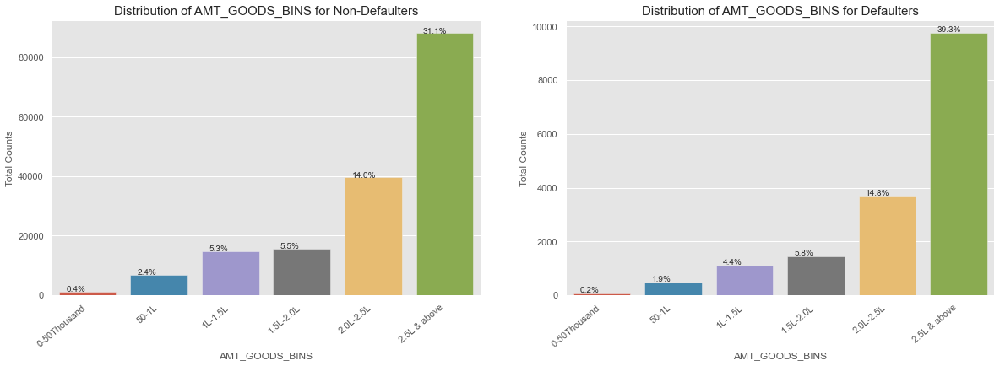

In [99]:
univanal("AMT_GOODS_BINS",df_0,df_1)

#### Insights: 

1. Majority of the Goods Amount is 25Lakhs & above which is 53.5% & least is 0-50 Thousand which is 0.7% of the total applicants.
2. Majority of the Non-Defaulters Goods Amount is 25Lakhs & above which is 31.1% & least is 0-50 Thousand  which is 0.4%.
3. Majority of the Defaulters Goods Amount is 25Lakhs & above which is 39.3% & least is 0-50 Thousand  which is 0.2%.



#### CNT_FAM_Members:

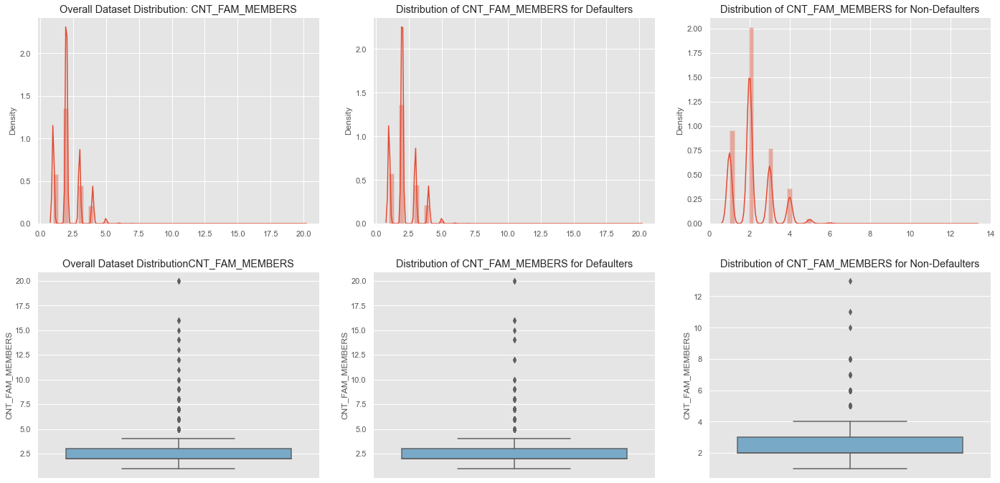

In [100]:
## bins =14, alpha =0.7,log_normalization=True,kde=false

continuousvanal("CNT_FAM_MEMBERS",14,0.7,True,False)

#### Insights:

1.	Many datapoints appear to be above Upper Whisker 4 and can be statistically considered as Outlier but canont be treated as Outlier as there is no boundary for the family limit.
2.	Max Family members is observed to be 20 & minimum is 1 among all the applicants.
3.	Majority of the Non-Defaulters have a maximum of Family Members as 20 & least is observed to be 1.
4.	Majority of the Defaulters have a maximum of 13 family members and least is 1.


#### Days of Birth:

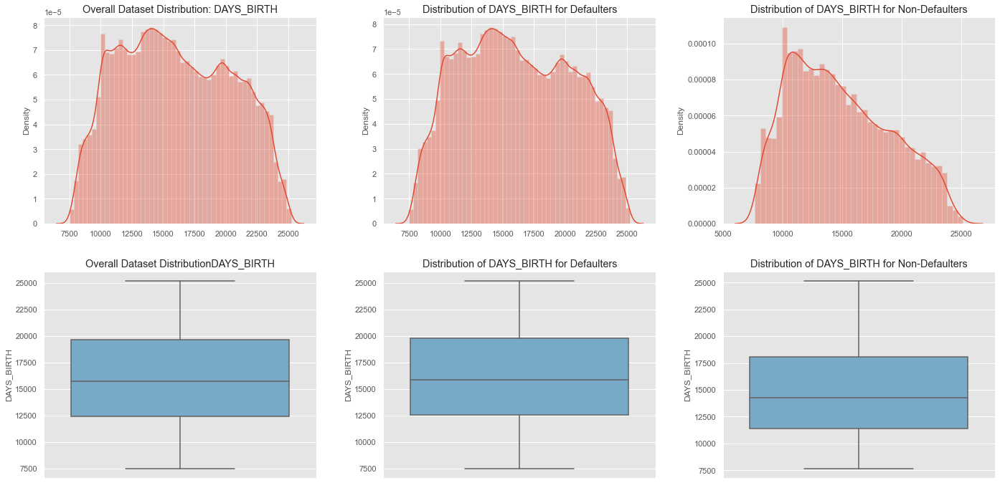

In [101]:
## bins =14, alpha =0.7,log_normalization=True,kde=false

continuousvanal("DAYS_BIRTH",14,0.7,True,False)

 Statistical Summary :
 count    307511.000000
mean      16036.995067
std        4363.988632
min        7489.000000
25%       12413.000000
50%       15750.000000
75%       19682.000000
max       25229.000000
Name: DAYS_BIRTH, dtype: float64


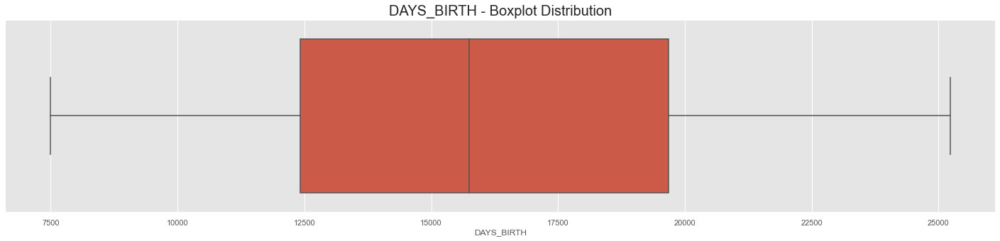

Data points appear above the UPPER_WHISKER 30585.5 can be statistically considered as the Outliers.


In [102]:
boxplot(Final_Application_dataset,"DAYS_BIRTH","DAYS_BIRTH - Boxplot Distribution")

#### Insights:


1. No Outliers appear for Days_Birth.

2. Since most of the data present in 7500-17500 days of birth , it means 20-50 years age group most of the data is represented.

### Age group Binning:

In [103]:
Final_Application_dataset["AGE_Group"] = Final_Application_dataset["DAYS_BIRTH"].apply(lambda x: round(x/365,0))
df_0["AGE_Group"] = df_0["DAYS_BIRTH"].apply(lambda x: round(x/365,0))
df_1["AGE_Group"] = df_1["DAYS_BIRTH"].apply(lambda x: round(x/365,0))



bins = [0, 25, 30, 40, 50, 60, 80,100]
cut_off_range = ['0-25', '25-30', '30-40', '40-50', '50-60','60-80','80-100']

Final_Application_dataset["AGE_Group_Bins"] = pd.cut(Final_Application_dataset["AGE_Group"], bins , labels = cut_off_range)
df_0["AGE_Group_Bins"] = pd.cut(df_0["AGE_Group"], bins , labels = cut_off_range)
df_1["AGE_Group_Bins"] = pd.cut(df_1["AGE_Group"], bins , labels = cut_off_range)



posx and posy should be finite values
posx and posy should be finite values


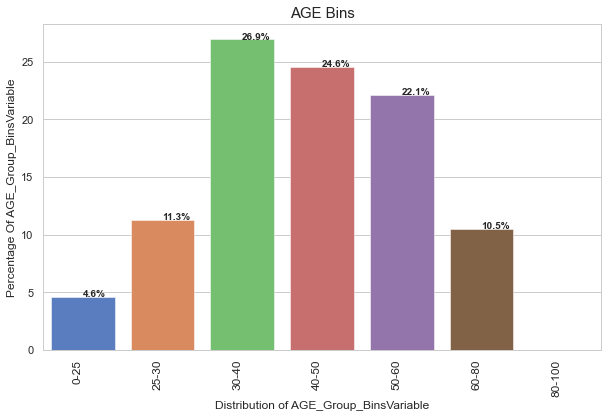

In [104]:
univariate_barchart(Final_Application_dataset,"AGE_Group_Bins","AGE Bins",0.0)

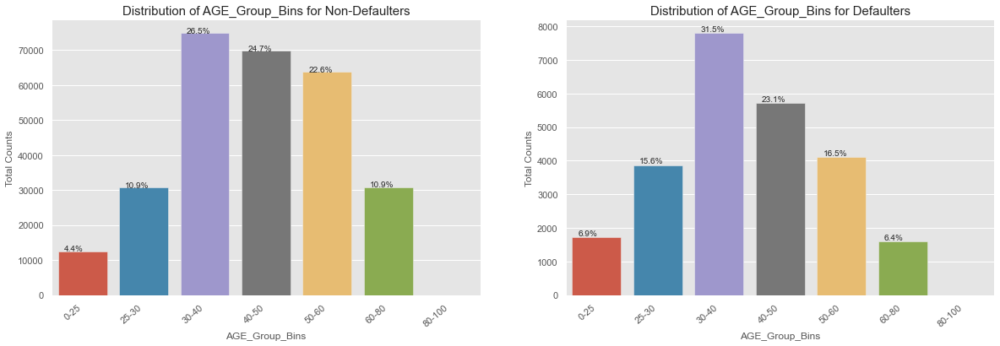

In [105]:
univanal("AGE_Group_Bins",df_0,df_1)

#### Insights:

#### Days_Employed:

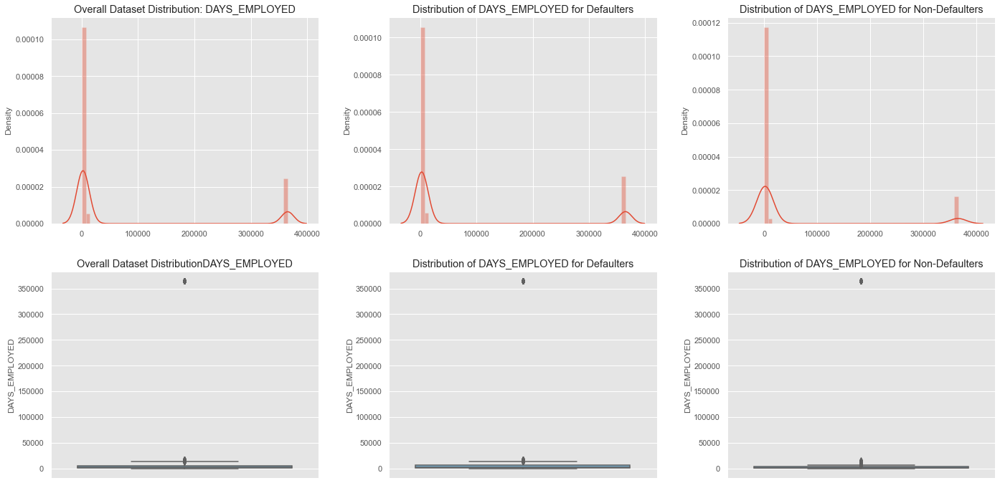

In [106]:
## bins =4, alpha =0.7,log_normalization=True,kde=false

continuousvanal("DAYS_EMPLOYED",4,0.7,True,False)

 Statistical Summary :
 count    307511.000000
mean      67724.742149
std      139443.751806
min           0.000000
25%         933.000000
50%        2219.000000
75%        5707.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64


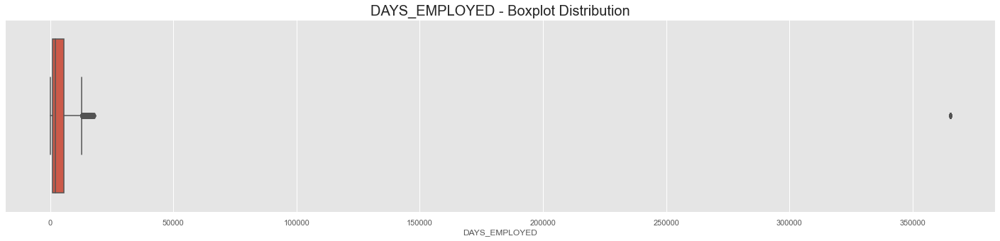

Data points appear above the UPPER_WHISKER 12868.0 can be statistically considered as the Outliers.


In [107]:
boxplot(Final_Application_dataset,"DAYS_EMPLOYED","DAYS_EMPLOYED - Boxplot Distribution")

#### Insights:

1. Some data points are clusteres above the Upper Whisker & one data point is very far from the Upper Whisker.
2. Max Value of Days_Employed is 365243.0 insignificant as Days_Employed cannot exceed the Max DAYS_BIRTH 25229.0
3. This value should be considered as Outlier and replaced with 99 percentile value

#### Suggestions:

1. Capping is hte best techique to impute the Outliers at 365243 with 99 percentile value.
2. Use this piece of Code:

#print("No.of Records with Max Value is : ",len(application_dataset[application_dataset['DAYS_EMPLOYED'] == application_dataset['DAYS_EMPLOYED'].max()]))
#application_dataset[application_dataset['DAYS_EMPLOYED'] == application_dataset['DAYS_EMPLOYED'].max()]

#application_dataset[application_dataset['DAYS_EMPLOYED'] > np.percentile(application_dataset['DAYS_EMPLOYED'],0.99)].reset_index(drop= True)

#### DAYS_ID_PUBLISH:

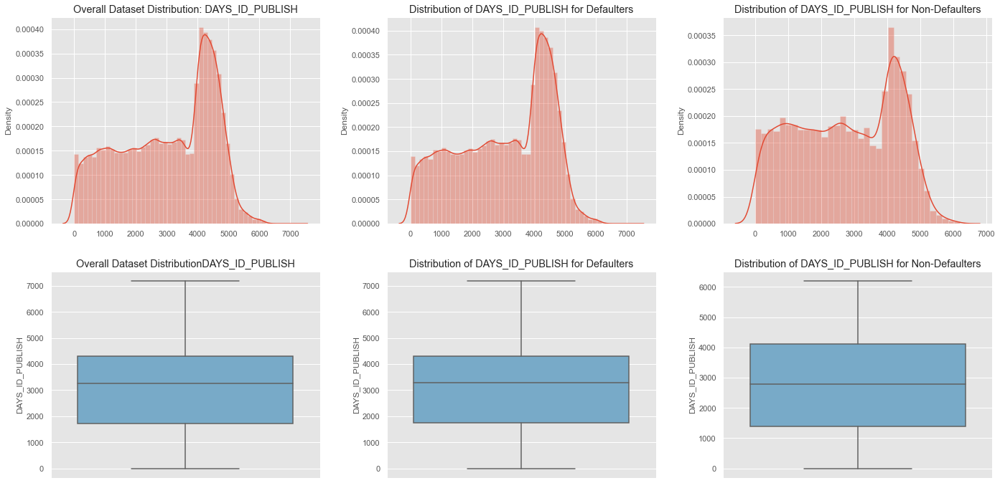

In [108]:
## bins =4, alpha =0.6,log_normalization=False,kde=false

continuousvanal("DAYS_ID_PUBLISH",4,0.6,False,False)

 Statistical Summary :
 count    307511.000000
mean       2994.202373
std        1509.450419
min           0.000000
25%        1720.000000
50%        3254.000000
75%        4299.000000
max        7197.000000
Name: DAYS_ID_PUBLISH, dtype: float64


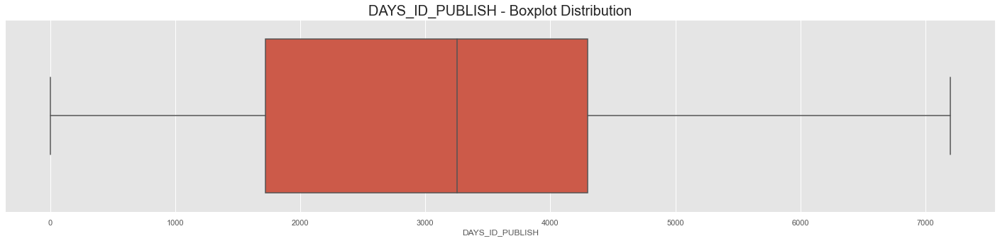

Data points appear above the UPPER_WHISKER 8167.5 can be statistically considered as the Outliers.


In [109]:
boxplot(Final_Application_dataset,"DAYS_ID_PUBLISH","DAYS_ID_PUBLISH - Boxplot Distribution")

### Insights: No Outliers detected.
1. Clients who have changed the identity document with which he/she applied for the loan seems to be maximum in 4000-4500days and minimum appears to be 3700-4000 days.
2. Non-Defaulters who have changed their Identity Documents appear to be maximum in the 4000-4500 days & minimum appears to be 3700-4000 days. 
3. Defaulters who have changed their Identity Documents appear to be maximum in the 4000-4500 days & minimum appears to be 3700-4000 days.


### AMT_REQ_CREDIT_BUREAU_HOUR:

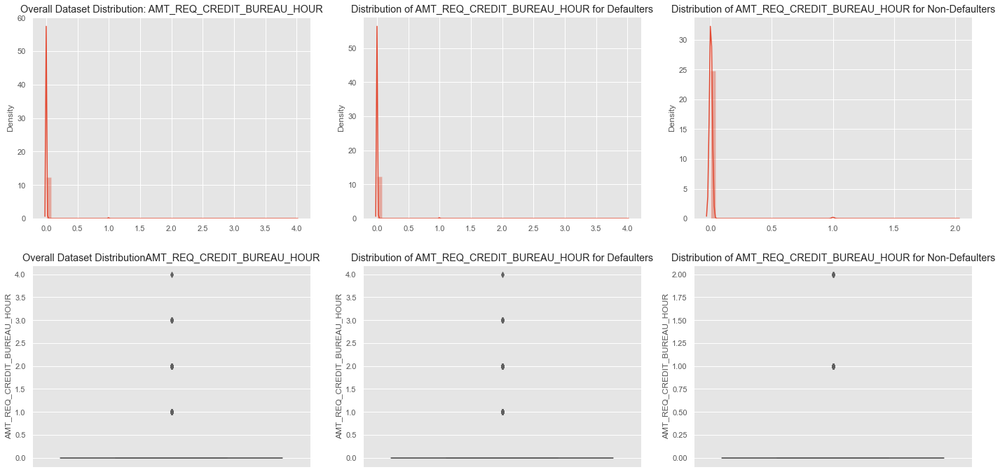

In [110]:
## bins =4, alpha =0.6,log_normalization=False,kde=false

continuousvanal("AMT_REQ_CREDIT_BUREAU_HOUR",4,0.6,False,False)

### Insights:
1. Missing Values appear to 13.5% & can be Imputed the mean value.
2. application_dataset['AMT_REQ_CREDIT_BUREAU_HOUR']=application_dataset['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(application_dataset['AMT_REQ_CREDIT_BUREAU_HOUR'].mean())

print(f"Missing values can be imputed with Mean value : {application_dataset['AMT_REQ_CREDIT_BUREAU_HOUR'].mean()}")

#### AMT_REQ_CREDIT_BUREAU_WEEK:

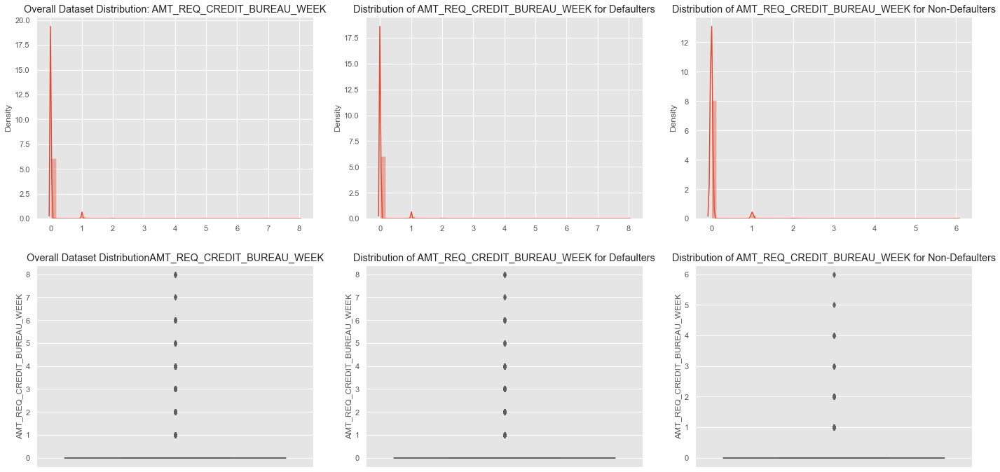

In [111]:
## bins =4, alpha =0.6,log_normalization=False,kde=false

continuousvanal("AMT_REQ_CREDIT_BUREAU_WEEK",4,0.6,False,False)

#### Insights:

#### Suggestions:
1. Impute the missing value with Mean of the AMT_REQ_CREDIT_BUREAU_WEEK variable.

#print(f"Missing values can be imputed with Mean value : {application_dataset['AMT_REQ_CREDIT_BUREAU_WEEK'].mean()}")
#application_dataset['AMT_REQ_CREDIT_BUREAU_WEEK'] = #application_dataset['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(application_dataset['AMT_REQ_CREDIT_BUREAU_WEEK'].mean())

#### AMT_REQ_CREDIT_BUREAU_DAY:

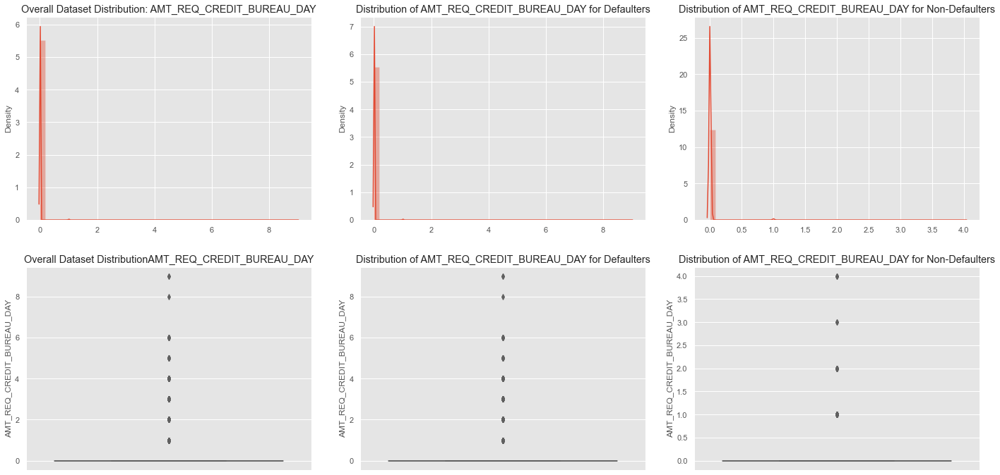

In [112]:
## bins =4, alpha =0.6,log_normalization=False,kde=false

continuousvanal("AMT_REQ_CREDIT_BUREAU_DAY",4,0.6,False,False)

#### Insights:

### Suggestions: 
1. Impute the missing values with Mean Value.

#print(f"Missing values can be imputed with Mean value : {application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'].mean()}")
#application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'] = #application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'].mean())


#### AMT_REQ_CREDIT_BUREAU_MON:

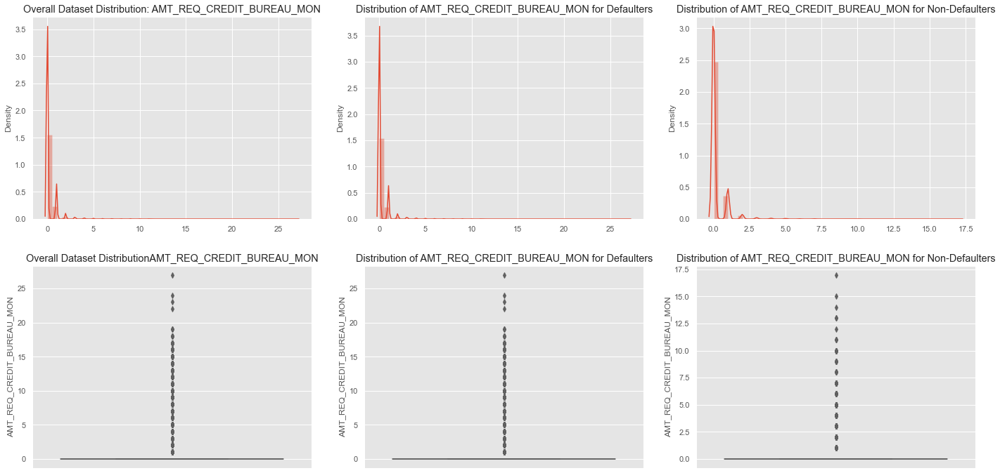

In [113]:
## bins =4, alpha =0.6,log_normalization=False,kde=false

continuousvanal("AMT_REQ_CREDIT_BUREAU_MON",4,0.6,False,False)

#### Insights:

### Suggestions: 
1. Impute the missing values with Mean Value.

#print(f"Missing values can be imputed with Mean value : {application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'].mean()}")
#application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'] = #application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(application_dataset['AMT_REQ_CREDIT_BUREAU_DAY'].mean())


#### AMT_REQ_CREDIT_BUREAU_QRT:

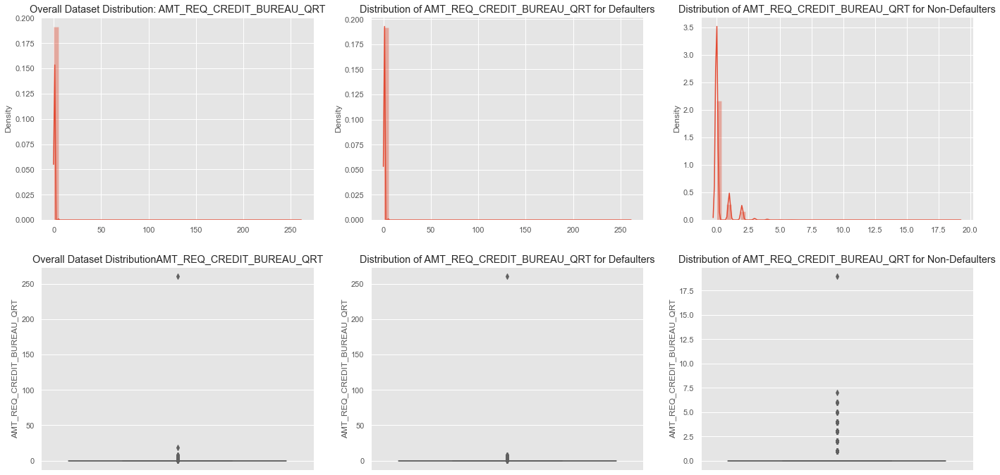

In [114]:
## bins =4, alpha =0.6,log_normalization=False,kde=false

continuousvanal("AMT_REQ_CREDIT_BUREAU_QRT",4,0.6,False,False)

### Suggestion:
1. IMpute the issing values with AMT_REQ_CREDIT_BUREAU_QRT column mean value.
2. print(f"Missing values can be imputed with Mean value : {application_dataset['AMT_REQ_CREDIT_BUREAU_QRT'].mean()}")
3. application_dataset['AMT_REQ_CREDIT_BUREAU_QRT'] = application_dataset['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(application_dataset['AMT_REQ_CREDIT_BUREAU_QRT'].mean())


#### AMT_REQ_CREDIT_BUREAU_YEAR:

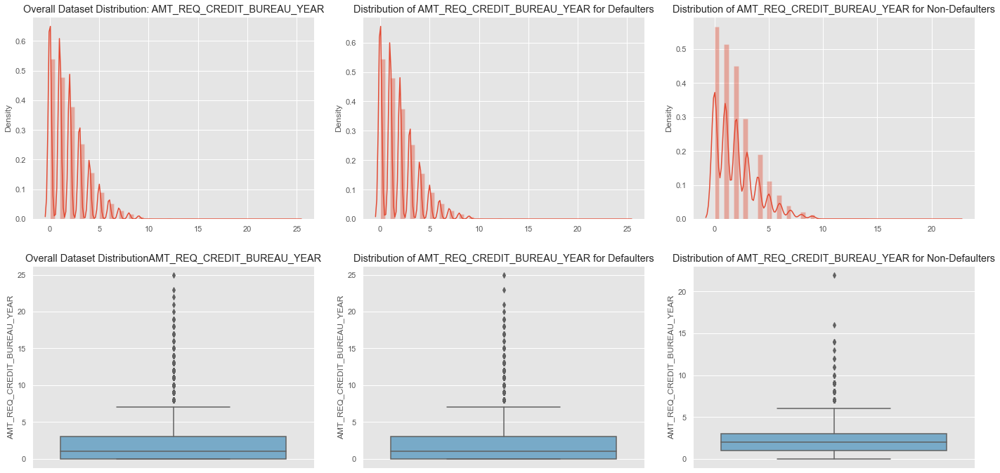

In [115]:
continuousvanal("AMT_REQ_CREDIT_BUREAU_YEAR",20,0.6,False,False)

#### Suggestion:
1. Impute the misisng values with Mean value of the AMT_REQ_CREDIT_BUREAU_YEAR variable.
2. print(f"Missing values can be imputed with Mean value : {application_dataset['AMT_REQ_CREDIT_BUREAU_YEAR'].mean()}")

3. application_dataset['AMT_REQ_CREDIT_BUREAU_YEAR'] = application_dataset['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(application_dataset['AMT_REQ_CREDIT_BUREAU_YEAR'].mean())


### Multivariate Analysis: 

### 2.1. Numerical to Numerical Analysis:

In [116]:
numerical_columns

Index(['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'HOUR_APPR_PROCESS_START',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

### Overall Correlation:

In [117]:
def correlation_function(df,threshold_to_eliminate):
    """
    This function will be useful for calculating the correlation for various variables
    Parameter(s):
        ------------
            df : dataframe it contains the application dataset/previous_application_dataset info.
            threshold_to_eliminate : correlation value should be greater than threshold.
            Return(s):
            ---------
         corr_df : a dataframe which contains the correlation info.
    """
    
    corr_0 = df.corr()
    
    corr_df = corr_0.where(np.triu(np.ones(corr_0.shape) , k = 1 ).astype (np.bool))
    corr_df = corr_df.unstack().reset_index()
    corr_df.columns = ['VAR1' , 'VAR2' , 'Pearson_Correlation']
    corr_df.dropna(subset = ['Pearson_Correlation'] , inplace = True)
    corr_df['Pearson_Correlation'] = round(corr_df['Pearson_Correlation'],2).abs()
    corr_df['Pearson_Correlation'] = corr_df['Pearson_Correlation'].astype(float)
    corr_df = corr_df.sort_values(by = 'Pearson_Correlation' , ascending = False)
    
    ## eliminate no correlation values
    corr_df = corr_df[corr_df['Pearson_Correlation']>threshold_to_eliminate].reset_index(drop=True)
    
    
    return corr_df

#### Top-20 Correlation Features:

In [118]:
### correlation for application_dataset.
correlation_function(Final_Application_dataset,0.0).head(20)

,VAR1,VAR2,Pearson_Correlation
0,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
1,AGE_Group,DAYS_BIRTH,1.00
2,AMT_GOODS_PRICE,AMT_CREDIT,0.99
3,CNT_FAM_MEMBERS,CNT_CHILDREN,0.88
4,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.86
5,AMT_GOODS_PRICE,AMT_ANNUITY,0.78
6,AMT_ANNUITY,AMT_CREDIT,0.77
7,AGE_Group,DAYS_EMPLOYED,0.62
8,DAYS_EMPLOYED,DAYS_BIRTH,0.62
9,REGION_RATING_CLIENT,REGION_POPULATION_RELATIVE,0.53


### Top 20 Correlated Variables : Target_0  - Non Defaulters

In [119]:
### correlation for application_dataset where target =0.
correlation_function(df_0,0.0).head(20)

,VAR1,VAR2,Pearson_Correlation
0,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
1,AGE_Group,DAYS_BIRTH,1.00
2,AMT_GOODS_PRICE,AMT_CREDIT,0.99
3,CNT_FAM_MEMBERS,CNT_CHILDREN,0.88
4,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.86
5,AMT_GOODS_PRICE,AMT_ANNUITY,0.78
6,AMT_ANNUITY,AMT_CREDIT,0.77
7,AGE_Group,DAYS_EMPLOYED,0.63
8,DAYS_EMPLOYED,DAYS_BIRTH,0.63
9,REGION_RATING_CLIENT,REGION_POPULATION_RELATIVE,0.54


### Top 20 Correlated Variables : Target_0  - Non Defaulters Heatmap:

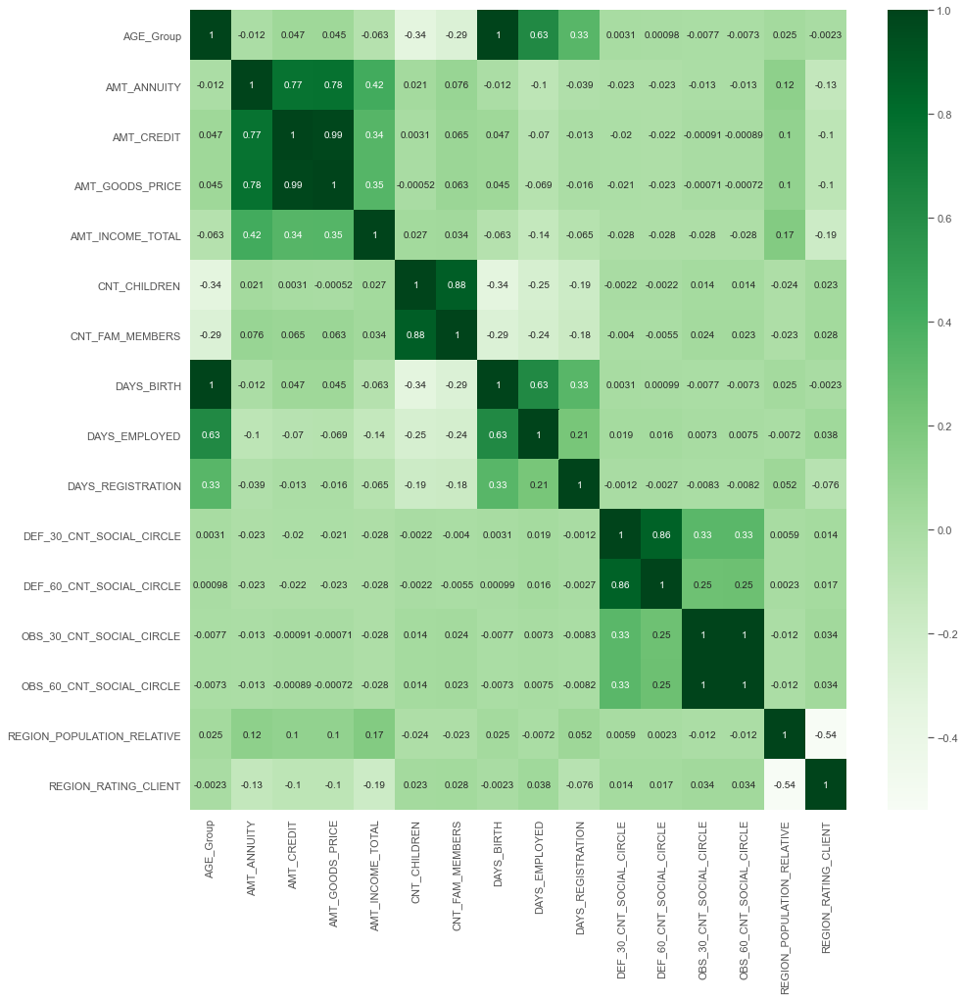

In [120]:
plt.figure(figsize=(15,15))

number_columns = df_0.select_dtypes(include=["number"]).columns


var1_columns = correlation_function(df_0,0.0).head(20)["VAR1"].unique()

var2_columns = correlation_function(df_0,0.0).head(20)["VAR2"].unique()

final_columns = np.unique(np.concatenate((var1_columns, var2_columns), axis=None))


sns.heatmap(df_0[final_columns].astype(float).corr() ,cmap = 'Greens' , annot = True)


plt.show()

### Insights:
1.	From the above Non Defaulters Correlation map, the Variables that be considered to have the highest Pearson Correlation Coefficient are,
 1. AMT_CREDIT
 2. AMT_GOODS_ PRICE
 3. AMT_GOODS_PRICE 
 4. AMT_ANNUITY 
 5. DAYS_EMPLOYED 
 6. DAYS_BIRTH 
 7. DAYS_REGISTRATION
 8. CNT_FAM_MEMBERS




#### Top-20 Correlation Features for  Target_1  -  Defaulters :

In [121]:
correlation_function(df_1,0.0).head(20)

,VAR1,VAR2,Pearson_Correlation
0,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
1,AGE_Group,DAYS_BIRTH,1.00
2,AMT_GOODS_PRICE,AMT_CREDIT,0.98
3,CNT_FAM_MEMBERS,CNT_CHILDREN,0.89
4,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.87
5,AMT_ANNUITY,AMT_CREDIT,0.75
6,AMT_GOODS_PRICE,AMT_ANNUITY,0.75
7,DAYS_EMPLOYED,DAYS_BIRTH,0.58
8,AGE_Group,DAYS_EMPLOYED,0.58
9,REGION_RATING_CLIENT,REGION_POPULATION_RELATIVE,0.44


### Top 10 Correlated Variables : Target_1  -  Defaulters -Heatmap:

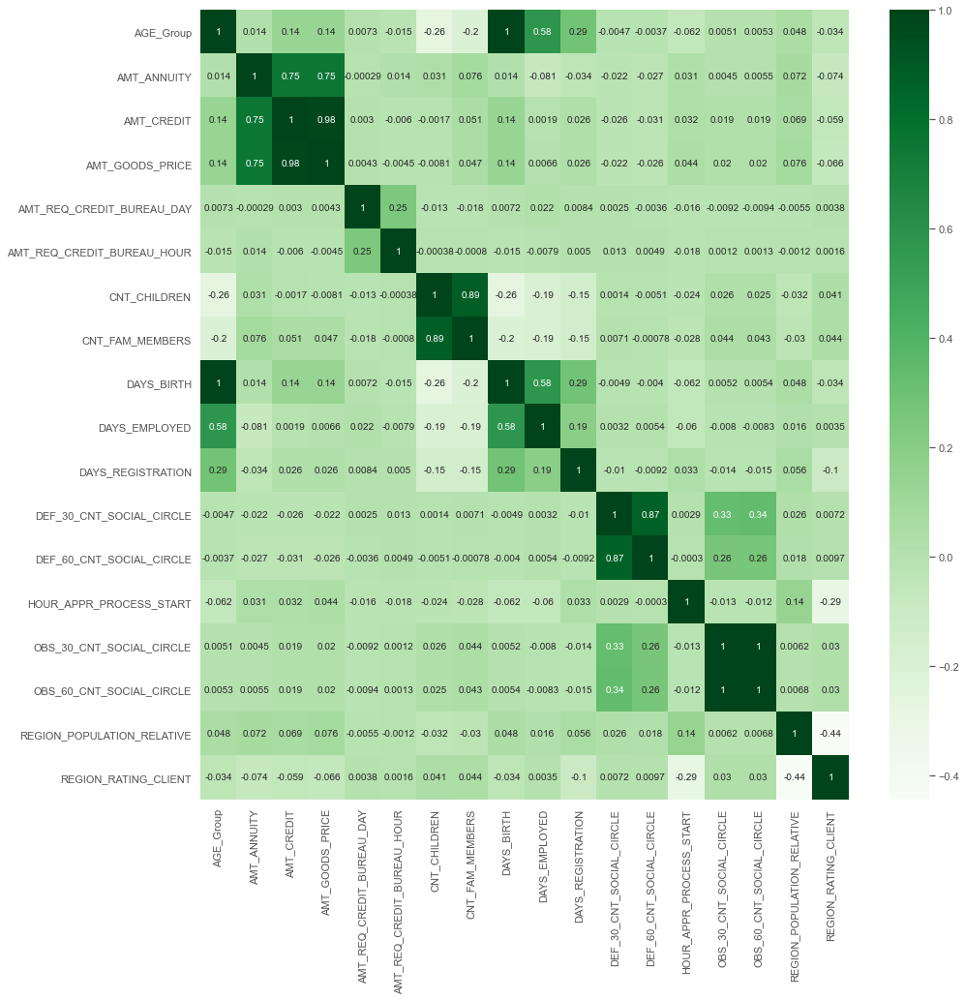

In [122]:
plt.figure(figsize=(15,15))

number_columns = df_1.select_dtypes(include=["number"]).columns


var1_columns = correlation_function(df_1,0.0).head(20)["VAR1"].unique()

var2_columns = correlation_function(df_1,0.0).head(20)["VAR2"].unique()

final_columns = np.unique(np.concatenate((var1_columns, var2_columns), axis=None))


sns.heatmap(df_1[final_columns].astype(float).corr() ,cmap = 'Greens' , annot = True)


plt.show()

### Insights:
1.	From the above Defaulters Correlation Heatmap, the top Variables we can consider as per the highest Pearson Correlation are,
 1. AMT_CREDIT
 2.	AMT_GOODS_ PRICE
 3.	CNT_FAM_MEMBERS
 4.	CNT_CHILDREN
 5.	AMT_ANNUITY 
 6.	DAYS_EMPLOYED 
 7.	DAYS_BIRTH 
 8.	REGION_RATING_CLIENT
 9.	REGION_POPULATION_RELATIVE


#### Scatter Plots:

In [123]:
def bivariate_scatterplot(x,y,df_0,df_1):
    """
    This function will be useful for plotting the scatterplots.
    Parameter(s):
        ------------
            x : x-axis column name
            y : y-axis column name
            df_0 : Non-Defaulters Dataset.
            df_1 : Defaulters Dataset.
            Return(s):
            ---------
            return the scatter plot for both the datasets with x and y axis as variables.
    """
    plt.figure(figsize = (15,4))
    plt.subplot(1,2,1)
    plt.title("Non-Default")
    sns.scatterplot(data = df_0 , x = x, y = y)
  
    plt.subplot(1,2,2)
    plt.title("Default")
    sns.scatterplot(data = df_1 , x = x, y = y)

    plt.show()

### Amount Credit vs Amount Income:

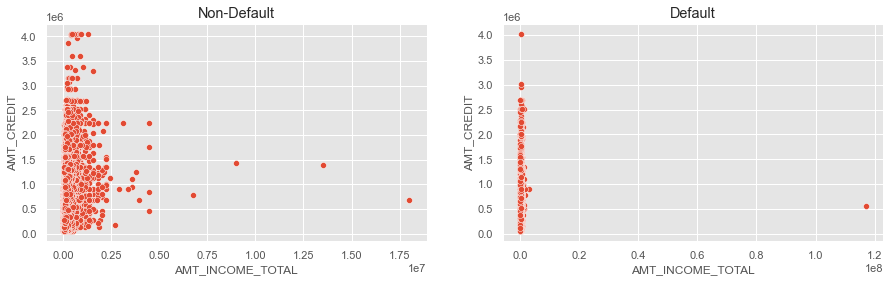

In [124]:
bivariate_scatterplot('AMT_INCOME_TOTAL','AMT_CREDIT',df_0,df_1)

#### Insights for Amount Income vs Amount credit:

1. Among Non-Defaulters,Income & Credit amounts are clustered and only few data points are scattered &have positive linear realtionship.
2. Among Defaulters, Income & Credit is Clustered is clustred no linear relationship observed.


### Amount Income Total vs Amount Annuity:

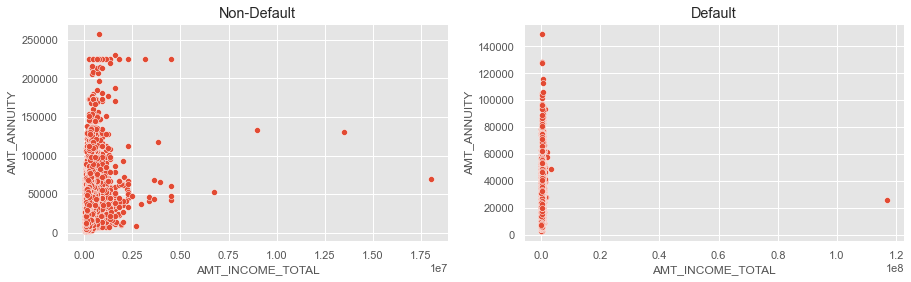

In [125]:
bivariate_scatterplot('AMT_INCOME_TOTAL','AMT_ANNUITY',df_0,df_1)

#### Insights:

1. Among Non-Defaulters, Income & Annuity amounts are clustered and only few data points are scattered & have positive linear relationship.
2. Among Defaulters, Income & Annuity is Clustered & no linear relationship observed.

### Amount Income Total vs Amount Goods Price:

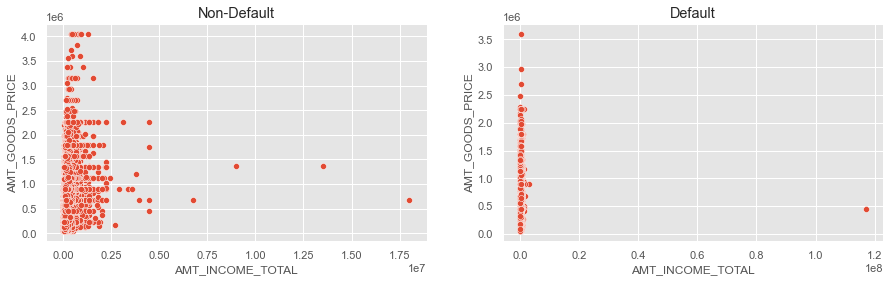

In [126]:
bivariate_scatterplot('AMT_INCOME_TOTAL','AMT_GOODS_PRICE',df_0,df_1)

### Insights:
1. Among Non-Defaulters, Income & Goods_Price amounts are clustered and only few data points are scattered & have positive linear relationship.
2. Among Defaulters, Income & Goods_Price amounts is Clustered & no linear relationship observed.

### Amount Credit vs Amount Annuity:

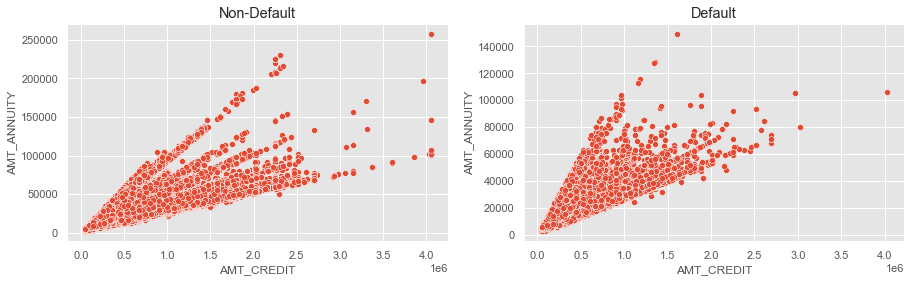

In [127]:
bivariate_scatterplot('AMT_CREDIT','AMT_ANNUITY',df_0,df_1)

### Insights:
1.	Among Non-Defaulters, Credit Amount & Annuity show a positive linear relationship, as the amt Credit is increasing, there is a positive increase in the Annuity.
2.	Among Defaulters, Credit Amount & Annuity show a positive linear relationship.
3.	As the Credit amount increases, Annuity amount also increases, few points are little scattered.


### Amount Goods price vs Amount credit:

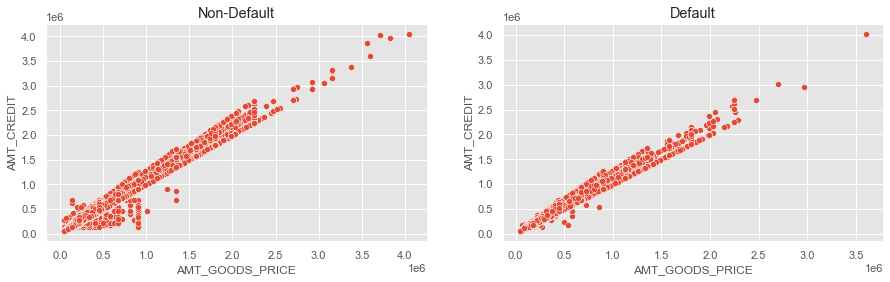

In [128]:
bivariate_scatterplot('AMT_GOODS_PRICE','AMT_CREDIT',df_0,df_1)

### Insights:
1.	For Non-Defaulters, Amount Goods Price & Credit show positive linear relationship. 
2.	Defaulters also have a positive relationship between Credit & Goods Price.

### Goods Price vs Annuity:

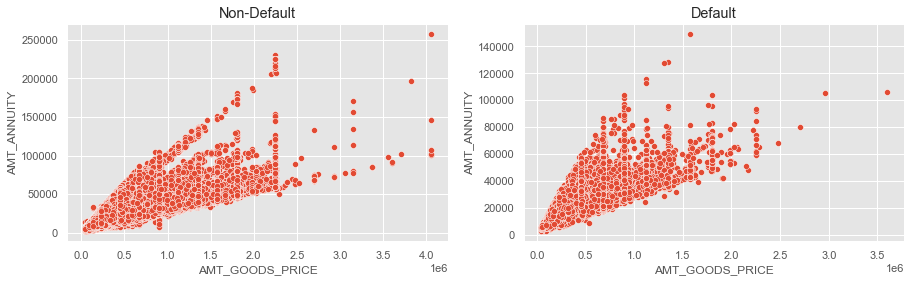

In [129]:
bivariate_scatterplot('AMT_GOODS_PRICE','AMT_ANNUITY',df_0,df_1)

### Insights:
1.	Among Non-Defaulters, the Goods Price  & Annuity show Positive linear relationship.
2.	Defaulters also show Positive linear relationship between Goods Price & Annuity.

### Count of children vs Amount Income Total:

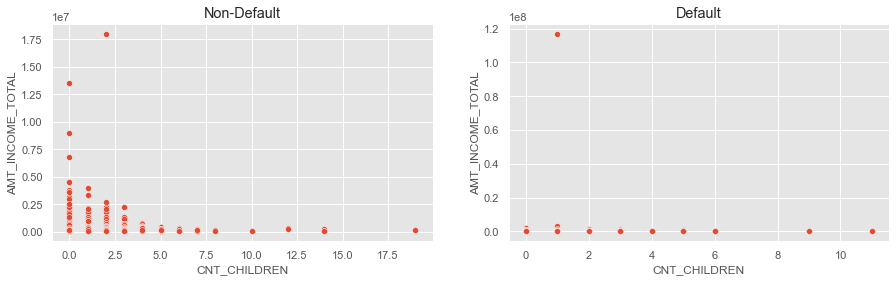

In [130]:
bivariate_scatterplot('CNT_CHILDREN','AMT_INCOME_TOTAL',df_0,df_1)

### Insights: 
1.	Defaulters have less children & less Income around when compared to Non-Defaulters.
2.	Also there is no positive relationship between the children count & Income.

#### Goods price vs region population relative:

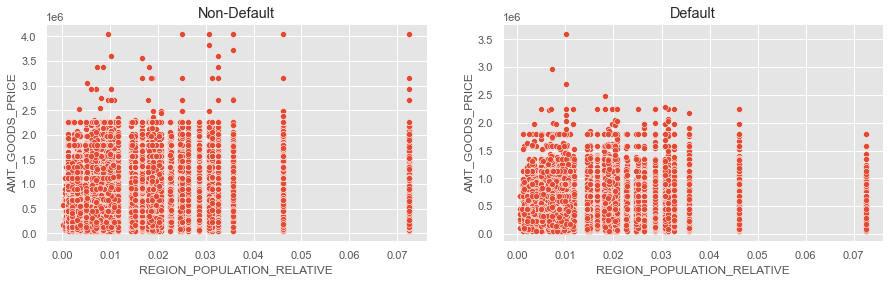

In [131]:
bivariate_scatterplot('REGION_POPULATION_RELATIVE','AMT_GOODS_PRICE',df_0,df_1)

### Insights:
1.	Defaulters live in less populated region & applied for Lesser Goods Amount Credit when compared to Non-Defaulters.

### AMT_REQ_CREDIT_BUREAU_WEEK  vs Income total: 

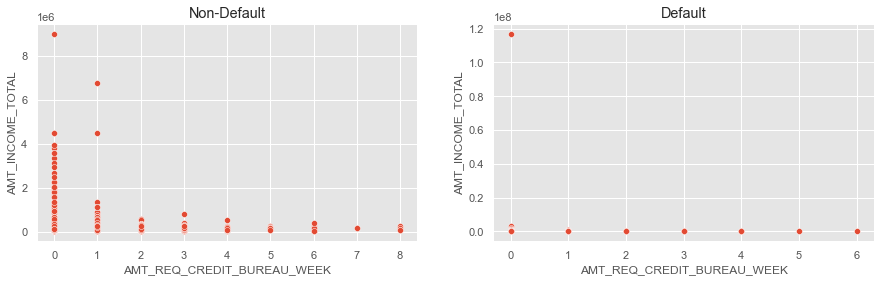

In [132]:
bivariate_scatterplot('AMT_REQ_CREDIT_BUREAU_WEEK','AMT_INCOME_TOTAL',df_0,df_1)

### Insights:
1.	Defaulters have lesser no.of Enquires before one week of submisison of application for lesser Income amount groups when compared to Non-Defaulters.

### Amount credit vs Family members count:

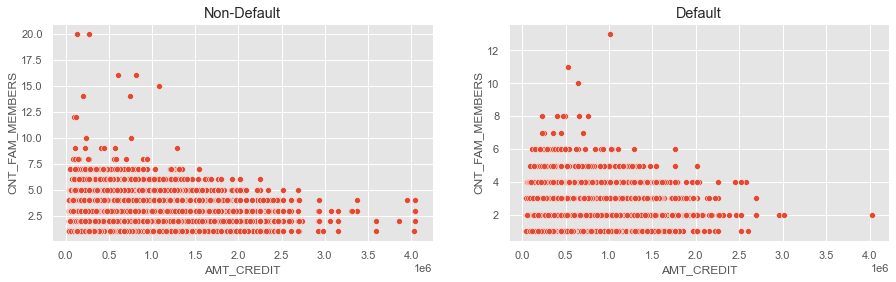

In [133]:
bivariate_scatterplot('AMT_CREDIT','CNT_FAM_MEMBERS',df_0,df_1)

### Insights:
1.	Defaulters do not have any positive relationship between Credit & Family members count.

#### Amount Income total vs Family members:

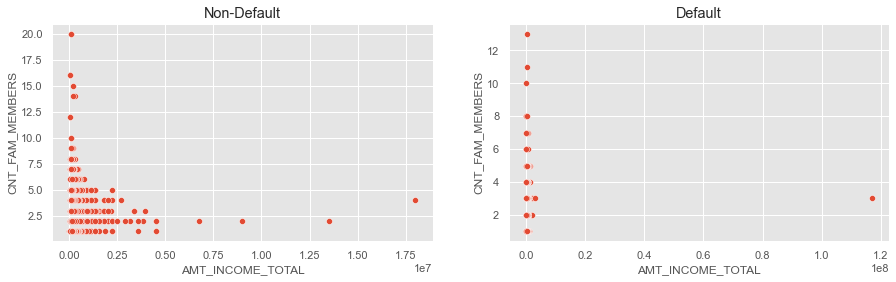

In [134]:
bivariate_scatterplot('AMT_INCOME_TOTAL','CNT_FAM_MEMBERS',df_0,df_1)

### Insights:
1.	Defaulters do not have any positive relationship between Income & Family members count.

### Pairplot of important variables:

<Figure size 1440x576 with 0 Axes>

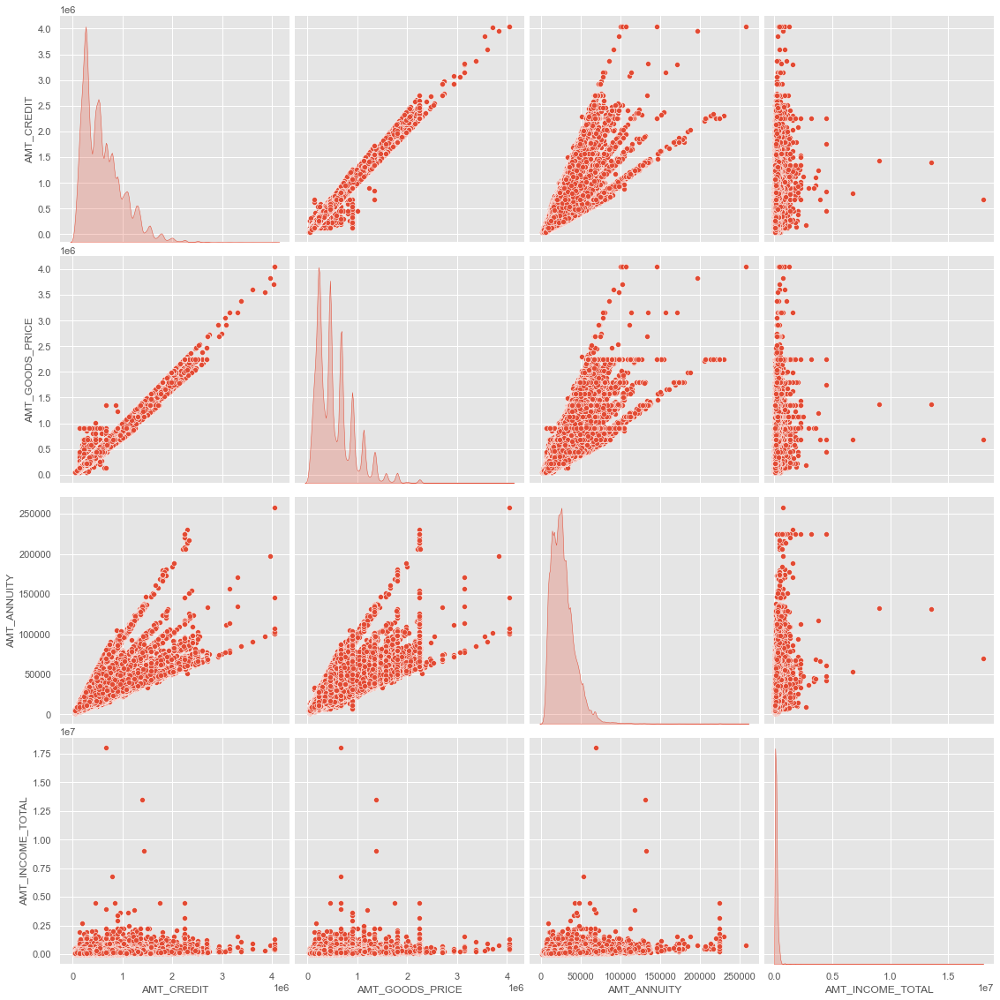

In [135]:
plt.figure(figsize=[20,8])
sns.pairplot(df_0[['AMT_CREDIT','AMT_GOODS_PRICE','AMT_ANNUITY','AMT_INCOME_TOTAL']], 
             diag_kind = 'kde',
             size = 4)
plt.show()

### Insights:
1.	Among Non-Defaulters, there is linear & positive relationship between Credit, Annuity & Goods Price variables.
2.	Income is not showing any linear relationship with Credit, Annuity  & Goods Price variables.

<Figure size 1440x576 with 0 Axes>

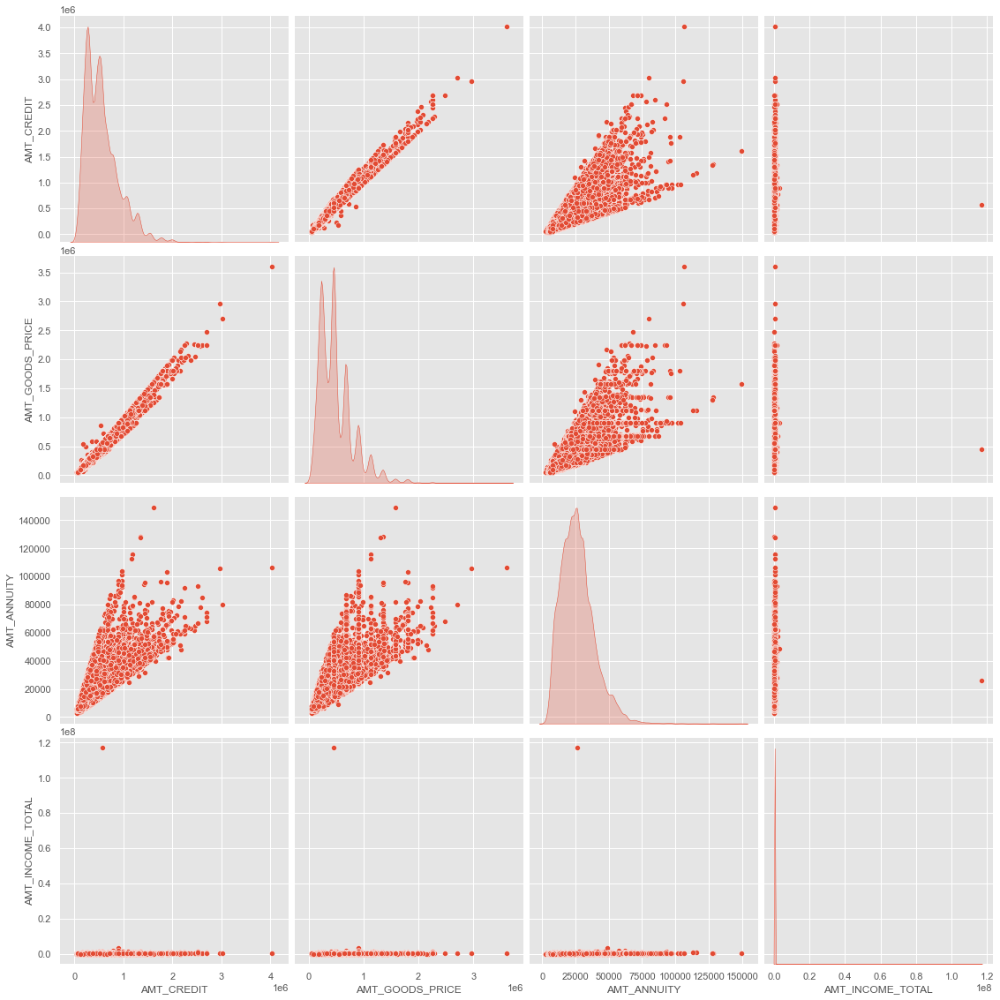

In [136]:
plt.figure(figsize=[20,8])
sns.pairplot(df_1[['AMT_CREDIT','AMT_GOODS_PRICE','AMT_ANNUITY','AMT_INCOME_TOTAL']], 
             diag_kind = 'kde',
             size = 4)
plt.show()

### Insights:
1.	Among Defaulters, there is linear & positive relationship between Credit, Annuity & Goods Price.
2.	Income is not showing any linear relationship with Credit, Annuity & Goods Price variables.

#### Categorical to Categorical columns:

In [137]:
def categorical_to_categorical(x,y,df_0,df_1):
    """
    This function will be useful for categorical to categorical plots.
    Parameter(s):
        ------------
            x : x-axis column name
            y : y-axis column name
            df_0 : Non-Defaulters Dataset.
            df_1 : Defaulters Dataset.
            Return(s):
            ---------
            return the count plot for both the datasets with x and y axis as variables.
    """
    
    plt.figure(figsize = (25,15))
    
    plt.subplot(2,1,1)
    plt.title("Non-Default")
    sns.countplot(x, data = df_0 ,hue = y)
    

    plt.subplot(2,1,2)
    plt.title("Default")
    sns.countplot(x, data = df_1 ,hue = y )
    plt.show()

### Family Status vs Occupation type:

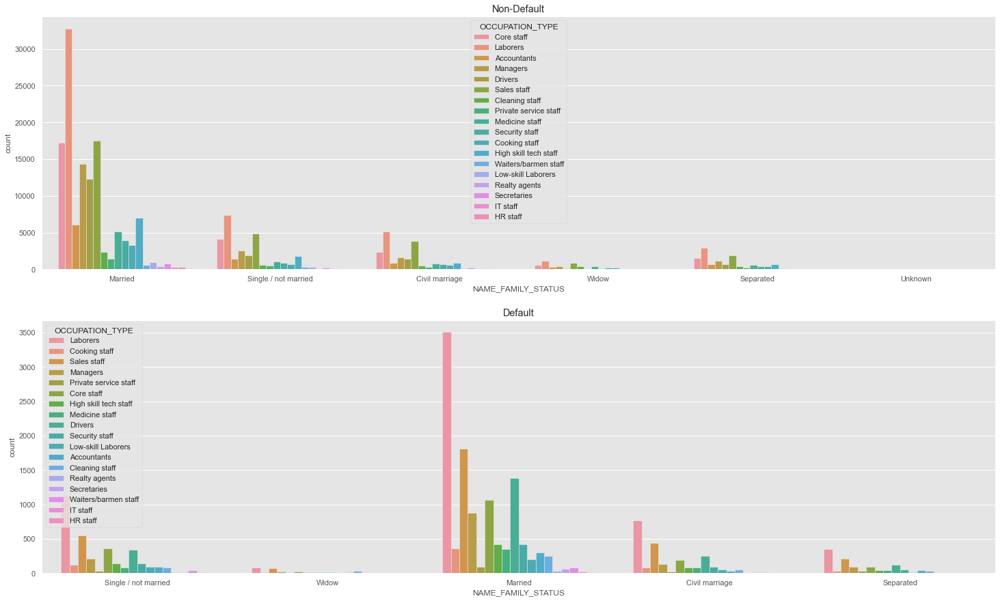

In [138]:
categorical_to_categorical("NAME_FAMILY_STATUS","OCCUPATION_TYPE",df_0,df_1)

### Insights:
1.	Most of the Non-Defaulters are Married & Core Staff by occupation. Least are Widow with Laborer occupation.
2.	Most of the Defaulters are Married & Laborers and least are Widow & Laborers.


In [139]:
categorical_columns = Final_Application_dataset.select_dtypes(include=["bool","object","category"]).columns

### Code Gender vs Occupation type:

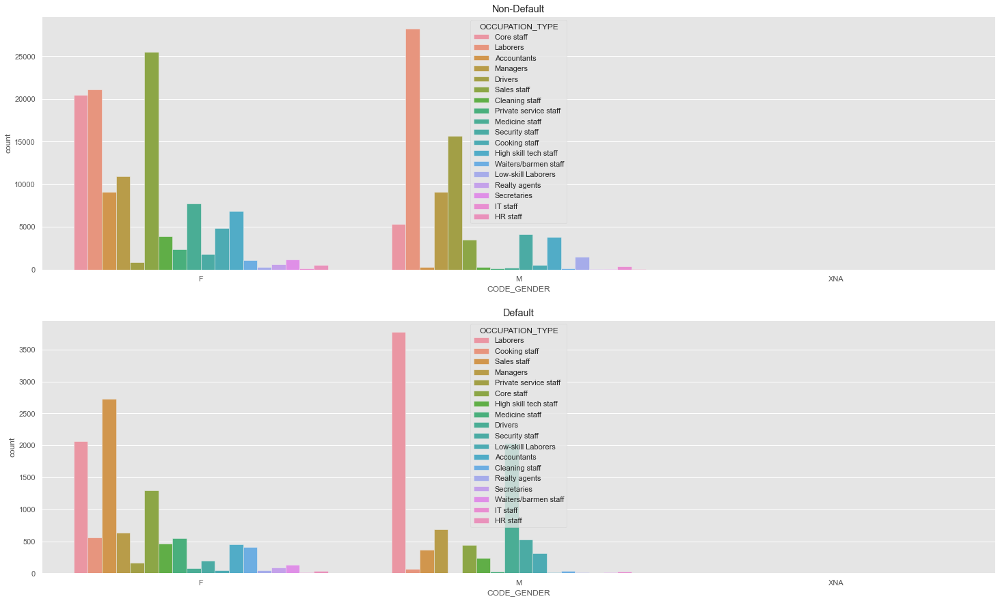

In [140]:
categorical_to_categorical("CODE_GENDER","OCCUPATION_TYPE",df_0,df_1)

### Insights:
1. Most of the Non-Defaulters are Male & Laborers and least is Male IT Staff
2. Most of the Defaulters are Male & Laborers and least is Male IT Staff

### Income Type Vs Education Type:

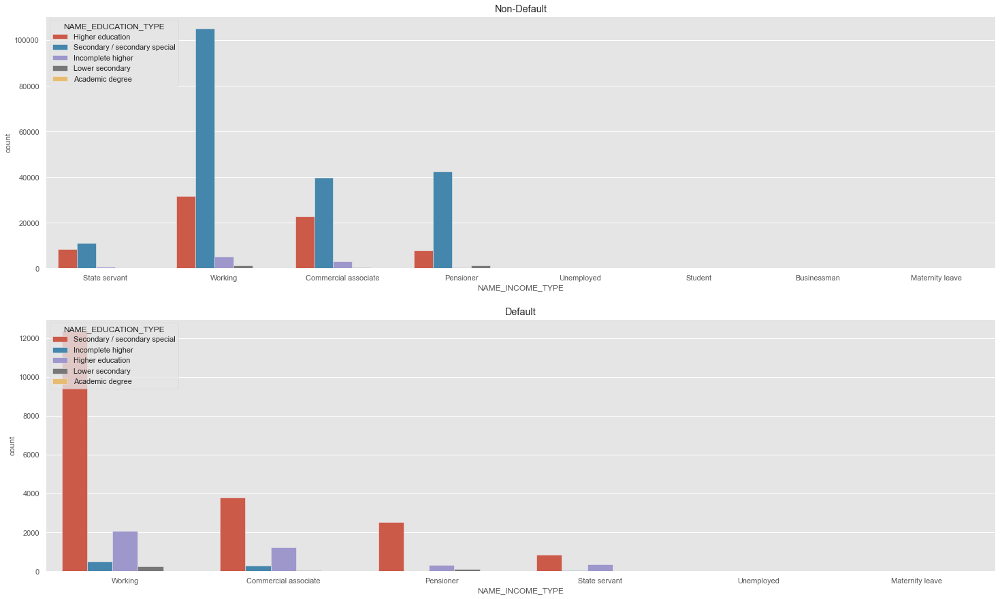

In [141]:
categorical_to_categorical("NAME_INCOME_TYPE","NAME_EDUCATION_TYPE",df_0,df_1)

### Insights:
1. Most of the Non-Defaulters are Working with Secondary/ Secondary Special education.
2. Most of the Defaulters are Working with Secondary/Secondary Special education.


### Income Type vs Family Status:

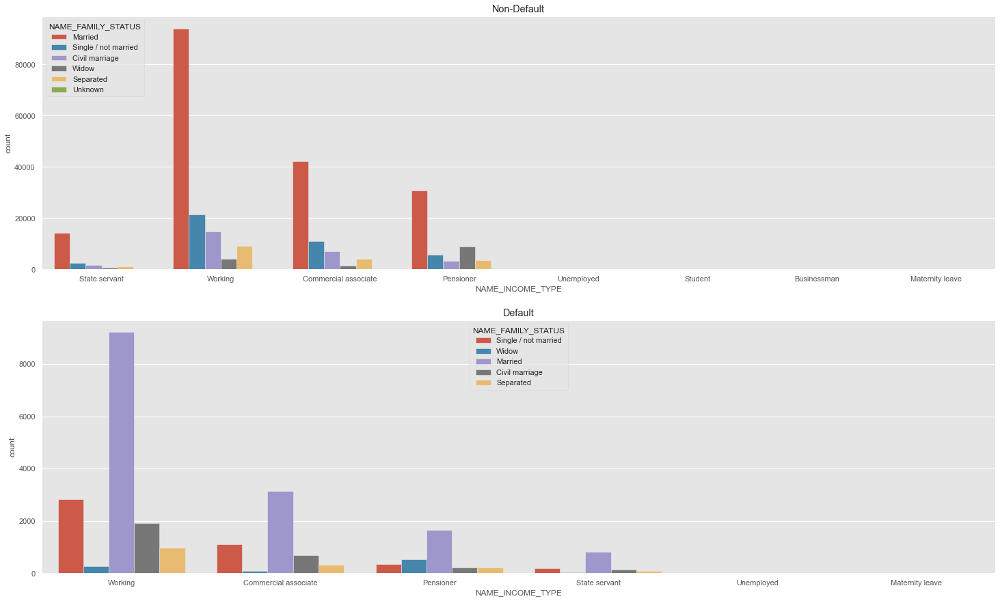

In [142]:
categorical_to_categorical("NAME_INCOME_TYPE","NAME_FAMILY_STATUS",df_0,df_1)

### Insights:
1. Most of the Non- Defaulters are Working & Married.
2. Most of the Defaulters are Working & Married.

#### Income Type vs Name housing type:

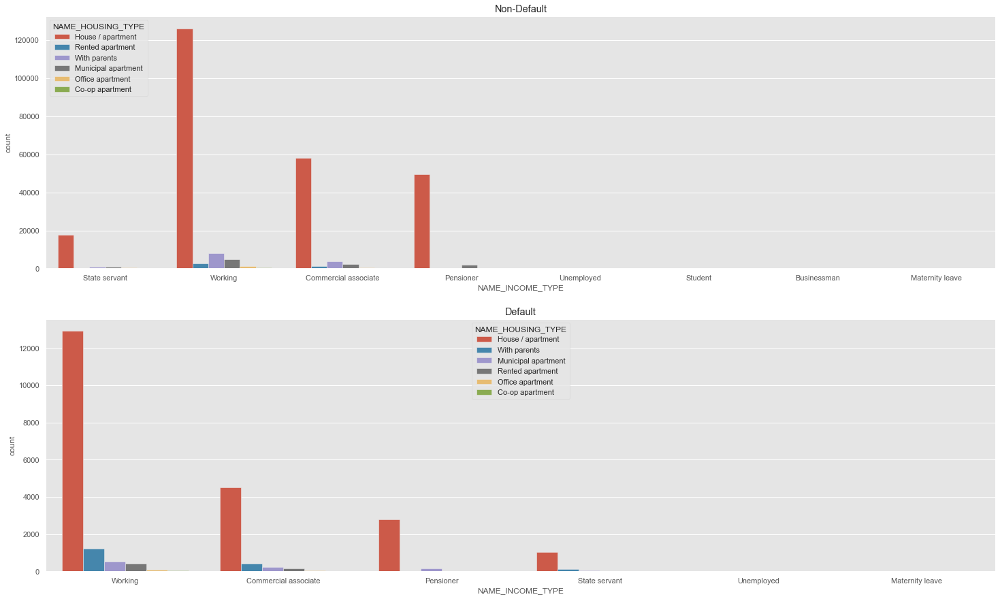

In [143]:
categorical_to_categorical("NAME_INCOME_TYPE","NAME_HOUSING_TYPE",df_0,df_1)

### Insights:
1. Most of the Non- Defaulters are Working & Own House/Apartment.
2. Most of the Defaulters are Working & own a House/Apartment, least are State Servant & stay with Parents

### Income Type vs  LIVE_CITY_NOT_WORK_CITY:

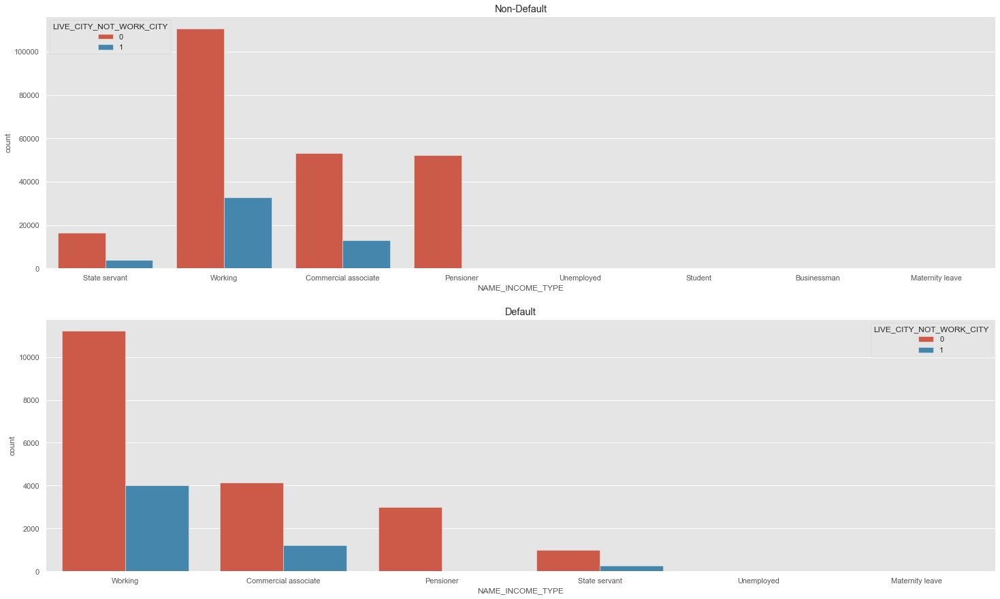

In [144]:
categorical_to_categorical("NAME_INCOME_TYPE","LIVE_CITY_NOT_WORK_CITY",df_0,df_1)

### Insights:
1. Most of the Non-Defaulters Contact address match with the work City.
2. Most of the Defaulters Contact address match with the work City.

####  Education Type vs OWN CAR:

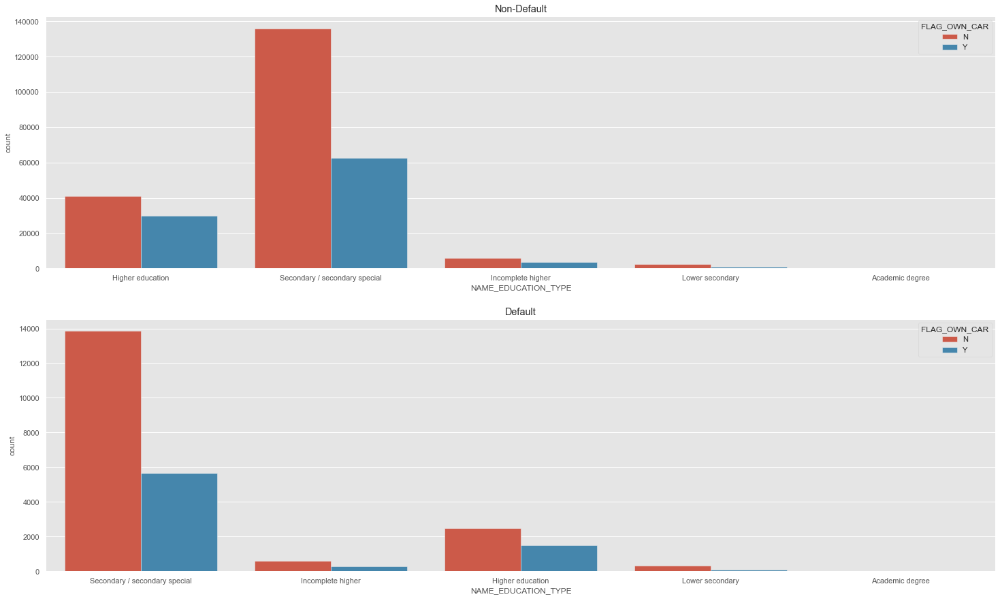

In [145]:
categorical_to_categorical("NAME_EDUCATION_TYPE","FLAG_OWN_CAR",df_0,df_1)

### Insights:
1.	Most of the Non-Defaulters & Defaulters with Secondary/Secondary Special & do not own a car. 

#### Name Income type vs Flag own car:

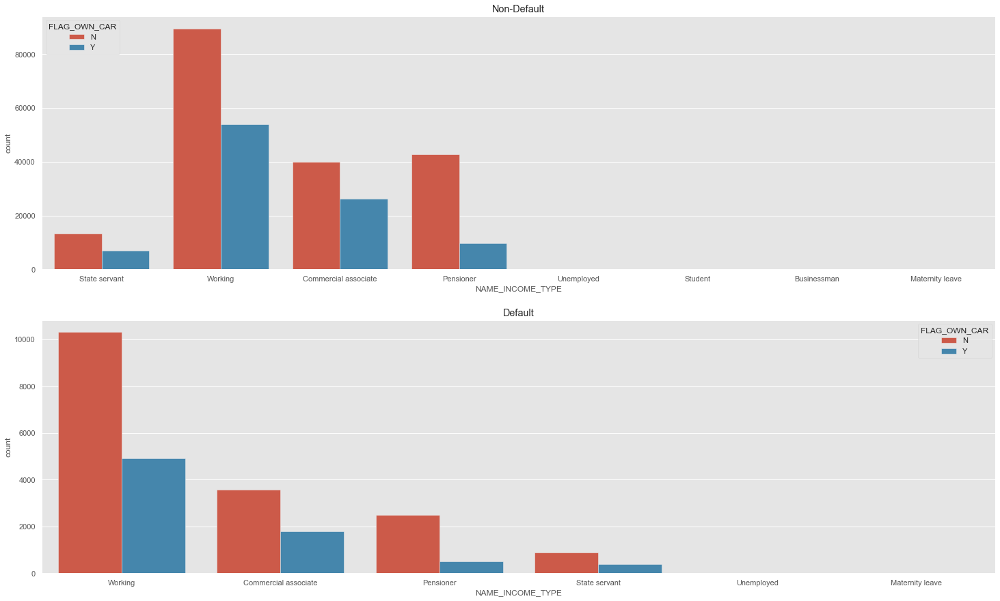

In [146]:
categorical_to_categorical("NAME_INCOME_TYPE","FLAG_OWN_CAR",df_0,df_1)

### Insights:
1. Most of the Defaulters & Non-Defaulters who are Working have a Car. State Servants are the least who own the car.

### Occupation type vs own car:

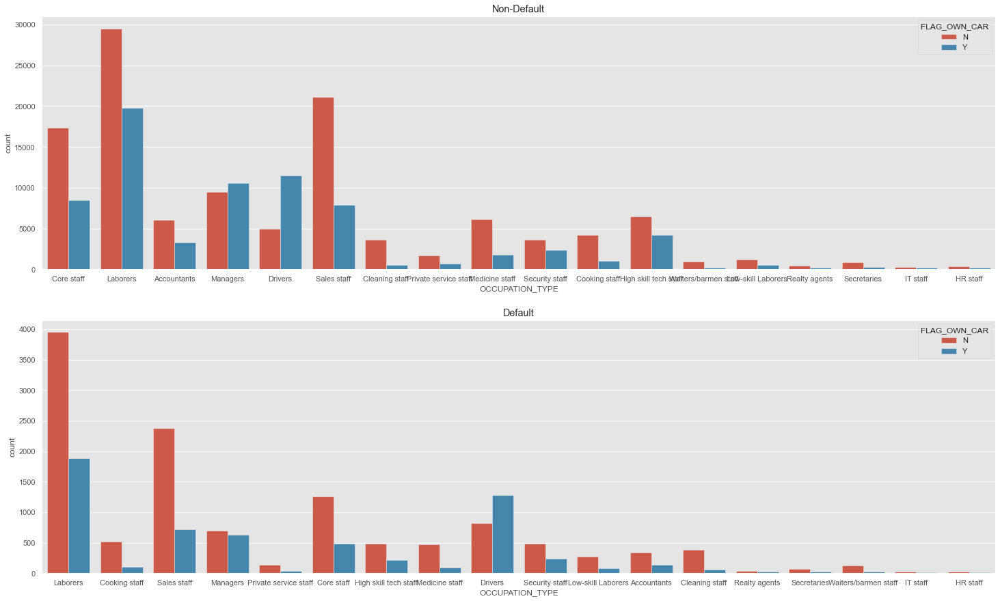

In [147]:
categorical_to_categorical("OCCUPATION_TYPE","FLAG_OWN_CAR",df_0,df_1)

### Insights:
1. Most of the Non-Defaulters are Laborers & don’t own a Car.
2. Most of the Defaulters are Laborers & don’t own a Car.


### Occupation type vs NAME_HOUSING_TYPE:

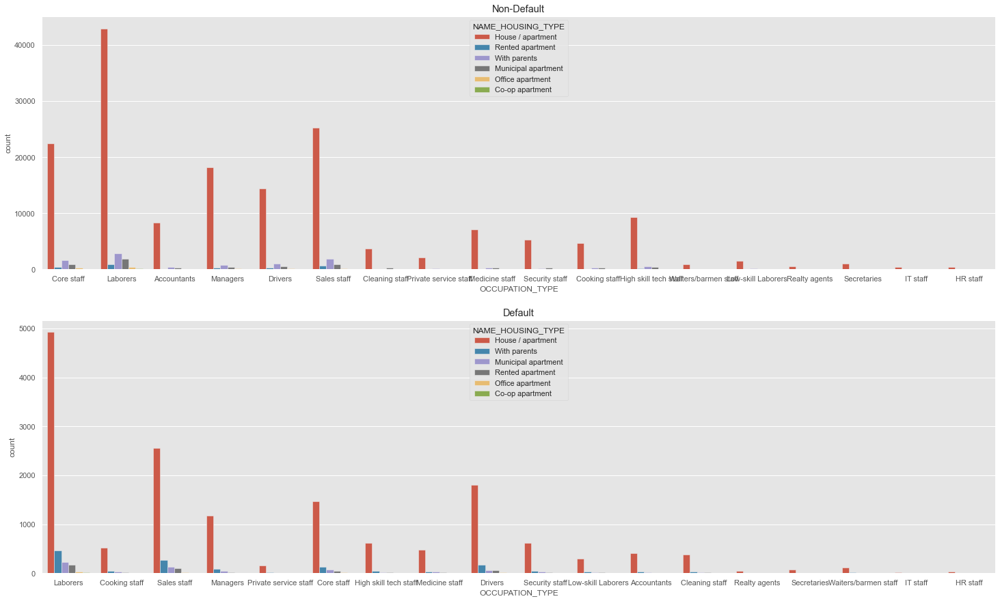

In [148]:
categorical_to_categorical("OCCUPATION_TYPE","NAME_HOUSING_TYPE",df_0,df_1)

### Insights:
1. Most of the Non-Defaulters are Laborers with own House/Apartment & least are the HR Staff with Own House/Apartment.
2. Most of the Defaulters are Laborers with own House/Apartment & least are the IT Staff with own House/Apartment


#### Numerical to Categorical columns:

In [149]:
#by variant analysis function
def biv_plot(cat, num,df_0,df_1):
    
    """
    This function will be useful for boxen plot
    Parameter(s):
        ------------
            x : x-axis column name - categorical
            y : y-axis column name - numerical
            df_0 : Non-Defaulters Dataset.
            df_1 : Defaulters Dataset.
            Return(s):
            ---------
            return the boxen plot for both the datasets with x and y axis as variables.
    """
    
     
    plt.style.use('ggplot')
    sns.despine
    fig,ax = plt.subplots(1,1,figsize=(10,8))
    
    sns.boxenplot(x=cat,y = num, data=df_0)
    ax.set_ylabel(f'{num}')
    ax.set_xlabel(f'{cat}')

    ax.set_title(f'Default {cat} Vs {num}',fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
     
    fig,ax = plt.subplots(1,1,figsize=(10,8))
    
    sns.boxenplot(x=cat,y = num, data=df_1)
    ax.set_ylabel(f'{num}')
    ax.set_xlabel(f'{cat}')

    ax.set_title(f'Non Default {cat} Vs {num}',fontsize=15)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
     
    
    plt.show()

### Amount  Annuity vs Name Income Type:


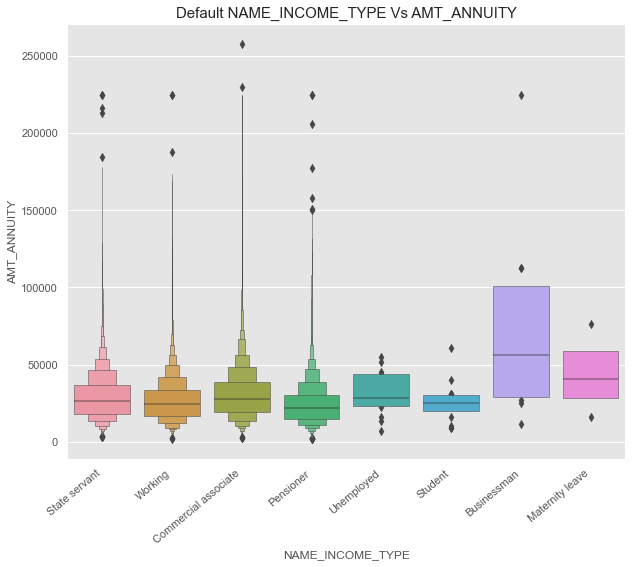

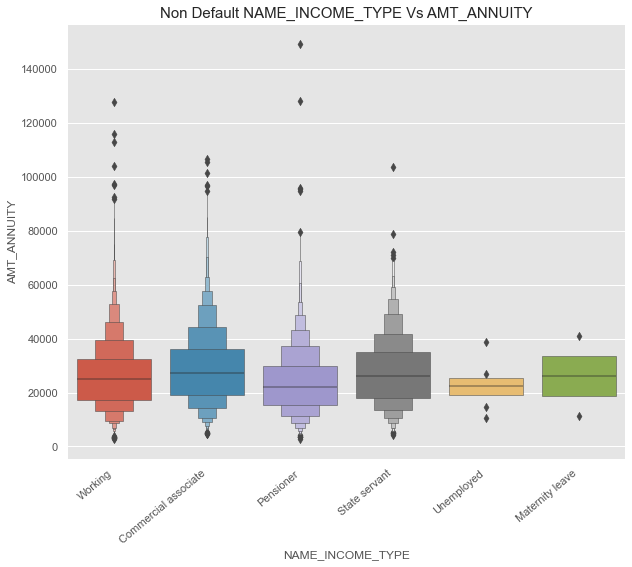

In [150]:
biv_plot("NAME_INCOME_TYPE", "AMT_ANNUITY",df_0,df_1)

### Insights:
1.	Among Defaulters, Businessman pay the highest Annuity & Students pay the least Annuity.
2.	Among Non- Defaulters, Commercial Associates pay the highest Annuity & Unemployed pay the least Annuity.
3.	There appear many data points above the Upper Whisker & Lower Whisker, but cannot be considered as Outliers unless we look into the Credit amounts.


### NAME_INCOME_TYPE vs AMT_INCOME_TOTAL:

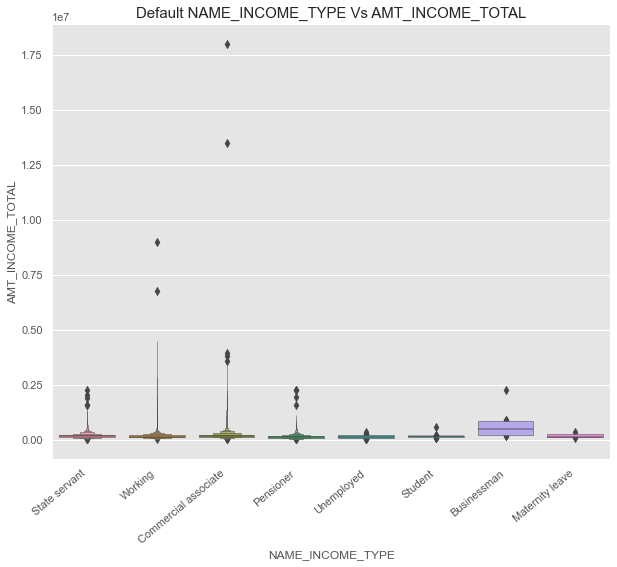

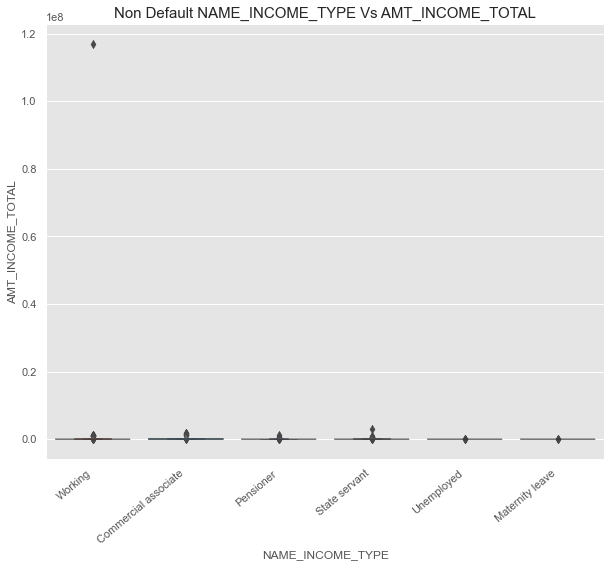

In [151]:
biv_plot("NAME_INCOME_TYPE", "AMT_INCOME_TOTAL",df_0,df_1)

### Insights:
1.	Among Defaulters, Businessman pay the highest Annuity & Students pay the least Annuity.
2.	Among Non- Defaulters, Commercial Associates pay the highest Annuity & Unemployed pay the least Annuity.
3.	There appear many data points above the Upper Whisker & Lower Whisker, but cannot be considered as Outliers unless we look into the Credit amounts.


### FLAG_OWN_CAR vs AMT_ANNUITY:

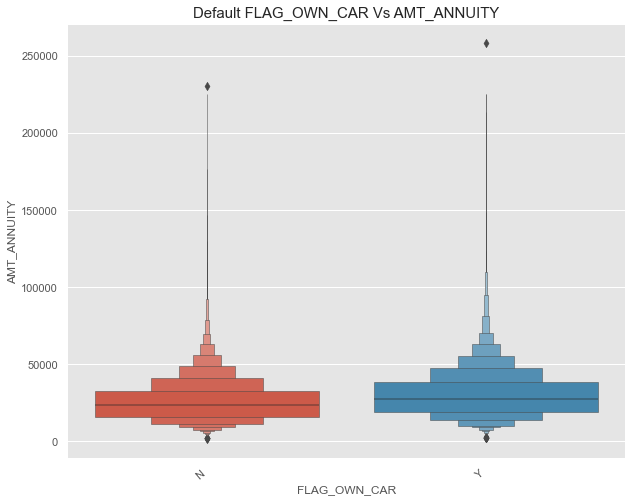

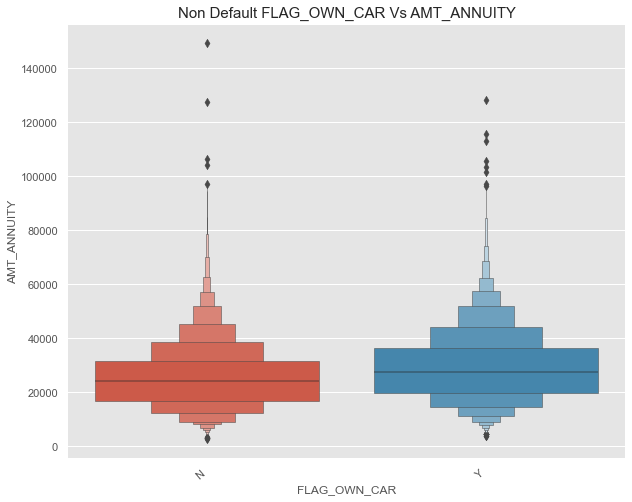

In [152]:
biv_plot("FLAG_OWN_CAR", "AMT_ANNUITY",df_0,df_1)

### Insights:
1. Defaulters who pay high Annuity own a Car.
2. Non-Defaulters who pay high Annuity own a Car. There appears Outliers but have to handled separately


### NAME_EDUCATION_TYPE vs AMT_INCOME_TOTAL:

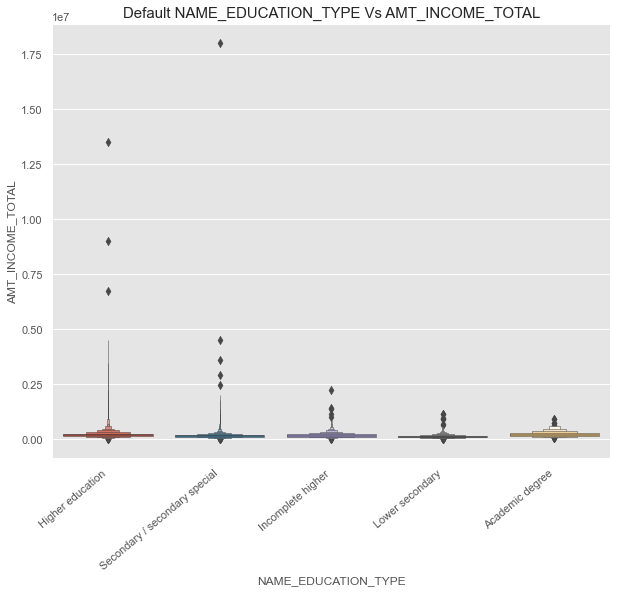

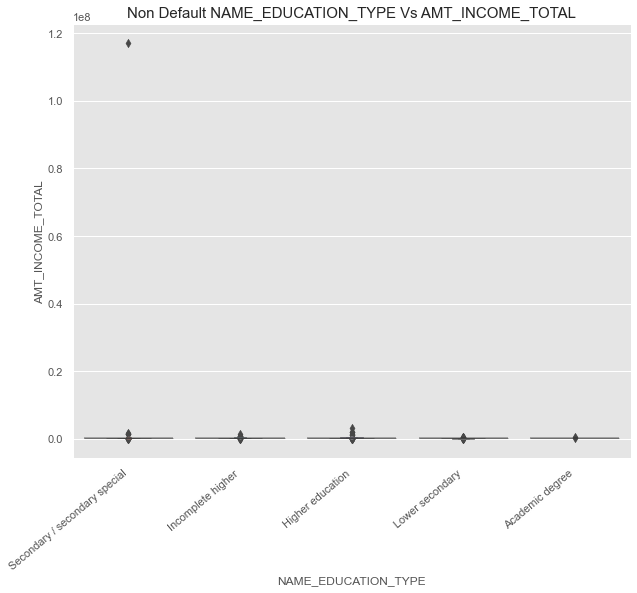

In [153]:
biv_plot("NAME_EDUCATION_TYPE", "AMT_INCOME_TOTAL",df_0,df_1)

### Insights:
1.	Most of the Defaulters have Higher Education & with Higher Total Income. Outliers are present and can be ignored as there is not boundary or Income Cut of Range.

### CODE_GENDER vs AMT_ANNUITY:

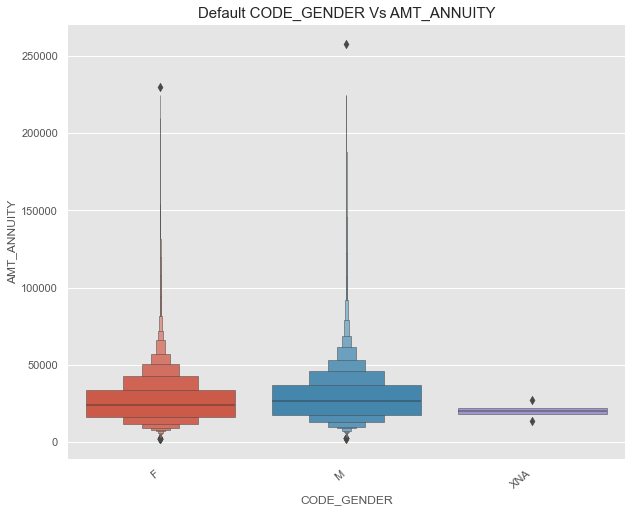

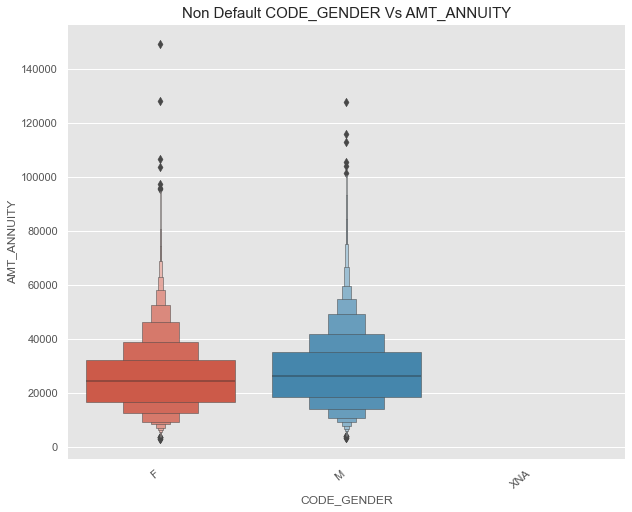

In [154]:
biv_plot("CODE_GENDER", "AMT_ANNUITY",df_0,df_1)

### Insights:
1. Most of the Defaulters are Male with High Annuity amount between 2-2.5 Lakhs.
2.	Most of the Non-Defaulters are Male with High Annuity amount around 1Lakh
3.	Defaulters Annuity is comparatively lesser than the Non-Defaulters Annuity amount.

### NAME_EDUCATION_TYPE vs AMT_ANNUITY:

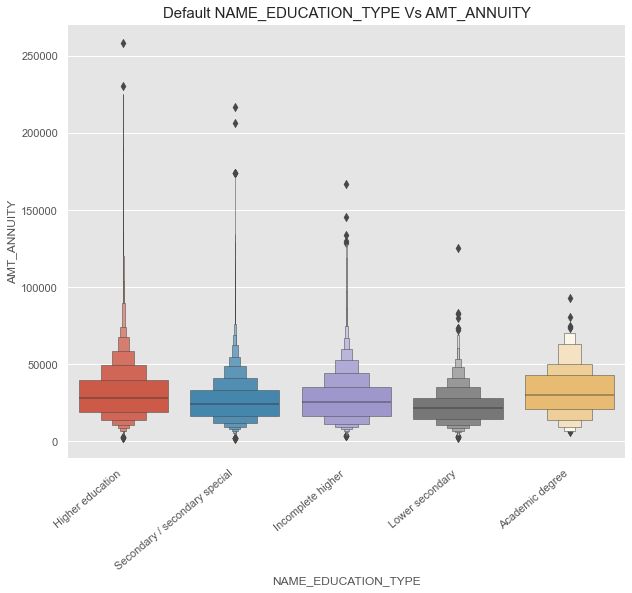

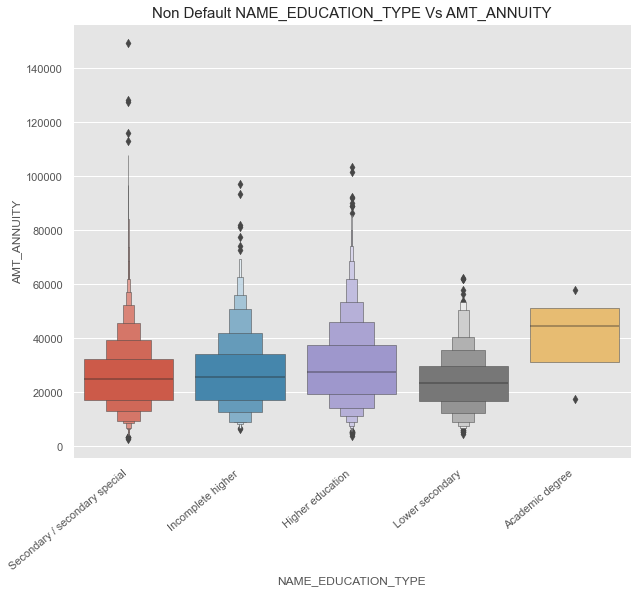

In [155]:
biv_plot("NAME_EDUCATION_TYPE", "AMT_ANNUITY",df_0,df_1)

### Insights:
1.	Highest no of Defaulters have Higher Education & pay high amount of Annuity between 2- 2.5 Lakhs
2.	Highest no of Non-Defaulters have Higher Education & pay High Annuity between 1-1.2 Lakhs.

### NAME_CONTRACT_TYPE vs AMT_ANNUITY:

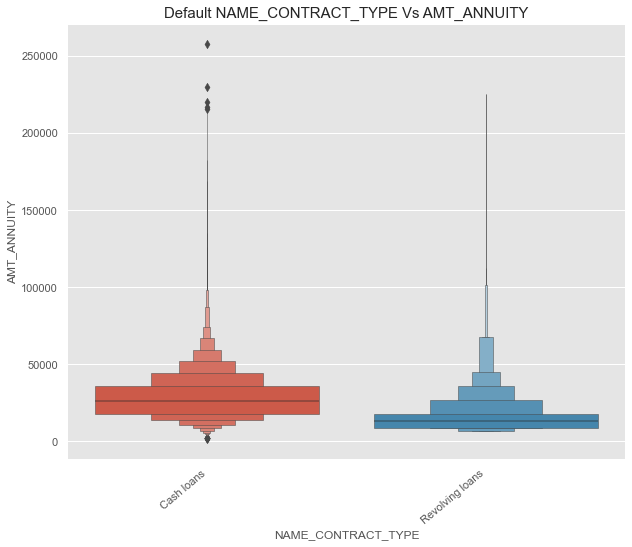

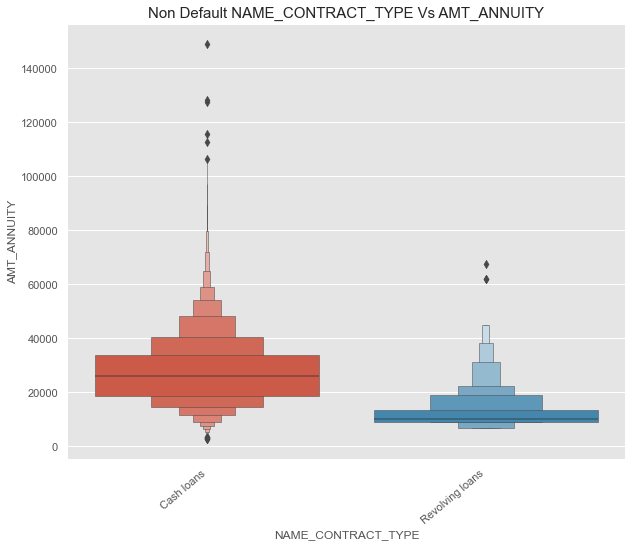

In [156]:
biv_plot("NAME_CONTRACT_TYPE", "AMT_ANNUITY",df_0,df_1)

### Insights:
1. Most of the Defaulters have opted for Cash Loans with Annuity between 2-2.5 Lakhs.
2. Non-Defaulters have opted for Cash Loans with Annuity of 1-1.2 Lakhs.

### NAME_CONTRACT_TYPE vs AMT_GOODS_PRICE:

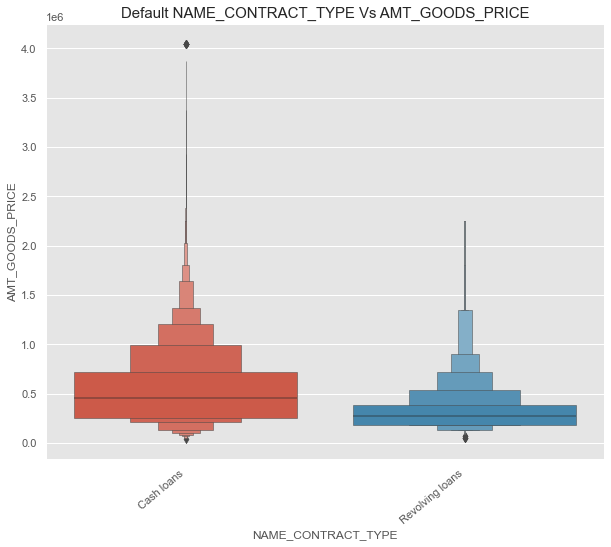

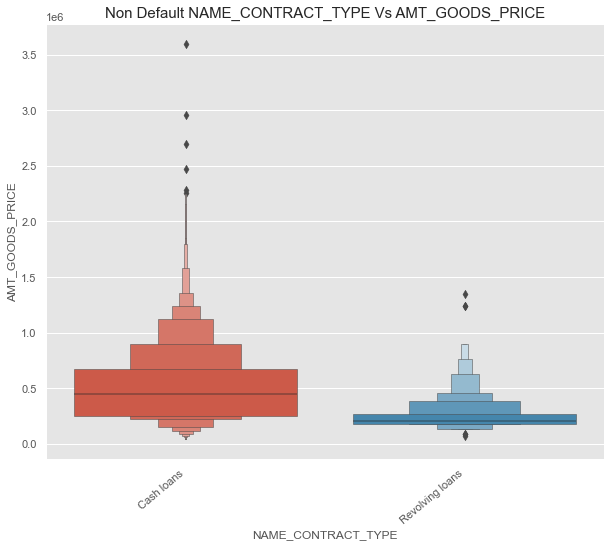

In [157]:
biv_plot("NAME_CONTRACT_TYPE", "AMT_GOODS_PRICE",df_0,df_1)

### Insights:
1. Most of the Defaulters Opted Cash Loans for Goods Price.
2. Most of the Defaulters opted for Cash loans for Goods Price.


### NAME_CONTRACT_TYPE vs AMT_CREDIT:

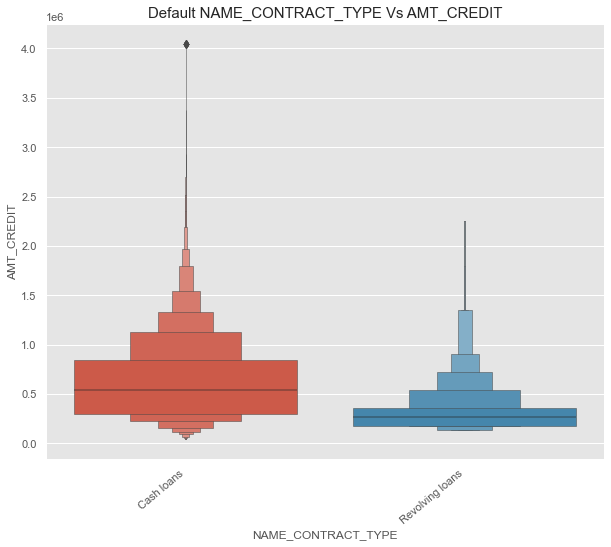

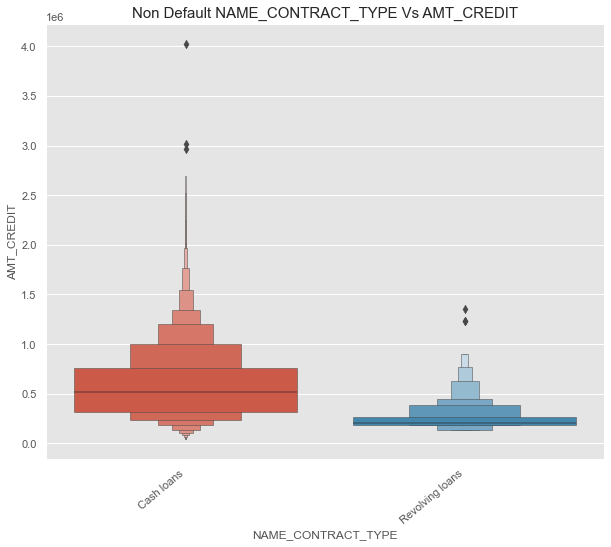

In [158]:
biv_plot("NAME_CONTRACT_TYPE", "AMT_CREDIT",df_0,df_1)

### Insights:
1. Most of the Defaulters & Non-Defaulters opted for Cash loans over Revolving Loans.

### NAME_EDUCATION_TYPE vs AMT_CREDIT:

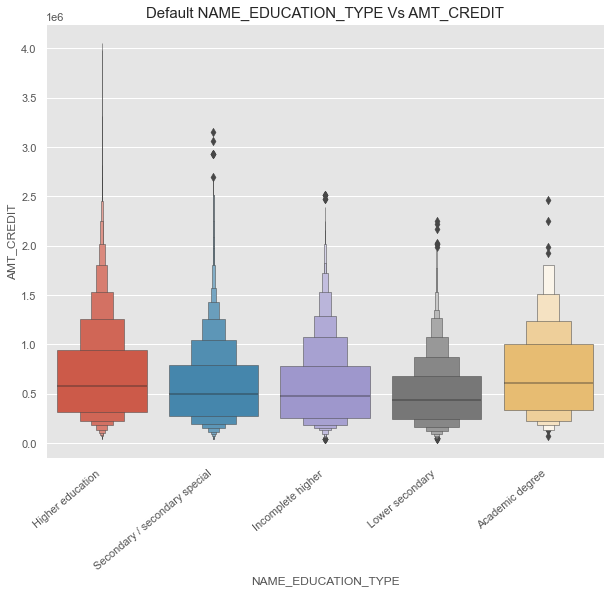

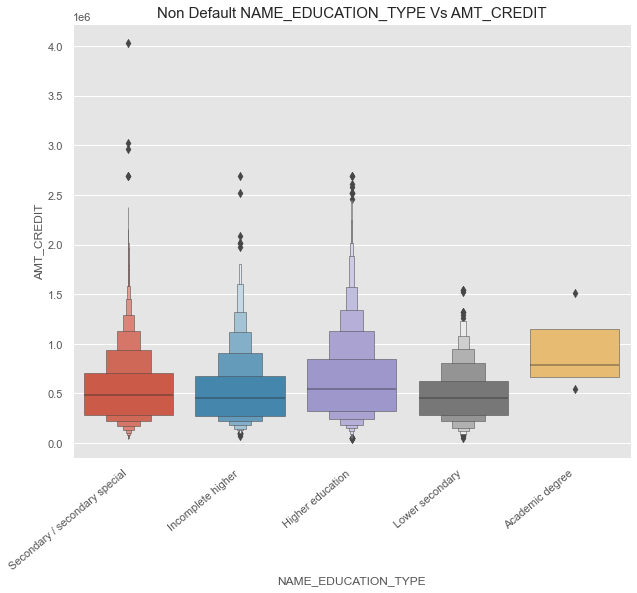

In [159]:
biv_plot("NAME_EDUCATION_TYPE", "AMT_CREDIT",df_0,df_1)

### Insights:
1. Most of the Defaulters with Higher Education got the Credit approved.
2.	Most of the Non-Defaulters with Higher Education got Credit approved.

### AMT_INCOME_BINS vs AMT_CREDIT:

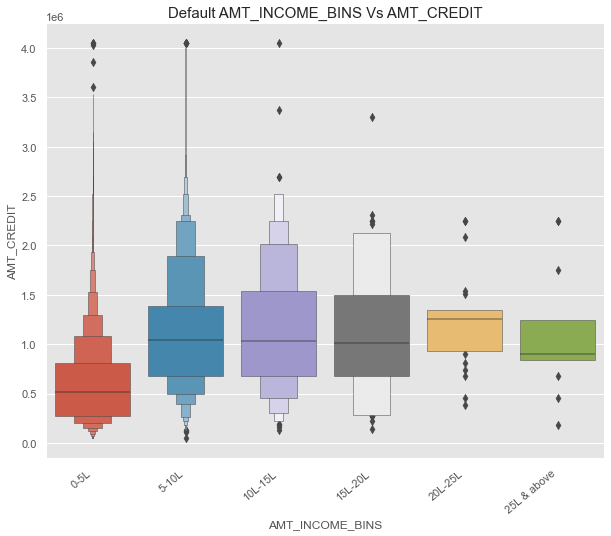

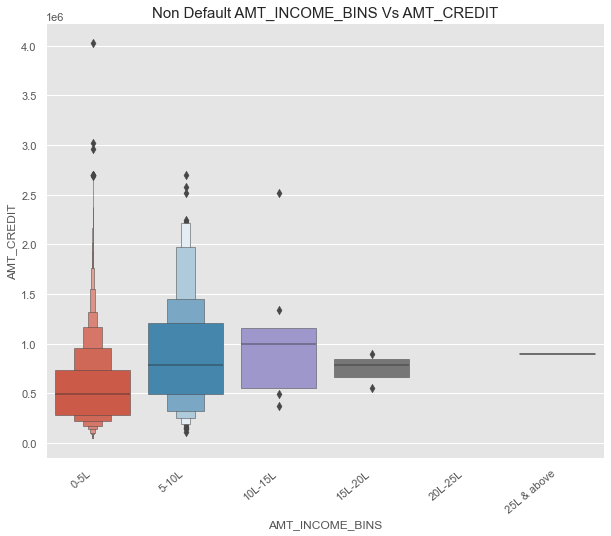

In [160]:
biv_plot("AMT_INCOME_BINS", "AMT_CREDIT",df_0,df_1)

### Insights:
1. Defaulters with 10-15 Lakhs Income got the highest Credit approved.
2. Non-Defaulters with 5-10Lakhs Income got highest Credit approved.


### NAME_HOUSING_TYPE vs AMT_CREDIT:

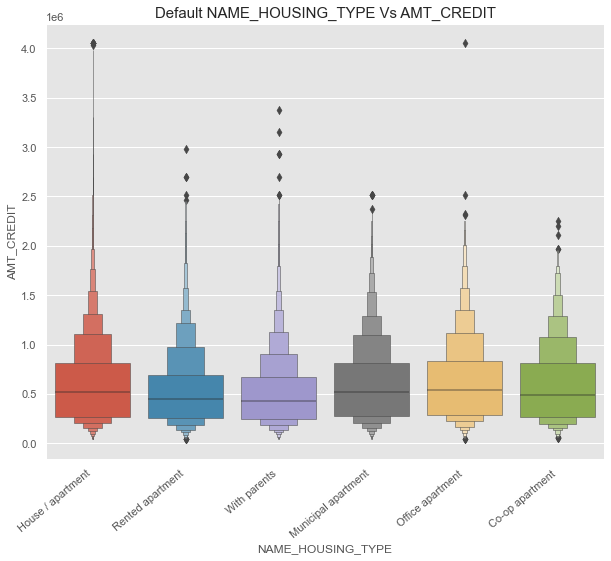

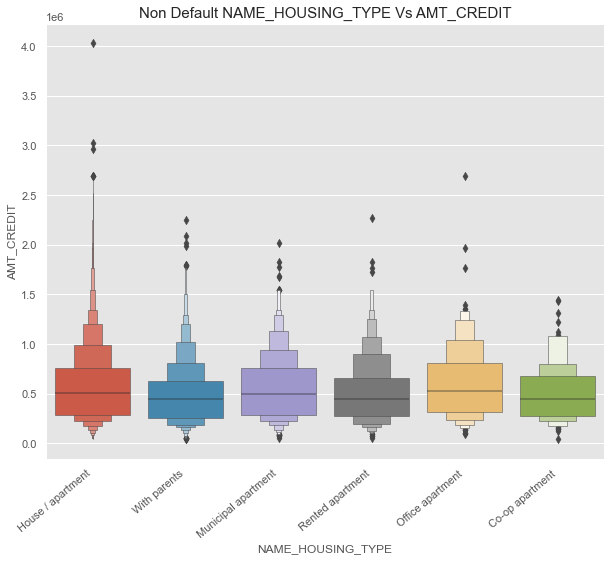

In [161]:
biv_plot("NAME_HOUSING_TYPE", "AMT_CREDIT",df_0,df_1)

### Insights:
1. Most of the Defaulters who own House/Apartment got the Credit approved.
2. Most of the Non-Defaulters who own House/Apartment have for Credit approved.


### Analyze 2 or more than variables:

In [162]:
def more_than_2_variables(index_columns,columns,values,title,xlabel,ylabel,df_0,df_1):
    
    """
    This function will be used to pivotting the data and plot the heatmap.

            Parameter(s):
            ------------
               index_columns : pivot the columns
               columns :  column_level data
               values :  aggregate the value using various columns
               xlabel :  x-axis label
               ylabel : y-axis label
               df_0 : defaulters dataset
               df_1 : non-defaulters dataset
               title : title for the heatmap

            Return(s):
            ---------
               Print the heatmap.
    """
    
    avg_app_0 = pd.pivot_table(data=df_0, 
                           index = index_columns,
                                 columns=str(columns), values=str(values), 
                                 aggfunc='mean', fill_value = 0)
    avg_app_1 = pd.pivot_table(data=df_1, 
                          index = index_columns,
                                 columns=str(columns), values=str(values), 
                                 aggfunc='mean', fill_value = 0)
    plt.figure(figsize=(20,16))

    plt.subplot(1,2,1)
    sns.heatmap(avg_app_0, annot = True, cmap = 'RdYlGn', fmt = '.1f')
    plt.title("Non_Defaulters" + " " + title, fontsize = 16)
    plt.xlabel(xlabel, fontsize = 12)
    plt.ylabel(ylabel, fontsize=12)

    plt.subplot(1,2,2)
    sns.heatmap(avg_app_1, annot = True, cmap = 'RdYlGn', fmt = '.1f')
    plt.title("Defaulters" + " " + title, fontsize = 16)
    plt.xlabel(xlabel, fontsize = 12)
    plt.ylabel(ylabel, fontsize=12)

    plt.subplots_adjust(left = 0.3, bottom = 0.2, right = 1.8, top = 0.9, wspace = 0.2, hspace = 0.8)
    plt.show()



### Name Education_Type,Code Gender vs (Name Family Status) with Respective to Amount Annuity:

### 1. Excluding code Gender "XNA" in every heatmap.

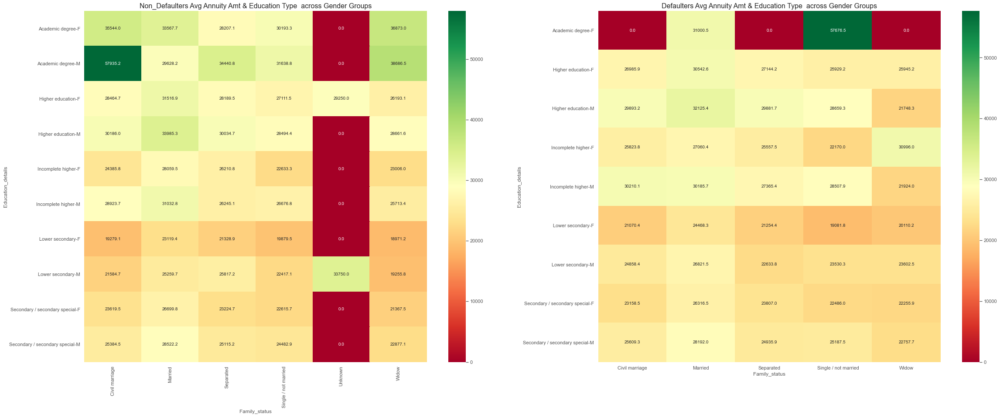

In [163]:
more_than_2_variables(['NAME_EDUCATION_TYPE','CODE_GENDER'],'NAME_FAMILY_STATUS','AMT_ANNUITY','Avg Annuity Amt & Education Type  across Gender Groups','Family_status','Education_details',df_0[df_0["CODE_GENDER"]!="XNA"],df_1[df_1["CODE_GENDER"]!="XNA"])

# Insights:

####  Non-Defaulters:
1. Males with Academic Degree & Civil Marriage status paid the highest Annuity average across the Gender,Education types & Gender groups  
2. Males  with Academic Degree & Family Status - Widow & seperated status group paid the next highest Annuity.
3. Least amount Average Annuity is paid by Married  clients with Seconday/Secondary Special Education Type.

#### Defaulters:
1. Highest amount of Average Annuity is defaulted by Females with Academic Degree & Single/Not Married Status.
2. Next Highest Average Annuity is defaulted by Males with Higher Education & Married status.
3. Least average Annuity is defaulted by Females Lower/Secondary  & Single /Not Married Staatus.


### Name TYPE SUITE, Code Gender vs (Name INCOME TYPE Status) with Respective to Amount Income Total:

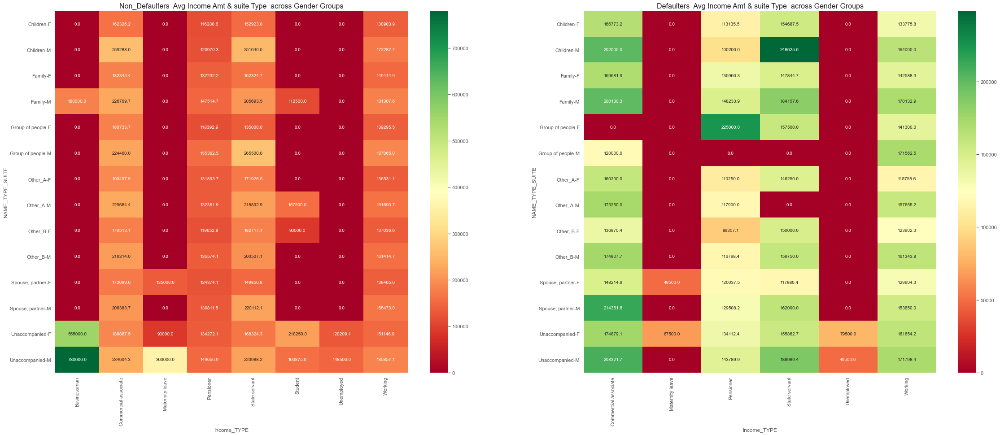

In [164]:
more_than_2_variables(['NAME_TYPE_SUITE','CODE_GENDER'],'NAME_INCOME_TYPE','AMT_INCOME_TOTAL',' Avg Income Amt & suite Type  across Gender Groups','Income_TYPE','NAME_TYPE_SUITE',df_0[df_0["CODE_GENDER"]!="XNA"],df_1[df_1["CODE_GENDER"]!="XNA"])

### Insights:

####  Non-Defaulters:
1. Highest Avg Income groups among Non-Defaulters are Males, Buisnessman & Unaccompained followed by Female,Businessman & Unaccompanied.
2. All the other combinations appear to be the least Avg Inocme groups.
 
#### Defaulters:
1. Highest Avg Income groups who defaulted the Credit are Male,State Servant with Children.
2. The next highest Income group who defaulted is Female,Pensioners with Group of People.
3. Its obseved that all other good average Income groups like Commercial Associate,StateServant & Working groups across all the Accompanied groups also defaulted the Credit.
4. The least average Income groups who defaulted are Females with Maternity Leave accompanied by Spouse/ Patner , Unaccompanied.

#### Average Credit across Age ,Gender& Income Groups:

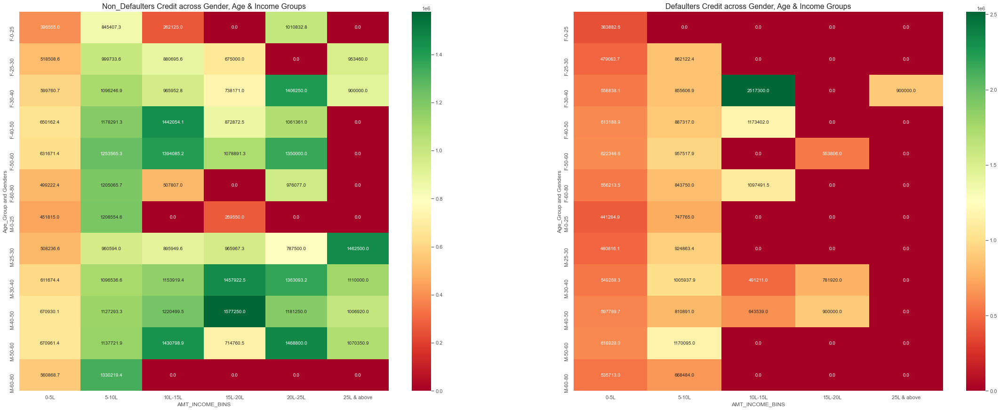

In [165]:
more_than_2_variables(['CODE_GENDER','AGE_Group_Bins'],'AMT_INCOME_BINS','AMT_CREDIT','Credit across Gender, Age & Income Groups','AMT_INCOME_BINS','Age_Group and Genders',df_0[df_0["CODE_GENDER"]!="XNA"],df_1[df_1["CODE_GENDER"]!="XNA"])

#### Insights:

### Average Credit across Occupation_Type& Income Type:

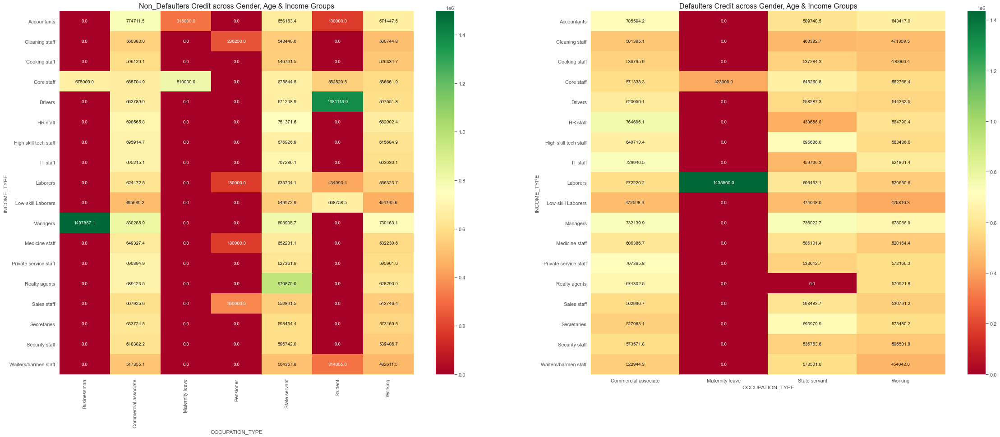

In [166]:
more_than_2_variables(['OCCUPATION_TYPE'],'NAME_INCOME_TYPE','AMT_CREDIT','Credit across Gender, Age & Income Groups','OCCUPATION_TYPE','INCOME_TYPE',df_0[df_0["CODE_GENDER"]!="XNA"],df_1[df_1["CODE_GENDER"]!="XNA"])

### Insights: 

### Average Annuity across Family_status ,Income Range & Credit Range:

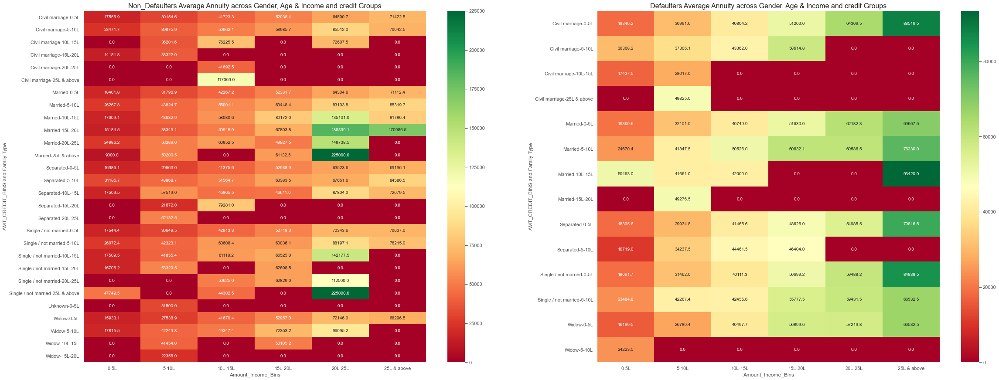

In [167]:
more_than_2_variables(['NAME_FAMILY_STATUS','AMT_INCOME_BINS'],'AMT_CREDIT_BINS','AMT_ANNUITY','Average Annuity across Gender, Age & Income and credit Groups','Amount_Income_Bins','AMT_CREDIT_BINS and Family Type',df_0,df_1)

### Insights:

### Average GOODS PRICE across Age ,Gender& Credit Groups:

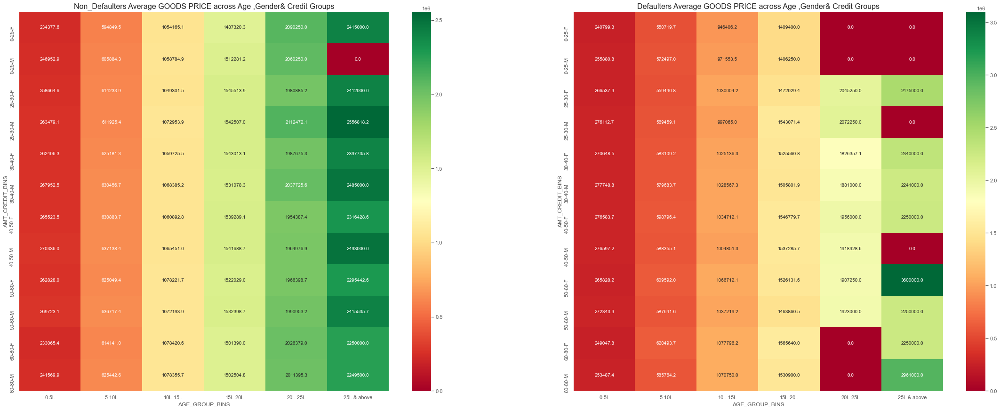

In [168]:
more_than_2_variables(['AGE_Group_Bins','CODE_GENDER'],'AMT_CREDIT_BINS','AMT_GOODS_PRICE','Average GOODS PRICE across Age ,Gender& Credit Groups','AGE_GROUP_BINS','AMT_CREDIT_BINS',df_0[df_0["CODE_GENDER"]!="XNA"],df_1[df_1["CODE_GENDER"]!="XNA"])

#### Insights:

### Previous_application_dataset:

#### Merge the Datasets:

In [169]:
# Here we are making a Left join of application & previous data sets on the common variable SK_ID_CURR :

merged_df = pd.merge(Final_Application_dataset,Final_Previous_Application_dataset , how = 'left' , on = 'SK_ID_CURR' , suffixes = ('_current' , '_previous'))
merged_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_current,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_current,AMT_ANNUITY_current,AMT_GOODS_PRICE_current,NAME_TYPE_SUITE_current,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START_current,HOUR_APPR_PROCESS_START_current,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_BINS,AMT_CREDIT_BINS,AMT_GOODS_BINS,AGE_Group,AGE_Group_Bins,SK_ID_PREV,NAME_CONTRACT_TYPE_previous,AMT_ANNUITY_previous,AMT_APPLICATION,AMT_CREDIT_previous,AMT_GOODS_PRICE_previous,WEEKDAY_APPR_PROCESS_START_previous,HOUR_APPR_PROCESS_START_previous,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_previous,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500,406597,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,1,Laborers,1.0,2,WEDNESDAY,10,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,0-5L,0-5L,2.5L & above,26.0,25-30,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9.0,Y,1.0,XAP,Approved,606.0,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500.0,Auto technology,24.0,low_normal,POS other with interest,365243.0,565.0,125.0,25.0,17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000,1293502,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,Core staff,2.0,1,MONDAY,11,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,0-5L,10L-15L,NaN,46.0,40-50,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12.0,Y,1.0,XNA,Approved,746.0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,1.0,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,716.0,386.0,536.0,527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000,1293502,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,Core staff,2.0,1,MONDAY,11,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,0-5L,10L-15L,NaN,46.0,40-50,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17.0,Y,1.0,XAP,Approved,828.0,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400.0,Furniture,6.0,middle,POS industry with interest,365243.0,797.0,647.0,647.0,639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000,1293502,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,Core staff,2.0,1,MONDAY,11,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,0-5L,10L-15L,NaN,46.0,40-50,2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15.0,Y,1.0,XAP,Approved,2341.0,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200.0,Consumer electronics,12.0,middle,POS household with interest,365243.0,2310.0,1980.0,1980.0,1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,67500,135000,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,1,Laborers,1.0,2,MONDAY,9,0,0,0,Government,0.0,0.0,0.0,0.0,-

In [170]:
## split the merged_dataframe into parts
merged_df_1 = merged_df[merged_df["TARGET"]==1]

merged_df_0 = merged_df[merged_df["TARGET"]==0]


### Univariate Analysis for Previous  application_dataset and merged dataset:

### Name Contract Type :

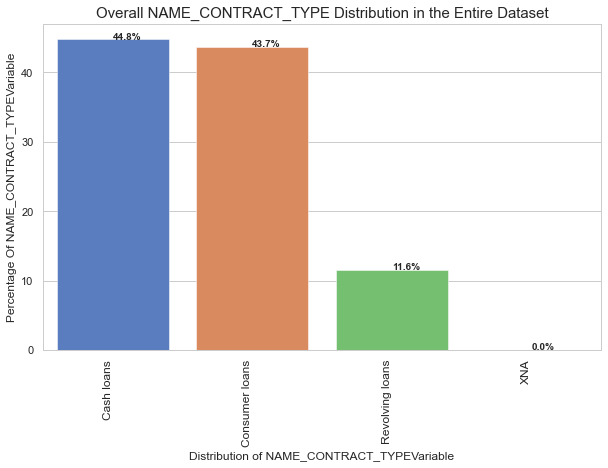

In [171]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_CONTRACT_TYPE","Overall NAME_CONTRACT_TYPE Distribution in the Entire Dataset",0.0)

### Insights:
1. Cash Loans & Consumer Loans appear to be the maximun type of Loans taken 44.8% & 43.7% of the total applicants.
2. Revolving Loans are least taken taken at rate of 11.6%.

### Comparision of Each Variable in Previous, merged_df_1 & merged_df_0 datasets:

### Name Payment Type:

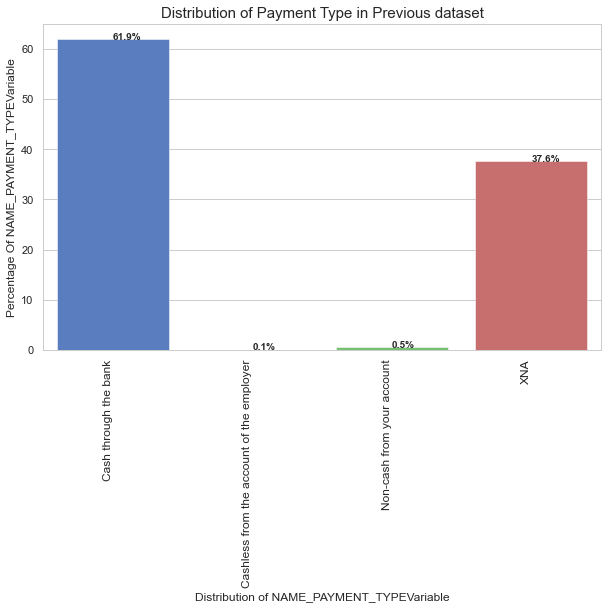

In [172]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_PAYMENT_TYPE","Distribution of Payment Type in Previous dataset",0.0)

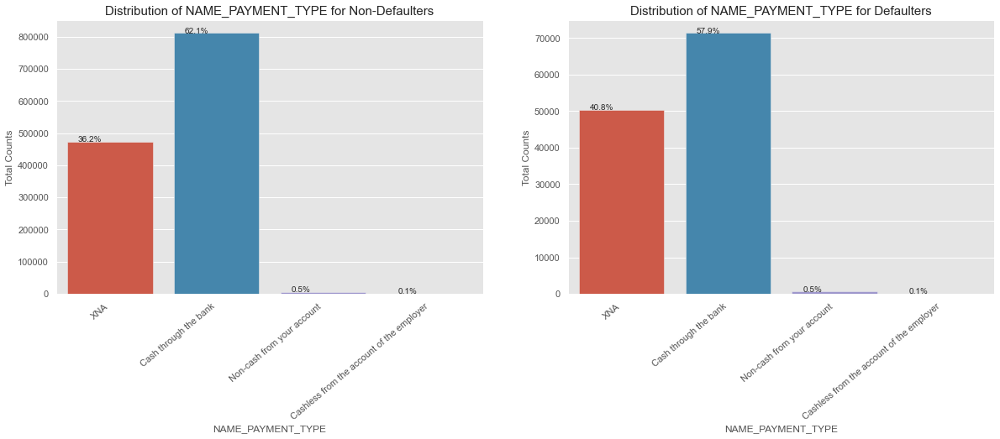

In [173]:
univanal("NAME_PAYMENT_TYPE",merged_df_0,merged_df_1)

### Insights:
1. 61.9% of the Previous applicants opted for Cash through the Bank & least is 0.1%  Cashless from the account of the employer.
2. 62.1% of the Non-Defaulters have also opted for Cash through the Bank least is 0.1%  Cashless from the account of the employer.
3. 57.9% of the Defaulters have also opted for Cash Through the Bank least is 0.1%  Cashless from the account of the employer.

### Comparision of NAME_PORTFOLIO among Previous & Merged Dataset:

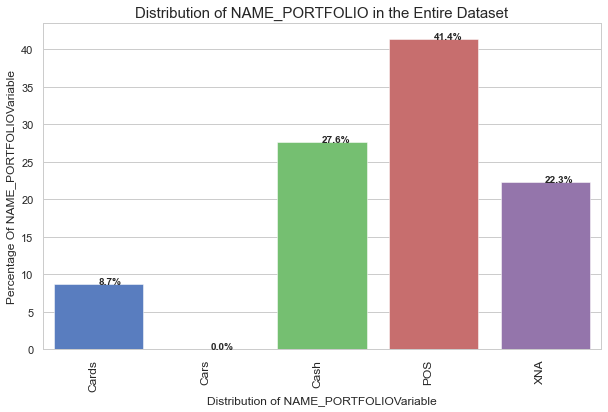

In [174]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_PORTFOLIO","Distribution of NAME_PORTFOLIO in the Entire Dataset",0.0)

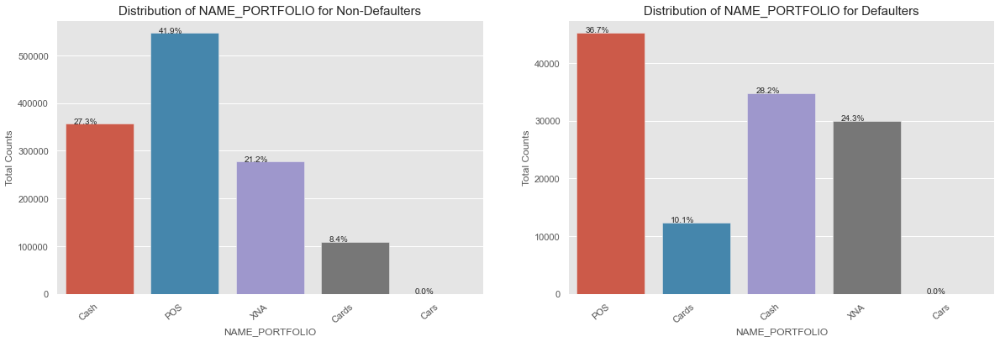

In [175]:
univanal("NAME_PORTFOLIO",merged_df_0,merged_df_1)

### Insights:
1. 41.4% of the total previous applicants have applied for POS &  8.7% is the least applied for cards.
2. 41.9% of the Non-Defaulters have applied for POS & the 8.4 % is the least opted for Cards.
3. 36.7% of the Defaulters have applied for POS & 10.1% have applied for the Cards.

### Comparison of NAME_PRODUCT_TYPE across Previous & Merged Dataset:

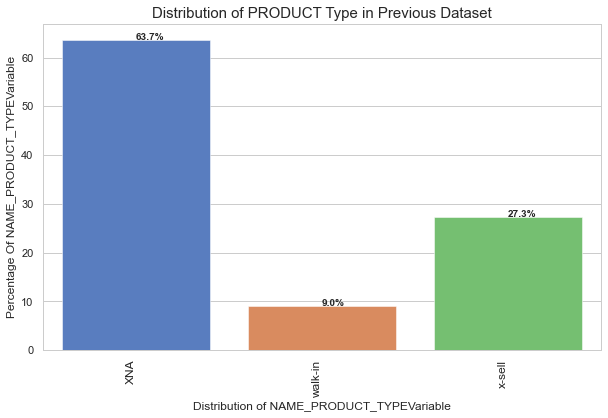

In [176]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_PRODUCT_TYPE","Distribution of PRODUCT Type in Previous Dataset",0.0)

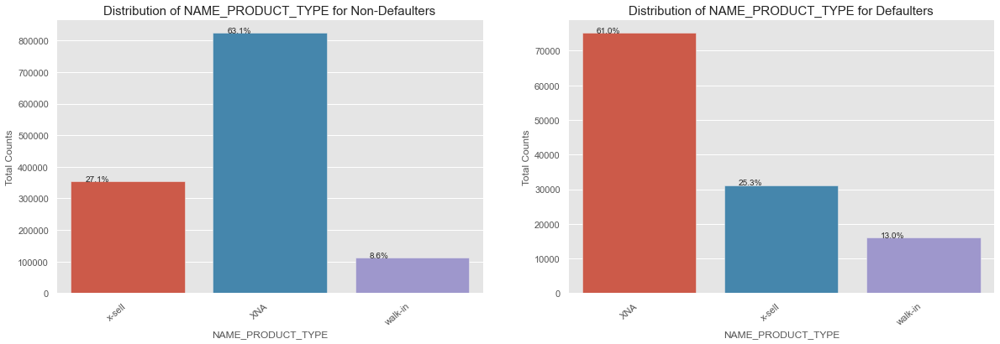

In [177]:
univanal("NAME_PRODUCT_TYPE",merged_df_0,merged_df_1)

# Insights:
1. 63.7% of the Previous applicants have applied for XNA & least is obseved for Walk-in of 9.0%.
2. 63.1% of the Non-Defaulters have applied for XNA & 8.6% have applied for Walk-in in the merged dataset.
3. 61.0% of the Defaulters have applied for XNA & 13.0% have applied for walk-in in the merged data set.

### Comparision of NAME_CONTRACT_STATUS across Previous & Merged datasets:


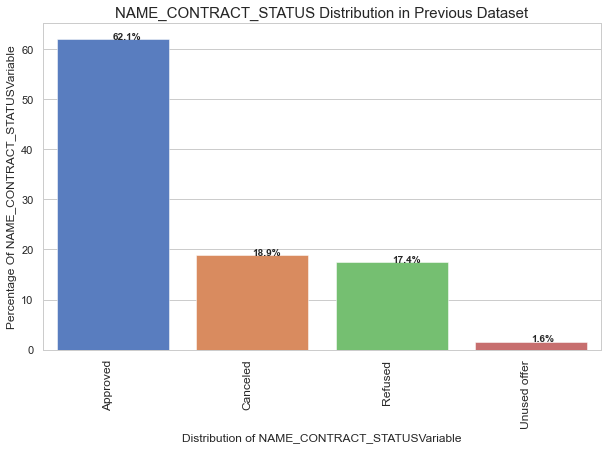

In [178]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_CONTRACT_STATUS","NAME_CONTRACT_STATUS Distribution in Previous Dataset",0.0)

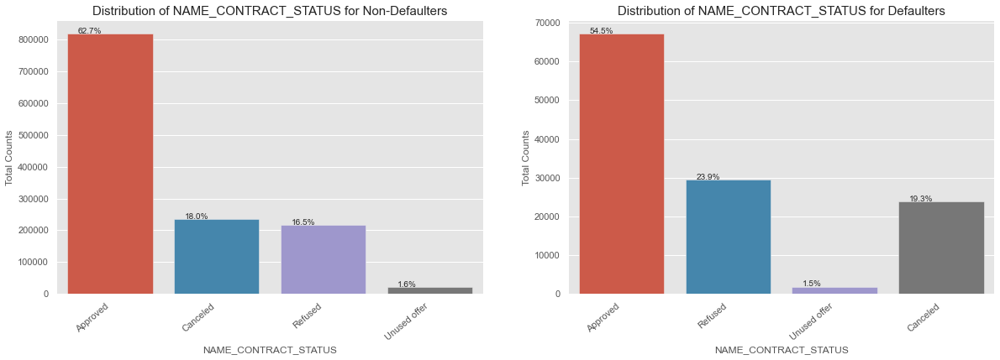

In [179]:
univanal("NAME_CONTRACT_STATUS",merged_df_0,merged_df_1)

### Insights:
1. 62.1% of the total applications have been approved in Previous Dataset.
2. 62.7% of the total Non-Defaulters have been approved with Credit in the merged dataset. 
3. 54.5% of the total Defaulters have been approved with Credit in th merged data set.

### Comparision of NAME_GOODS_CATEGORY across Previous & Merged datasets:


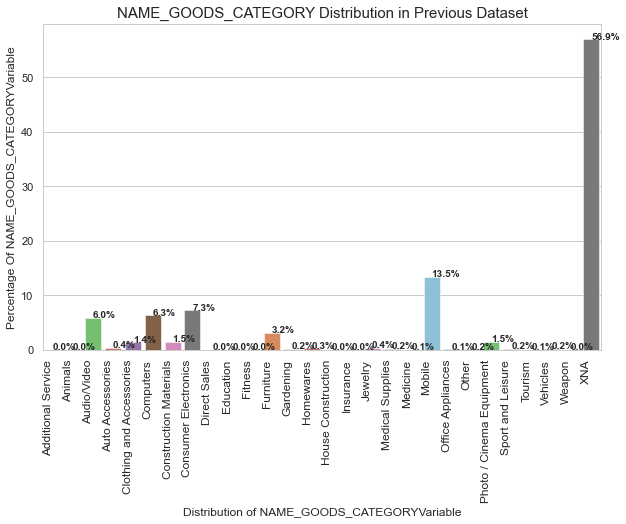

In [180]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_GOODS_CATEGORY","NAME_GOODS_CATEGORY Distribution in Previous Dataset",0.0)

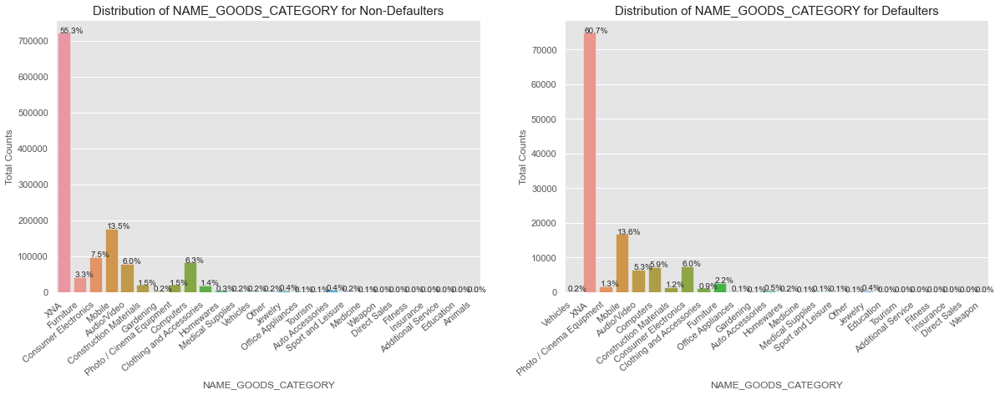

In [181]:
univanal("NAME_GOODS_CATEGORY",merged_df_0,merged_df_1)

### Insights:
1. 56.9% of the total previous applicants have applied for XNA Good Category.
2. 56.3% of the Non-Defaulter have applied for XNA Goods Category.
3. 60.7% of the total Defaulters also opted for XNA.

### Comparision of NAME_YIELD_GROUP across Previous & Merged datasets:


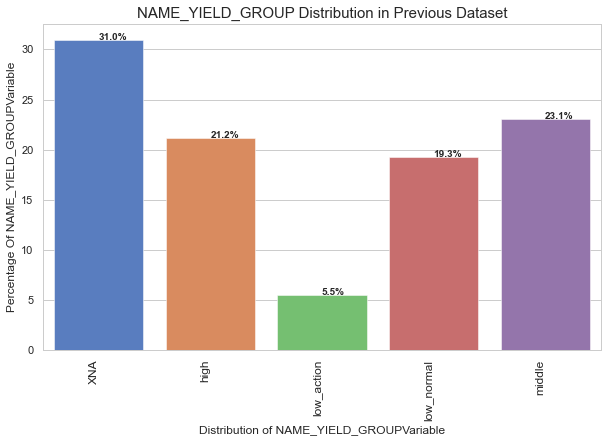

In [182]:
univariate_barchart(Final_Previous_Application_dataset,"NAME_YIELD_GROUP","NAME_YIELD_GROUP Distribution in Previous Dataset",0.0)

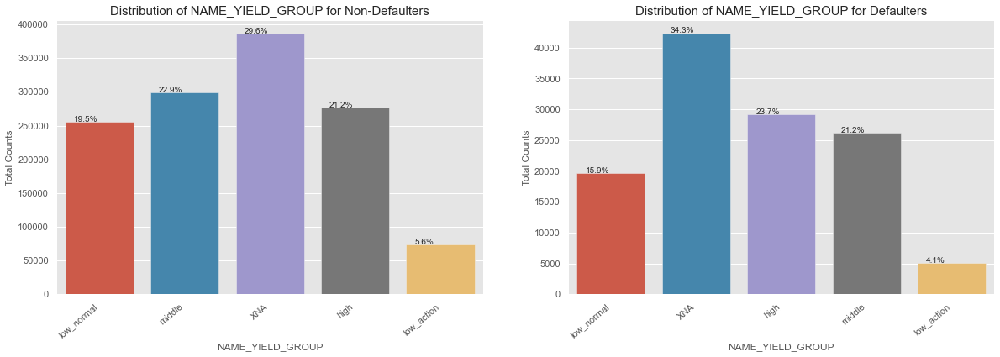

In [183]:
univanal("NAME_YIELD_GROUP",merged_df_0,merged_df_1)

### Insights:

### Comparision of CODE_REJECT_REASON across Previous & Merged datasets:


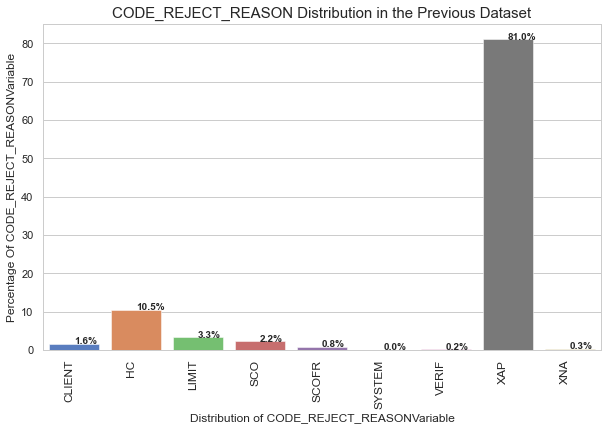

In [184]:
univariate_barchart(Final_Previous_Application_dataset,"CODE_REJECT_REASON","CODE_REJECT_REASON Distribution in the Previous Dataset",0.0)

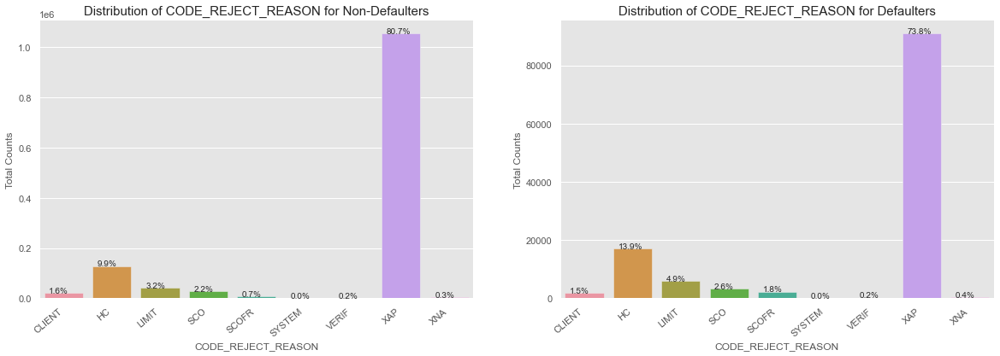

In [185]:
univanal("CODE_REJECT_REASON",merged_df_0,merged_df_1)

### Insights:

### NFLAG_INSURED_ON_APPROVAL:

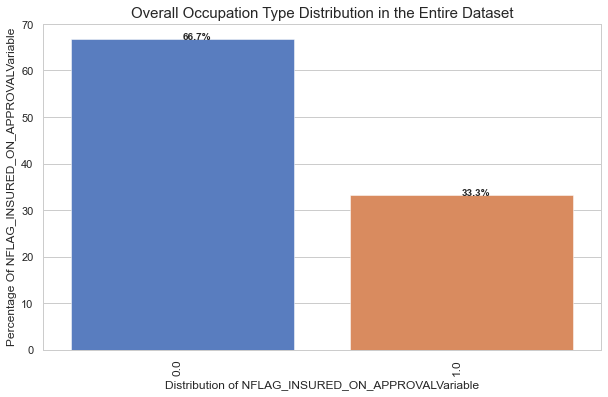

In [186]:
univariate_barchart(Final_Previous_Application_dataset,"NFLAG_INSURED_ON_APPROVAL","Overall Occupation Type Distribution in the Entire Dataset",0.0)

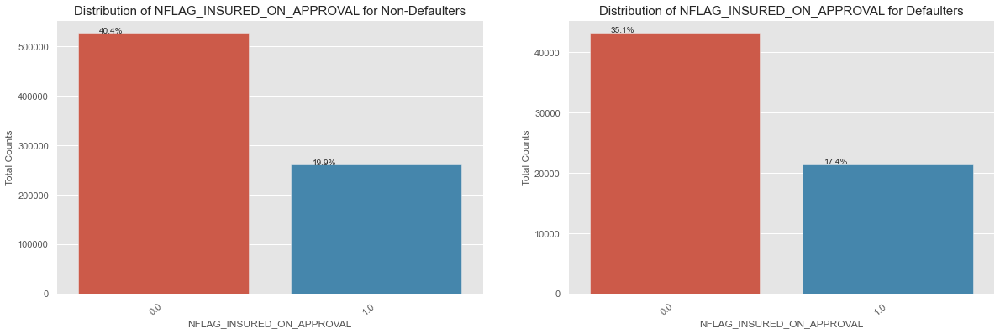

In [187]:
univanal("NFLAG_INSURED_ON_APPROVAL",merged_df_0,merged_df_1)

#### Insights:

### Numerical to Numerical Analysis:

### Overall Correlation with Respective to Merged Dataset.

In [188]:
correlation_function(merged_df,0.0)

,VAR1,VAR2,Pearson_Correlation
0,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
1,AGE_Group,DAYS_BIRTH,1.00
2,AMT_GOODS_PRICE_previous,AMT_APPLICATION,1.00
3,AMT_GOODS_PRICE_previous,AMT_CREDIT_previous,0.99
4,AMT_GOODS_PRICE_current,AMT_CREDIT_current,0.99
...,...,...,...
534,OBS_60_CNT_SOCIAL_CIRCLE,AMT_ANNUITY_current,0.01
535,DEF_30_CNT_SOCIAL_CIRCLE,REGION_RATING_CLIENT,0.01
536,DAYS_REGISTRATION,AMT_GOODS_PRICE_current,0.01
537,DAYS_REGISTRATION,AMT_CREDIT_current,0.01


### Target_1  -  Defaulters - Heatmap:

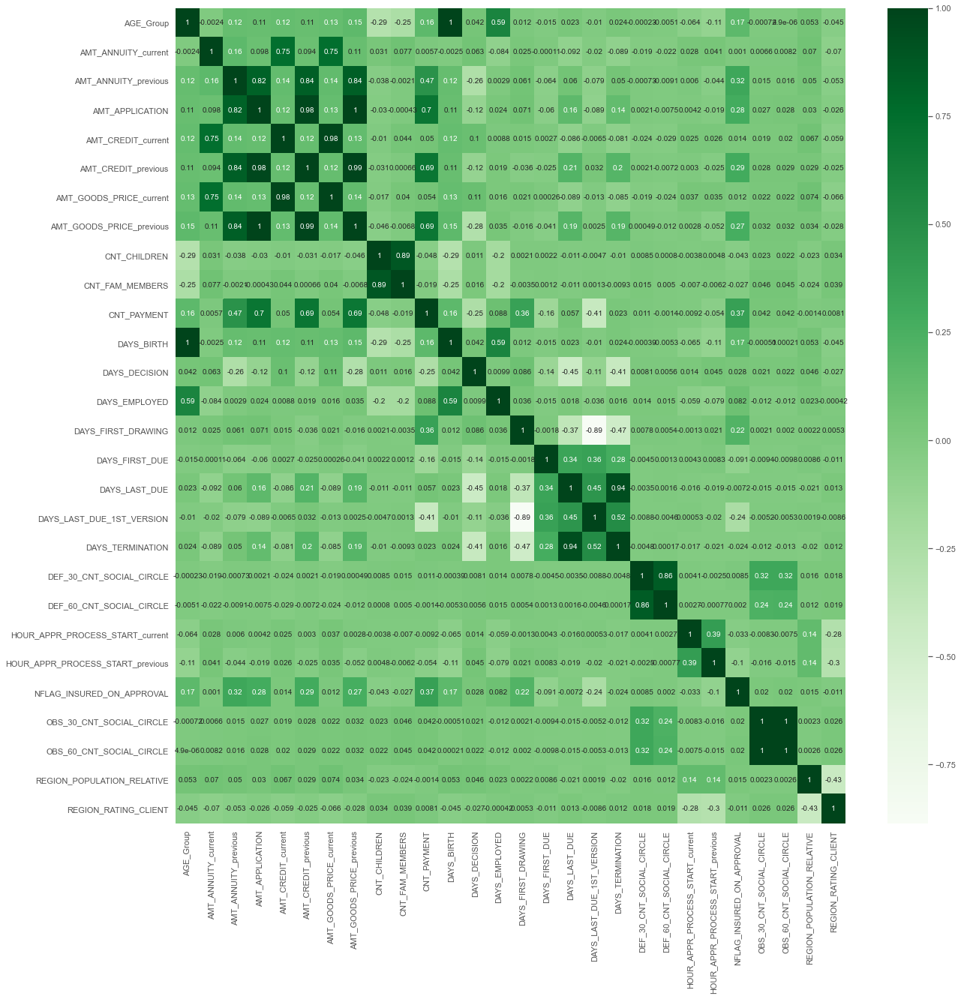

In [189]:
plt.figure(figsize=(20,20))

number_columns = merged_df_1.select_dtypes(include=["number"]).columns

#merged_df_1 = merged_df_1[important_columns]

#merged_df_0 = merged_df_0[important_columns]


var1_columns = correlation_function(merged_df_1,0.0).head(40)["VAR1"].unique()

var2_columns = correlation_function(merged_df_1,0.0).head(40)["VAR2"].unique()

final_columns = np.unique(np.concatenate((var1_columns, var2_columns), axis=None))


sns.heatmap(merged_df_1[final_columns].astype(float).corr() ,cmap = 'Greens' , annot = True)


plt.show()

### Insights:
1. The top 10 Correlated variables are:
 1. AMT_APPLICATION - AMT_CREDIT_previous
 2. AMT_GOODS_PRICE_previous - AMT_CREDIT_previous 
 3. DAYS_LAST_DUE - DAYS_TERMINATION
 4. AMT_CREDIT_current -AMT_GOODS_PRICE_current
 5. CNT_CHILDREN - CHT_FAMILY_MEMBERS 
 6. AMT_ANNUITY_previous - AMT_GOODS_PRICE_previous
 7. AMT_ANNUITY_previous - AMT_CREDIT_previous
 8. AMT_ANUUITY_current - AMT_CREDIT_currentlk

### Target_0  -  Defaulters - Heatmap:

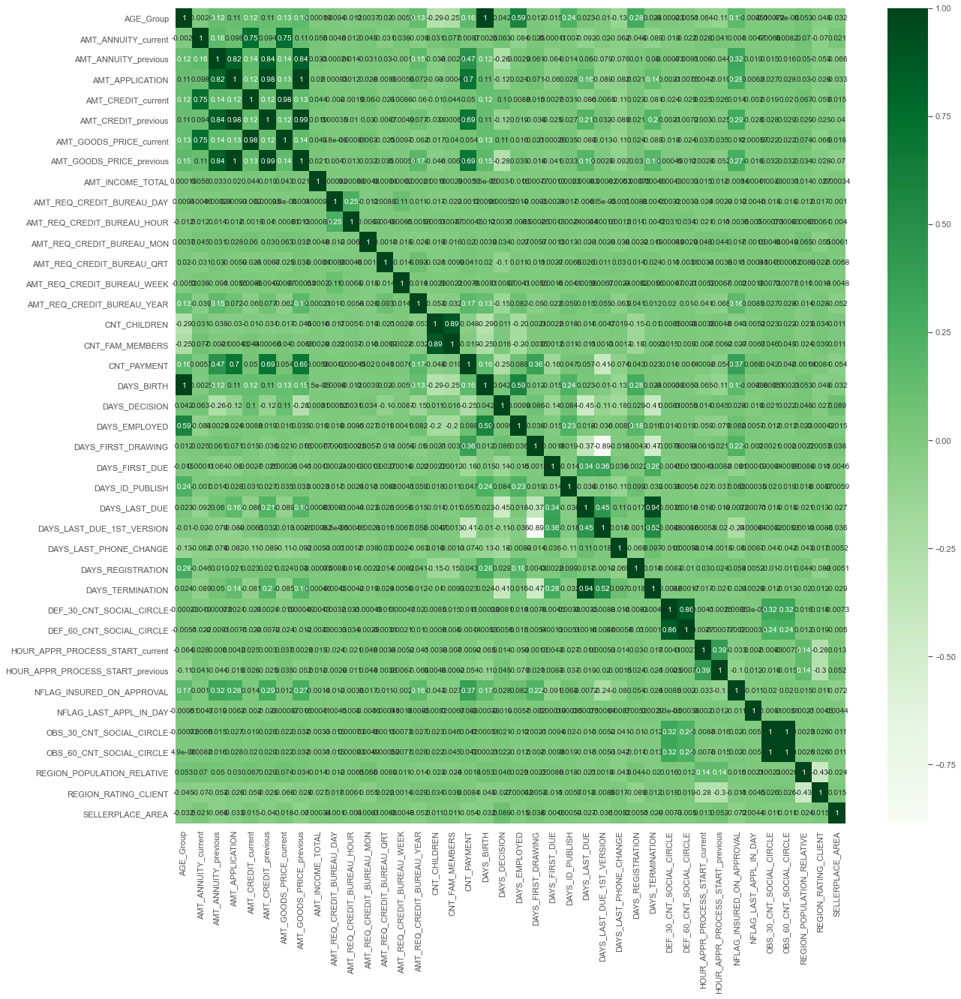

In [190]:
plt.figure(figsize=(20,20))

number_columns = merged_df_1.select_dtypes(include=["number"]).columns

var1_columns = correlation_function(merged_df_0,0.0)["VAR1"].unique()

var2_columns = correlation_function(merged_df_0,0.0)["VAR2"].unique()

final_columns = np.unique(np.concatenate((var1_columns, var2_columns), axis=None))


sns.heatmap(merged_df_1[final_columns].astype(float).corr() ,cmap = 'Greens' , annot = True)


plt.show()

### Insights:

#### Scatterplots: 

### Since we have already most of the combinations in above, we are making scatterplots and line plots again which are not covered in the application dataset.

In [191]:
important_columns = [ 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_previous', 'AMT_ANNUITY_previous', 'AMT_GOODS_PRICE_previous','AMT_GOODS_PRICE_current',
        'AMT_CREDIT_current','AMT_ANNUITY_current',
       'CNT_FAM_MEMBERS','AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR','DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE',
       'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION','AMT_APPLICATION']

#### Amount Application vs Amount Income total:

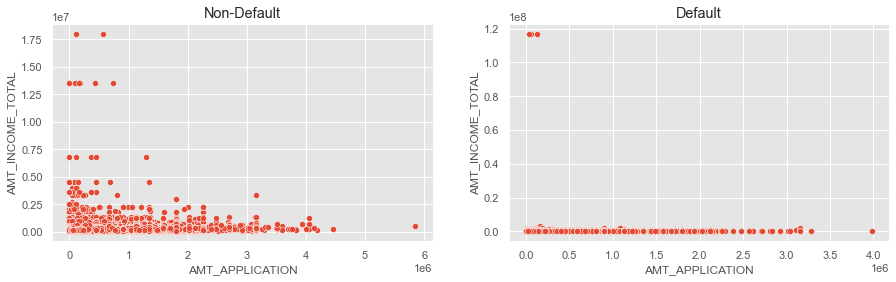

In [192]:

bivariate_scatterplot('AMT_APPLICATION','AMT_INCOME_TOTAL',merged_df_0,merged_df_1)

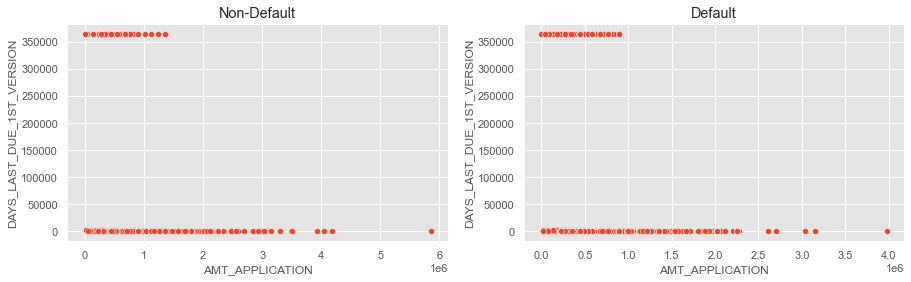

In [193]:
bivariate_scatterplot('AMT_APPLICATION','DAYS_LAST_DUE_1ST_VERSION',merged_df_0,merged_df_1)

### Line plots:

### Amount Goods Price Current vs Amount Goods Price Previous.

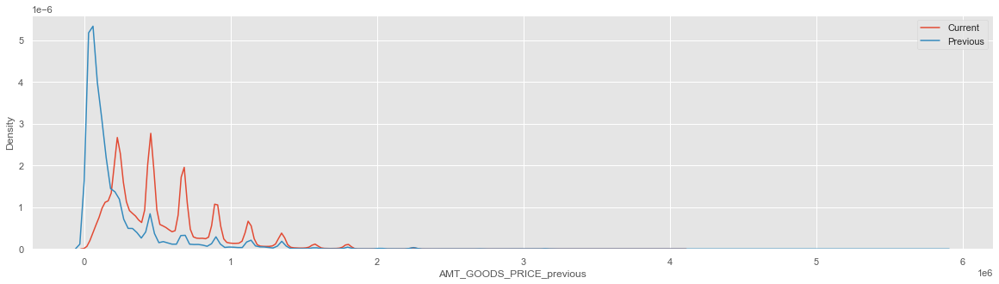

In [194]:
plt.figure(figsize = (20,5))

sns.distplot(merged_df['AMT_GOODS_PRICE_current'] , hist = False , label='Current')
sns.distplot(merged_df['AMT_GOODS_PRICE_previous'] , hist = False , label='Previous')

plt.legend() 
plt.show()

#### Insights:

#### Amount Annuity current vs Amount Annuity Previous:

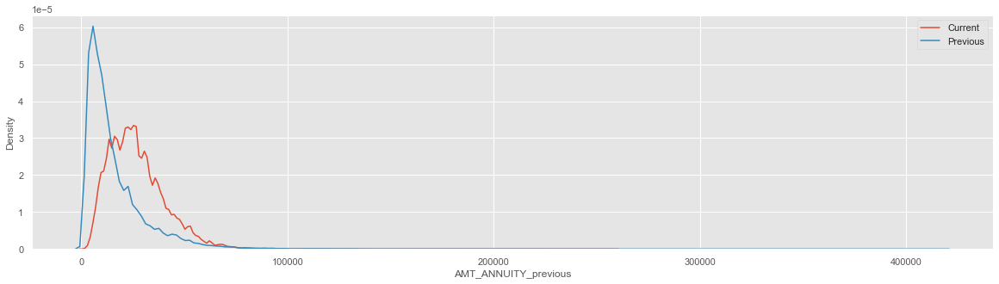

In [195]:
plt.figure(figsize = (20,5))

sns.distplot(merged_df['AMT_ANNUITY_current'] , hist = False , label='Current')
sns.distplot(merged_df['AMT_ANNUITY_previous'] , hist = False , label='Previous')

plt.legend() 
plt.show()

### Insights:

#### Categorical to Categorical :
####  1. Categorical to categorical with respective to target Variable.
####  2.Catgeorical to Categorical with respective to 2 categories.

### Categorical to Categorical with respective to target Variable:

#### Name Contract Status vs Name Education Type:

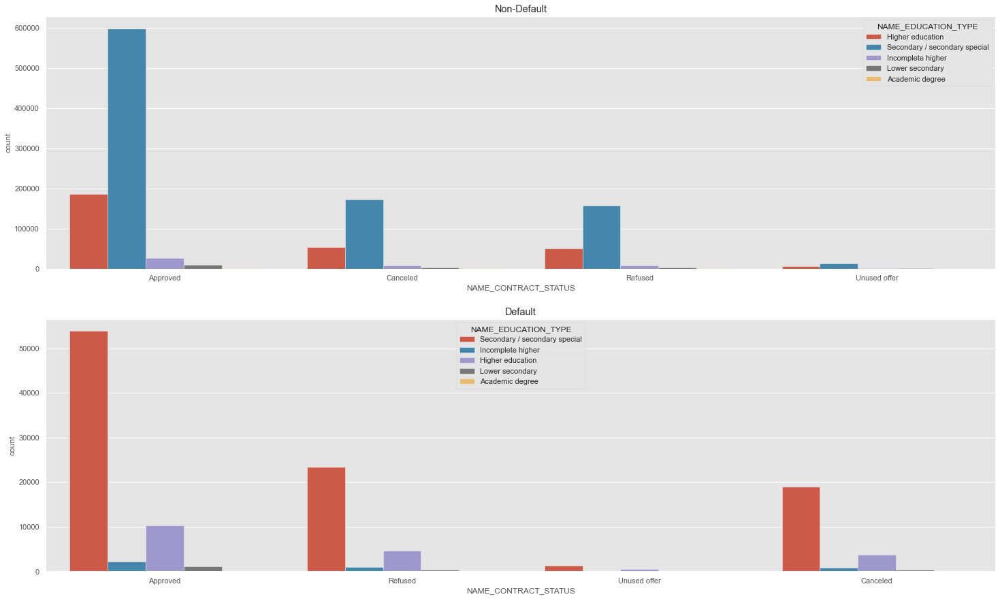

In [202]:
categorical_to_categorical("NAME_CONTRACT_STATUS","NAME_EDUCATION_TYPE",merged_df_0,merged_df_1)

### Insights:

1. Most of the Approved Credit & Non-Defaulters Educations is Secondary/Secondary Special.
2. Most of the Approved Credit & Defaulters Education is also Secondary/Secondary Special.

#### Name Contract status vs Code Gender:

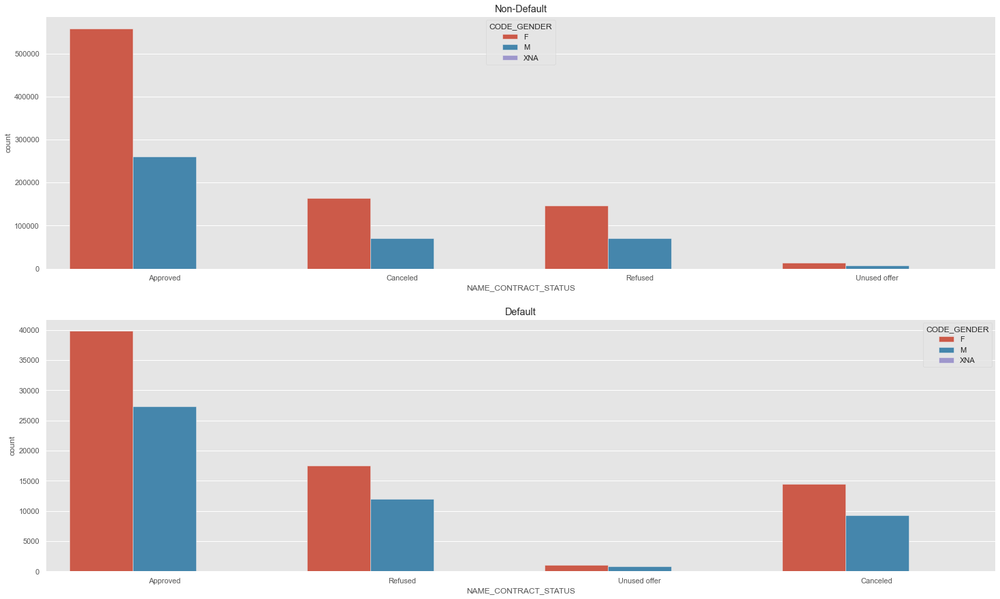

In [204]:
categorical_to_categorical("NAME_CONTRACT_STATUS","CODE_GENDER",merged_df_0,merged_df_1)

### Insights:


### Name contract status vs Name Housing type:

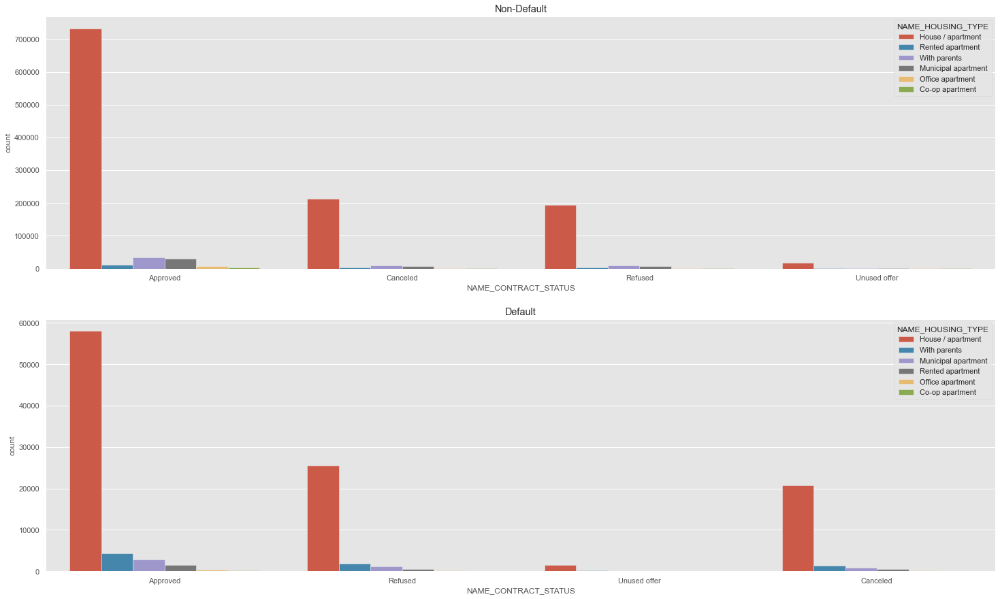

In [205]:
merged_df_1.columns


categorical_to_categorical("NAME_CONTRACT_STATUS","NAME_HOUSING_TYPE",merged_df_0,merged_df_1)

#### Insights: 

#### Name Contract status vs Name Portfolio:

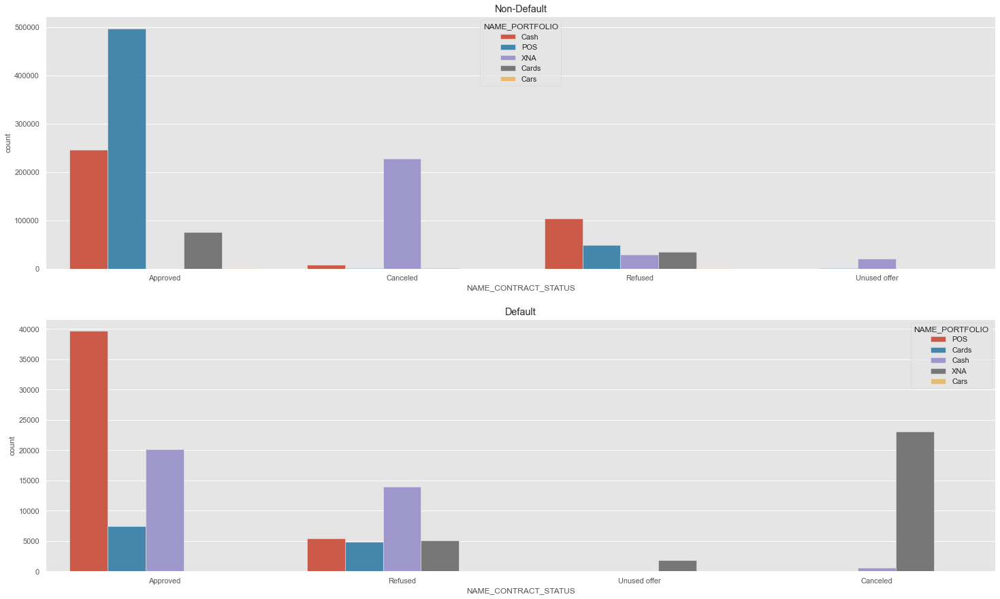

In [210]:
merged_df_1.columns

categorical_to_categorical("NAME_CONTRACT_STATUS","NAME_PORTFOLIO",merged_df_0,merged_df_1)

### Insights:

### 1. Most of the Non-Defaulted Credit is Approved for POS Portfolio & the least approved is for Cash.
#### 2. Most of the Defualted Credit is Approved for POS  & the least is approved for Cards.

#### Name Contract status vs Channel Type: 

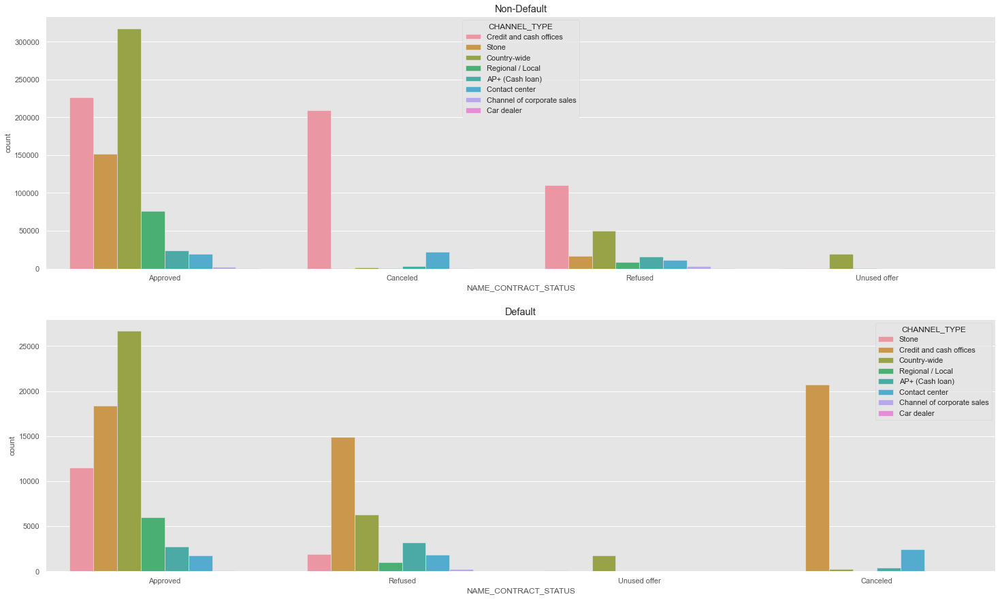

In [211]:
merged_df_1.columns

categorical_to_categorical("NAME_CONTRACT_STATUS","CHANNEL_TYPE",merged_df_0,merged_df_1)

# Insights:
1. Most of the Non-Defaulted Credit is approved in Previous application through the Channel - 'Country-Wide' & least is approve through "Channel of corporate sales".
2. Most of the Defaulted Credit is approved through Country-Wide Channel & least is approved through Contact Number.

#### Name Contract Status vs Product combination:

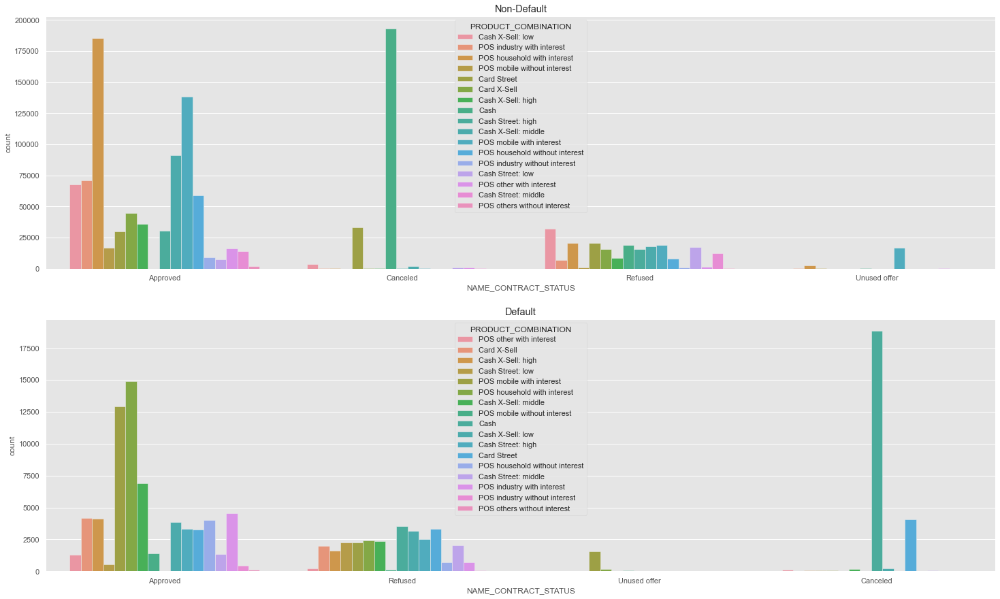

In [208]:
merged_df_1.columns

categorical_to_categorical("NAME_CONTRACT_STATUS","PRODUCT_COMBINATION",merged_df_0,merged_df_1)


#### Insights:

### Categorical to Categorical with respective to Name contract status :


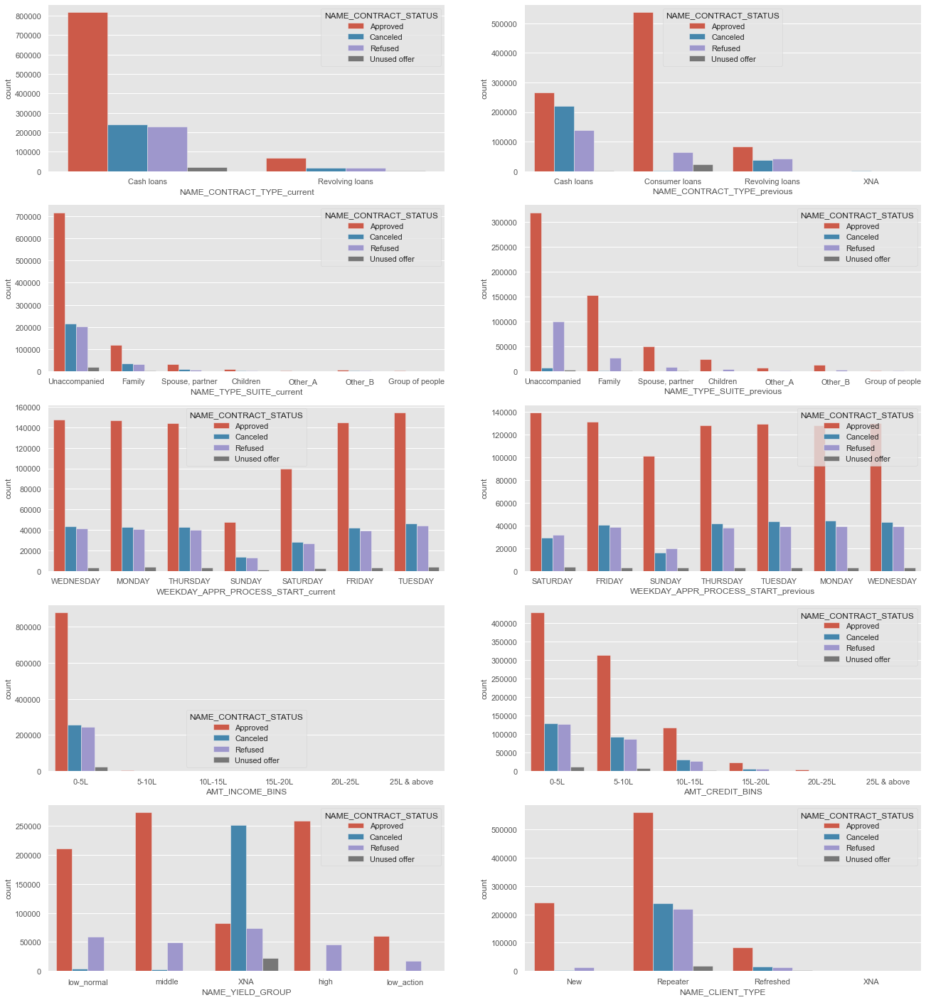

In [215]:
categorical_columns=['NAME_CONTRACT_TYPE_current','NAME_CONTRACT_TYPE_previous',
                     'NAME_TYPE_SUITE_current','NAME_TYPE_SUITE_previous',
                     'WEEKDAY_APPR_PROCESS_START_current','WEEKDAY_APPR_PROCESS_START_previous',
                    'AMT_INCOME_BINS','AMT_CREDIT_BINS','NAME_YIELD_GROUP','NAME_CLIENT_TYPE']


plt.figure(figsize=(22,25))
for i in (enumerate(categorical_columns)):
    plt.subplot(len(categorical_columns)//2,2,i[0]+1)
    sns.countplot(x=i[1],hue='NAME_CONTRACT_STATUS',data=merged_df)
    #lt.yscale('log')
    #plt.xticks(rotation=90)
plt.show()

#### Insights:

1. Repeater has highest number of approved loans.
2. Middle NAME_YIELD_GROUP has highest approval.
3. Value of AMT_CREDIT_BIN does not affect loan approvals.
4. for Medium AMT_INCOME_TOTAL_bin the approval is highest in previous application saturday has the highest approval rate,but in current application it is tuesday.
5. both in NAME_CONTRACT_TYPE_Previous and NAME_CONTRACT_TYPE_Current unaccompanied has the highest number.
6. currently bank is only giving two types of loans -Cash and Revolving Loans.
7. Previously bank was providing Cash, Revolving and Consumer loans.
8. Number of consumer loans were highest previously and now highest number is Cash loans.

#### Categorical to Numerical Analysis:

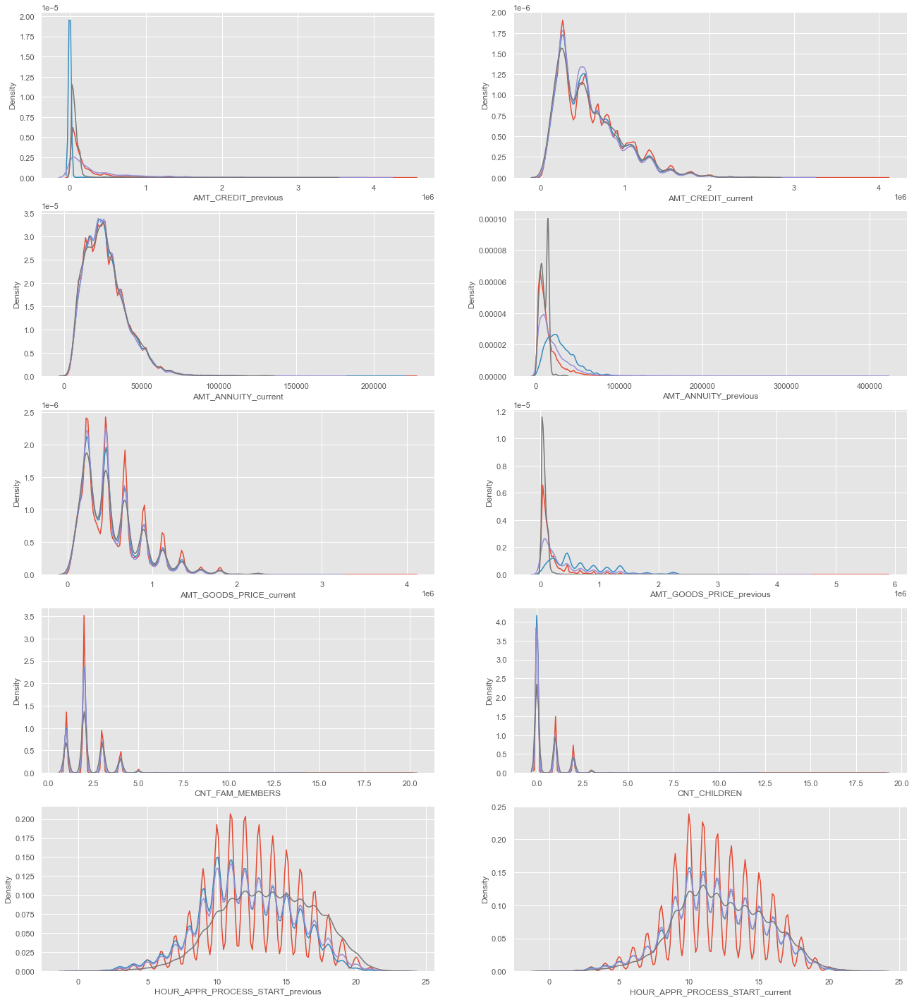

In [217]:
# Univariate Numerical analysis
continous_columns=['AMT_CREDIT_previous','AMT_CREDIT_current','AMT_ANNUITY_current','AMT_ANNUITY_previous',
                   'AMT_GOODS_PRICE_current','AMT_GOODS_PRICE_previous','CNT_FAM_MEMBERS','CNT_CHILDREN',
                  'HOUR_APPR_PROCESS_START_previous','HOUR_APPR_PROCESS_START_current']
plt.figure(figsize=(22,25))
for i in (enumerate(continous_columns)):
    plt.subplot(len(continous_columns)//2,2,i[0]+1)
    sns.distplot(merged_df.loc[merged_df.NAME_CONTRACT_STATUS=='Approved',:][i[1]].dropna(),hist=False,label='Approved')
    sns.distplot(merged_df.loc[merged_df.NAME_CONTRACT_STATUS=='Canceled',:][i[1]].dropna(),hist=False,label='Canceled',kde_kws={'bw':0.1})
    sns.distplot(merged_df.loc[merged_df.NAME_CONTRACT_STATUS=='Refused',:][i[1]].dropna(),hist=False,label='Refused',kde_kws={'bw':0.1})
    # we added kde_kws={'bw':0.1} in parameter to overcome bandwidth limitation.
    sns.distplot(merged_df.loc[merged_df.NAME_CONTRACT_STATUS=='Unused offer',:][i[1]].dropna(),hist=False,label='Unused offer')

plt.show()

#### Insights:

#### As we can see from graphs

1. High number of applications are filed in 9 AM to 2 PM for both Current and Previous data.So busiest hours for bank are form 9 AM to 2 PM.
2. nuclear family tends to take more loans.
3. Previously bank had high unused offers but currently refused is high incase of AMT_GOODS_PRICE.
4. Previously bank had high unused offers and currently cancelled/refused offers are similar for AMT_ANNUITY.
5. Previously bank had high unused offers and currently high number of refused offers for AMT_CREDIT.

#### Heatmaps:

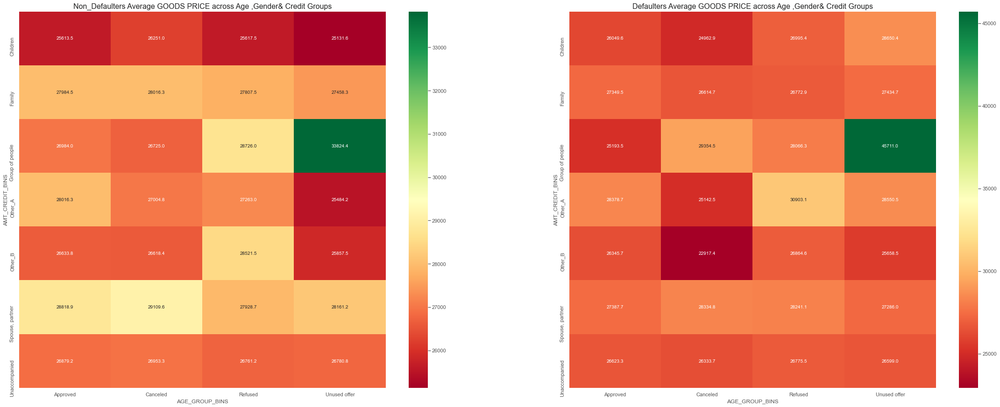

In [227]:
more_than_2_variables(['NAME_TYPE_SUITE_current'],'NAME_CONTRACT_STATUS','AMT_ANNUITY_current','Average GOODS PRICE across Age ,Gender& Credit Groups','AGE_GROUP_BINS','AMT_CREDIT_BINS',merged_df_0[merged_df_0["CODE_GENDER"]!="XNA"],merged_df_1[merged_df_1["CODE_GENDER"]!="XNA"])

### Insights:

#### Conclusions: